#**AI + Logistics & Supply Chain:** Synthetic Early Fault Data Generation for Bearing Fault Diagnosis Using GAN-Based Models

## Introduction

We chose the theme AI + Logistics & Supply Chain because bearings are essential components in transportation and logistics systems, including trucks, conveyor belts, warehouse equipment, and delivery vehicles. Bearing failures can cause unexpected downtime, delivery delays, increased maintenance costs, and disruptions across supply chain operations.

In this project, we investigate how Artificial Intelligence (AI) can support predictive maintenance through the generation of synthetic early-stage bearing fault data. Since real early-fault data is often limited, we utilize GAN-based models and the CWRU bearing dataset to generate realistic fault signals that can improve fault diagnosis and maintenance planning.

Ultimately, this work aims to contribute to more reliable logistics operations by enabling earlier fault detection, reducing equipment downtime, and supporting more efficient fleet and asset management.


## Team Members and Contributions


1. **마히라 소피아** (2023320033)
   I led the full 1D experiment pipeline (E1–E9). I designed and trained the GAN family models including plain GAN, CGAN, WGAN-GP, FiLM conditioning, ResBlock, and Frequency-Aware variants. I conducted waveform analysis, structure metrics evaluation (ACF, PSD, envelope similarity), severity sweep analysis, and downstream classifier evaluation.

2. **Abdullah Feras Mohammed Hassan** (2024320052)
Validated and debugged the full codebase to ensure reproducibility. Developed the baseline WGAN-GP implementation and training pipeline, which provided the foundation for the subsequent GAN variants explored in the project. Implemented and conducted the 2D spectrogram extension, including spectrogram generation and visualization.

3. **마랄마** (2022320170)

4. **하짐** (2024320103)

5. **아흐마드 나우팔** (2023320085)

In [ ]:
# ── CELL 1: IMPORTS + SEED ────────────────────────────────────────────
import os
import random
import numpy as np
import pandas as pd
import scipy.io
import matplotlib.pyplot as plt
import kagglehub

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from scipy.signal import welch
from scipy.stats import wasserstein_distance

# ── Seed ──────────────────────────────────────────────────────────────
SEED = 42

def set_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

set_seed()

# ── Device ────────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("=" * 40)
print(f"  Seed   : {SEED}")
print(f"  Device : {device}")
print("=" * 40)


  Seed   : 42
  Device : cuda


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# ── Paths ─────────────────────────────────────────────────────────────
DRIVE_ROOT   = "/content/drive/MyDrive/ml_project"
CKPT_DIR     = os.path.join(DRIVE_ROOT, "checkpoints")
RESULTS_DIR  = os.path.join(DRIVE_ROOT, "results")

os.makedirs(CKPT_DIR,    exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

RESULTS_TABLE = {}  # filled by each eval cell, used in Cell 11

print("=" * 45)
print("  GLOBAL CONFIG")
print("=" * 45)
print(f"  Drive root    : {DRIVE_ROOT}")
print(f"  Checkpoint dir: {CKPT_DIR}")
print(f"  Results dir   : {RESULTS_DIR}")
print("=" * 45)


  GLOBAL CONFIG
  Drive root    : /content/drive/MyDrive/ml_project
  Checkpoint dir: /content/drive/MyDrive/ml_project/checkpoints
  Results dir   : /content/drive/MyDrive/ml_project/results


In [ ]:
# ── CELL 3: GLOBAL HELPERS ────────────────────────────────────────────

import scipy.io
import kagglehub

# ── 1. Windowing ──────────────────────────────────────────────────────
def segment_signal(signal, window_size, overlap=0.5):
    step     = int(window_size * (1 - overlap))
    segments = []
    for i in range(0, len(signal) - window_size + 1, step):
        segments.append(signal[i:i + window_size])
    return np.array(segments)


# ── 2. Normalization ──────────────────────────────────────────────────
def normalize_segments(segments):
    normalized = []
    for seg in segments:
        mn  = seg.min()
        mx  = seg.max()
        seg = 2 * (seg - mn) / (mx - mn + 1e-8) - 1  # → [-1, 1]
        normalized.append(seg)
    return np.array(normalized)


# ── 3. Build dataloader ───────────────────────────────────────────────
def make_dataloader(segments, batch_size, alpha=None):
    """
    segments : np.array (N, window_size)
    alpha    : float or None
               if float → also returns severity labels (for CGAN / WGAN-GP)
    """
    x = torch.FloatTensor(segments).unsqueeze(1)  # (N, 1, W)

    if alpha is not None:
        a       = torch.full((len(segments), 1), alpha, dtype=torch.float32)
        dataset = TensorDataset(x, a)
    else:
        dataset = TensorDataset(x)

    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        generator=torch.Generator().manual_seed(SEED)
    )
    return loader


# ── 4. Visualize synthetic vs real ────────────────────────────────────
def plot_synthetic_vs_real(syn_signals, data, window_size, model_name="Model"):
    """
    syn_signals : np.array (N, window_size) — at least 5 samples
    """
    n      = min(5, len(syn_signals))
    colors = ["green", "limegreen", "darkgreen", "mediumseagreen", "seagreen"]

    fig, axes = plt.subplots(n + 2, 1, figsize=(13, (n + 2) * 2.5))

    axes[0].plot(data["normal"][:window_size], color="steelblue", linewidth=0.8)
    axes[0].set_title(f"Real Normal  (std={data['normal'].std():.4f})")
    axes[0].set_ylabel("Amplitude")
    axes[0].grid(True, alpha=0.3)

    for i in range(n):
        axes[i + 1].plot(syn_signals[i], color=colors[i], linewidth=0.8)
        axes[i + 1].set_title(
            f"{model_name} Synthetic Sample {i+1}  "
            f"(std={syn_signals[i].std():.4f})")
        axes[i + 1].set_ylabel("Amplitude")
        axes[i + 1].grid(True, alpha=0.3)

    axes[-1].plot(data["ball_007"][:window_size], color="tomato", linewidth=0.8)
    axes[-1].set_title(f"Real Ball007  (std={data['ball_007'].std():.4f})")
    axes[-1].set_ylabel("Amplitude")
    axes[-1].set_xlabel("Sample index")
    axes[-1].grid(True, alpha=0.3)

    plt.suptitle(f"{model_name} — Synthetic vs Real Signals",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


# ── 5. Save checkpoint ────────────────────────────────────────────────
def save_checkpoint(payload, filename):
    path = os.path.join(CKPT_DIR, filename)
    torch.save(payload, path)
    print(f"  Saved → {path}")


# ── 6. Load checkpoint ────────────────────────────────────────────────
def load_checkpoint(filename):
    path = os.path.join(CKPT_DIR, filename)
    ckpt = torch.load(path, weights_only=False)
    print(f"  Loaded ← {path}")
    return ckpt


# ── 7. Epoch log ──────────────────────────────────────────────────────
def print_epoch(epoch, max_epoch, g_loss, d_loss,
                syn_std=None, score=None,
                patience=None, max_patience=None, saved=False):
    tag     = " <- best" if saved else ""
    std_str = ""
    if syn_std is not None:
        std_str = (f" | syn_std={syn_std:.4f}"
                   f" | score={score:.4f}"
                   f" | patience={patience}/{max_patience}")
    print(f"  Epoch {epoch:03d}/{max_epoch}"
          f" | G={g_loss:.4f} | D={d_loss:.4f}"
          f"{std_str}{tag}")


In [ ]:
# ── 8. MMD score ──────────────────────────────────────────────────────
def compute_mmd(x, y, sigma=1.0):
    """
    Maximum Mean Discrepancy between x and y
    lower = more similar distributions
    """
    def rbf_kernel(a, b):
        a  = torch.FloatTensor(a)
        b  = torch.FloatTensor(b)
        sq = torch.cdist(a, b) ** 2
        return torch.exp(-sq / (2 * sigma ** 2))
    xx = rbf_kernel(x, x).mean()
    yy = rbf_kernel(y, y).mean()
    xy = rbf_kernel(x, y).mean()
    return (xx + yy - 2 * xy).item()


# ── 9. t-SNE plot ─────────────────────────────────────────────────────
def plot_tsne(syn_sigs, data, window_size, model_name, n_tsne=200):
    from sklearn.manifold import TSNE
    real_normal = normalize_segments(
        segment_signal(normal_sig,  window_size))[:n_tsne]
    real_b007   = normalize_segments(
        segment_signal(ball007_sig, window_size))[:n_tsne]
    real_b021   = normalize_segments(
        segment_signal(ball021_sig, window_size))[:n_tsne]
    syn_tsne    = syn_sigs[:n_tsne]

    all_signals = np.concatenate([real_normal, real_b007,
                                   real_b021,  syn_tsne], axis=0)
    all_labels  = (["Normal"]    * n_tsne +
                   ["Real B007"] * n_tsne +
                   ["Real B021"] * n_tsne +
                   ["Syn B007"]  * n_tsne)

    print(f"\n  Running t-SNE...")
    tsne     = TSNE(n_components=2, random_state=SEED, perplexity=30)
    embedded = tsne.fit_transform(all_signals)

    colors_map = {
        "Normal"   : "steelblue",
        "Real B007": "tomato",
        "Real B021": "darkorange",
        "Syn B007" : "green",
    }

    fig, ax = plt.subplots(figsize=(8, 6))
    for label, color in colors_map.items():
        mask = [l == label for l in all_labels]
        ax.scatter(embedded[mask, 0], embedded[mask, 1],
                   c=color, label=label, alpha=0.5, s=15)
    ax.set_title(f"{model_name} — t-SNE (Synthetic vs Real)")
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# ── 10. PSD comparison plot ───────────────────────────────────────────
def plot_psd(syn_sigs, data, window_size, model_name):
    from scipy.signal import welch
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))

    axes[0].plot(syn_sigs[0],
                 color="green",     linewidth=0.8, label="Synthetic", alpha=0.9)
    axes[0].plot(data["ball_007"][:window_size],
                 color="tomato",    linewidth=0.8, label="Real Ball007", alpha=0.7)
    axes[0].plot(data["normal"][:window_size],
                 color="steelblue", linewidth=0.8, label="Normal", alpha=0.5)
    axes[0].set_title(f"{model_name} — Time Domain Overlay")
    axes[0].set_xlabel("Sample")
    axes[0].set_ylabel("Amplitude")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    f_syn,  p_syn  = welch(syn_sigs[0],                  fs=12000, nperseg=256)
    f_real, p_real = welch(data["ball_007"][:window_size], fs=12000, nperseg=256)
    f_norm, p_norm = welch(data["normal"][:window_size],   fs=12000, nperseg=256)
    axes[1].semilogy(f_syn,  p_syn,  color="green",
                     linewidth=0.8, label="Synthetic")
    axes[1].semilogy(f_real, p_real, color="tomato",
                     linewidth=0.8, label="Real Ball007")
    axes[1].semilogy(f_norm, p_norm, color="steelblue",
                     linewidth=0.8, label="Normal", alpha=0.6)
    axes[1].set_title(f"{model_name} — PSD Comparison")
    axes[1].set_xlabel("Frequency (Hz)")
    axes[1].set_ylabel("Power")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.suptitle(f"{model_name} — Signal Quality",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


In [ ]:
print("=" * 45)
print("  GLOBAL HELPERS — ready")
print("=" * 45)
print("  segment_signal(signal, window_size, overlap)")
print("  normalize_segments(segments)")
print("  make_dataloader(segments, batch_size, alpha)")
print("  plot_synthetic_vs_real(syn, data, window_size, model_name)")
print("  plot_psd(syn, data, window_size, model_name)")
print("  plot_tsne(syn, data, window_size, model_name)")
print("  compute_mmd(x, y, sigma)")
print("  save_checkpoint(payload, filename)")
print("  load_checkpoint(filename)")
print("  print_epoch(...)")
print("=" * 45)


  GLOBAL HELPERS — ready
  segment_signal(signal, window_size, overlap)
  normalize_segments(segments)
  make_dataloader(segments, batch_size, alpha)
  plot_synthetic_vs_real(syn, data, window_size, model_name)
  plot_psd(syn, data, window_size, model_name)
  plot_tsne(syn, data, window_size, model_name)
  compute_mmd(x, y, sigma)
  save_checkpoint(payload, filename)
  load_checkpoint(filename)
  print_epoch(...)


Using Colab cache for faster access to the 'cwru-bearing-datasets' dataset.
  ALL SIGNALS — CWRU DATASET
  Signal          Samples     Mean      Std      Max
------------------------------------------------------------
  normal          483,903   0.0126   0.0652   0.3175
  ball_007        487,384   0.0190   0.1401   0.6755
  ball_014        486,224   0.0114   0.1475   2.5954
  ball_021        486,804   0.0119   0.2131   2.6653
  ir_007          486,224   0.0207   0.2779   1.6516
  ir_014          381,890   0.0186   0.2609   2.9243
  ir_021          485,063   0.0113   0.6084   3.4177
  or_007          486,804   0.0121   1.0606   5.3043
  or_014          484,483   0.0121   0.1366   1.3694
  or_021          489,125   0.0146   0.6191   7.4778


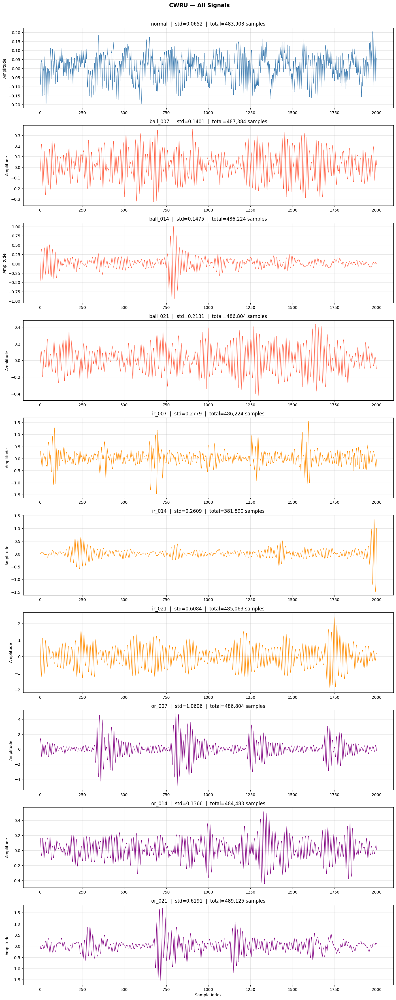

In [ ]:
# ── CELL 4a: LOAD + PLOT ALL SIGNALS ─────────────────────────────────

path     = kagglehub.dataset_download("brjapon/cwru-bearing-datasets")
raw_path = os.path.join(path, "raw")

def load_signal(filename, key):
    mat = scipy.io.loadmat(os.path.join(raw_path, filename))
    return mat[key].flatten()

all_data = {
    "normal"  : load_signal("Time_Normal_1_098.mat", "X098_DE_time"),
    "ball_007": load_signal("B007_1_123.mat",        "X123_DE_time"),
    "ball_014": load_signal("B014_1_190.mat",        "X190_DE_time"),
    "ball_021": load_signal("B021_1_227.mat",        "X227_DE_time"),
    "ir_007"  : load_signal("IR007_1_110.mat",       "X110_DE_time"),
    "ir_014"  : load_signal("IR014_1_175.mat",       "X175_DE_time"),
    "ir_021"  : load_signal("IR021_1_214.mat",       "X214_DE_time"),
    "or_007"  : load_signal("OR007_6_1_136.mat",     "X136_DE_time"),
    "or_014"  : load_signal("OR014_6_1_202.mat",     "X202_DE_time"),
    "or_021"  : load_signal("OR021_6_1_239.mat",     "X239_DE_time"),
}

# ── Print stats ───────────────────────────────────────────────────────
print("=" * 60)
print("  ALL SIGNALS — CWRU DATASET")
print("=" * 60)
print(f"  {'Signal':<12} {'Samples':>10} {'Mean':>8} {'Std':>8} {'Max':>8}")
print("-" * 60)
for name, sig in all_data.items():
    print(f"  {name:<12} {len(sig):>10,} "
          f"{sig.mean():>8.4f} "
          f"{sig.std():>8.4f} "
          f"{sig.max():>8.4f}")
print("=" * 60)

# ── Plot all ──────────────────────────────────────────────────────────
N_SAMPLES = 2000
colors = {
    "normal"  : "steelblue",
    "ball_007": "tomato",    "ball_014": "tomato",    "ball_021": "tomato",
    "ir_007"  : "darkorange","ir_014"  : "darkorange","ir_021"  : "darkorange",
    "or_007"  : "purple",    "or_014"  : "purple",    "or_021"  : "purple",
}

fig, axes = plt.subplots(10, 1, figsize=(14, 35))
for ax, (name, sig) in zip(axes, all_data.items()):
    ax.plot(sig[:N_SAMPLES], color=colors[name], linewidth=0.8)
    ax.set_title(f"{name}  |  std={sig.std():.4f}  |  total={len(sig):,} samples")
    ax.set_ylabel("Amplitude")
    ax.grid(True, alpha=0.3)
axes[-1].set_xlabel("Sample index")
plt.suptitle("CWRU — All Signals", fontsize=14, fontweight="bold", y=1.005)
plt.tight_layout()
plt.show()


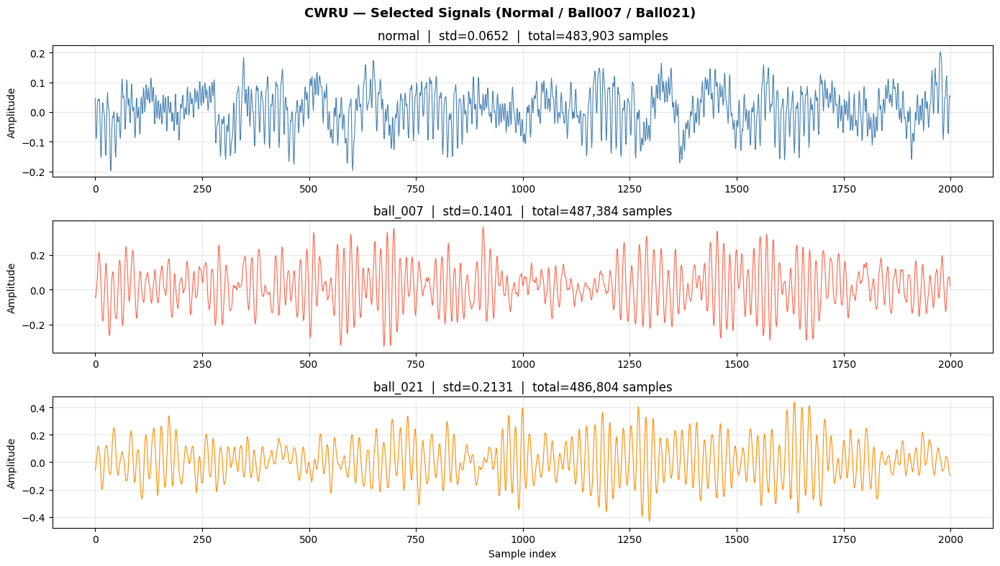

  SELECTED SIGNAL STATISTICS
  Normal   std : 0.0652
  Ball007  std : 0.1401
  Ball021  std : 0.2131
--------------------------------------------------
  Target   std : 0.1401  ← synthetic Ball007 goal


In [ ]:
# ── CELL 4b: SELECTED SIGNALS ─────────────────────────────────────────

data = {
    "normal"  : all_data["normal"],
    "ball_007": all_data["ball_007"],
    "ball_021": all_data["ball_021"],
}

normal_sig  = data["normal"]
ball007_sig = data["ball_007"]
ball021_sig = data["ball_021"]

# ── Plot 3 chosen ─────────────────────────────────────────────────────
chosen_colors = {
    "normal"  : "steelblue",
    "ball_007": "tomato",
    "ball_021": "darkorange"
}

fig, axes = plt.subplots(3, 1, figsize=(14, 8))
for ax, (name, sig) in zip(axes, data.items()):
    ax.plot(sig[:N_SAMPLES], color=chosen_colors[name], linewidth=0.8)
    ax.set_title(f"{name}  |  std={sig.std():.4f}  |  total={len(sig):,} samples")
    ax.set_ylabel("Amplitude")
    ax.grid(True, alpha=0.3)
axes[-1].set_xlabel("Sample index")
plt.suptitle("CWRU — Selected Signals (Normal / Ball007 / Ball021)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

# ── Key stats ─────────────────────────────────────────────────────────
normal_std  = normal_sig.std()
ball007_std = ball007_sig.std()
ball021_std = ball021_sig.std()
target_std  = ball007_std

print("=" * 50)
print("  SELECTED SIGNAL STATISTICS")
print("=" * 50)
print(f"  Normal   std : {normal_std:.4f}")
print(f"  Ball007  std : {ball007_std:.4f}")
print(f"  Ball021  std : {ball021_std:.4f}")
print("-" * 50)
print(f"  Target   std : {target_std:.4f}  ← synthetic Ball007 goal")
print("=" * 50)


In [ ]:
window_results    = []

# ── Simple Generator ──────────────────────────────────────────────────
class WindowGenerator(nn.Module):
    def __init__(self, window_size):
        super().__init__()
        self.init_size = window_size // 4
        self.fc        = nn.Linear(LATENT_DIM, 128 * self.init_size)
        self.net       = nn.Sequential(
            nn.BatchNorm1d(128),
            nn.ConvTranspose1d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.BatchNorm1d(64),
            nn.ConvTranspose1d(64, 1,  kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, z):
        x = self.fc(z).view(z.size(0), 128, self.init_size)
        return self.net(x)


# ── Simple Discriminator ──────────────────────────────────────────────
class WindowDiscriminator(nn.Module):
    def __init__(self, window_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(1, 64,  kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(128 * (window_size // 4), 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)


criterion = nn.BCELoss()


# 1 DIMENSION



# Finding the Best Window Size



  Window = 256
  Segments (normal) : 3779
  Segments (ball021): 3802
  Total segments    : 7581
  Batches           : 237
  Epoch 001/100 | G=4.4369 | D=0.0765 <- best
  Epoch 002/100 | G=5.0576 | D=0.0425
  Epoch 003/100 | G=2.4187 | D=0.2045 <- best
  Epoch 004/100 | G=1.9072 | D=0.2975 <- best
  Epoch 005/100 | G=1.7525 | D=0.3415 <- best
  Epoch 006/100 | G=1.8616 | D=0.3297
  Epoch 007/100 | G=1.8542 | D=0.3131
  Epoch 008/100 | G=1.9378 | D=0.3270
  Epoch 009/100 | G=1.8993 | D=0.3395
  Epoch 010/100 | G=1.9625 | D=0.3041
  Epoch 011/100 | G=1.8745 | D=0.3017
  Epoch 012/100 | G=2.0502 | D=0.2789
  Epoch 013/100 | G=2.1155 | D=0.2625
  Epoch 014/100 | G=2.1275 | D=0.2469
  Epoch 015/100 | G=2.2840 | D=0.2197
  Epoch 016/100 | G=2.2734 | D=0.2138
  Epoch 017/100 | G=2.3781 | D=0.2046
  Epoch 018/100 | G=2.3929 | D=0.1915
  Epoch 019/100 | G=2.5600 | D=0.1805
  Epoch 020/100 | G=2.5813 | D=0.1889
  Epoch 021/100 | G=2.4450 | D=0.2154
  Epoch 022/100 | G=2.3704 | D=0.2436
  Epoch 0

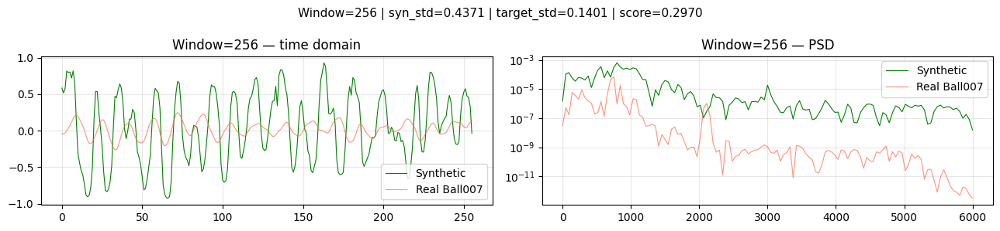


  Window=256 | syn_std=0.4371 | target=0.1401 | score=0.2970

  Window = 512
  Segments (normal) : 1889
  Segments (ball021): 1900
  Total segments    : 3789
  Batches           : 119
  Epoch 001/100 | G=4.1197 | D=0.0986 <- best
  Epoch 002/100 | G=6.5001 | D=0.0024
  Epoch 003/100 | G=6.4193 | D=0.0078
  Epoch 004/100 | G=4.4881 | D=0.0717
  Epoch 005/100 | G=3.1958 | D=0.1517 <- best
  Epoch 006/100 | G=2.6062 | D=0.2049 <- best
  Epoch 007/100 | G=2.1199 | D=0.3095 <- best
  Epoch 008/100 | G=1.8493 | D=0.3891 <- best
  Epoch 009/100 | G=1.4089 | D=0.4802 <- best
  Epoch 010/100 | G=1.7606 | D=0.4632
  Epoch 011/100 | G=1.5426 | D=0.4593
  Epoch 012/100 | G=1.6841 | D=0.4374
  Epoch 013/100 | G=1.3611 | D=0.4312 <- best
  Epoch 014/100 | G=1.6861 | D=0.3901
  Epoch 015/100 | G=1.6662 | D=0.3838
  Epoch 016/100 | G=1.6489 | D=0.3525
  Epoch 017/100 | G=1.8883 | D=0.3368
  Epoch 018/100 | G=1.8510 | D=0.3132
  Epoch 019/100 | G=1.8874 | D=0.3144
  Epoch 020/100 | G=2.1247 | D=0.2788

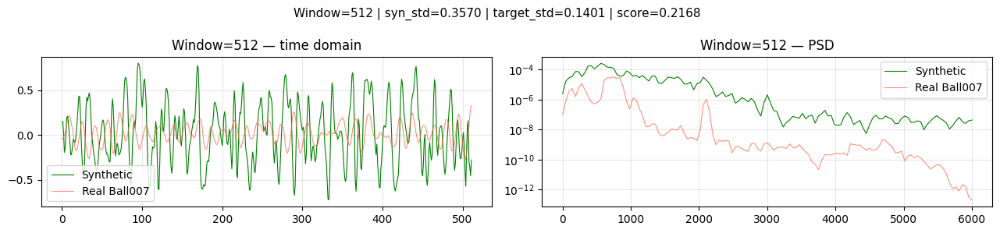


  Window=512 | syn_std=0.3570 | target=0.1401 | score=0.2168

  Window = 1024
  Segments (normal) : 944
  Segments (ball021): 949
  Total segments    : 1893
  Batches           : 60
  Epoch 001/100 | G=3.4091 | D=0.1349 <- best
  Epoch 002/100 | G=5.9415 | D=0.0038
  Epoch 003/100 | G=6.7144 | D=0.0017
  Epoch 004/100 | G=6.8750 | D=0.0017
  Epoch 005/100 | G=6.5065 | D=0.0364
  Epoch 006/100 | G=4.1173 | D=0.0807
  Epoch 007/100 | G=3.2595 | D=0.1414 <- best
  Epoch 008/100 | G=2.9195 | D=0.1222 <- best
  Epoch 009/100 | G=2.9865 | D=0.1147
  Epoch 010/100 | G=3.0091 | D=0.1377
  Epoch 011/100 | G=2.9848 | D=0.1975
  Epoch 012/100 | G=2.8905 | D=0.1223 <- best
  Epoch 013/100 | G=2.8713 | D=0.1823 <- best
  Epoch 014/100 | G=2.8549 | D=0.2260 <- best
  Epoch 015/100 | G=2.9181 | D=0.1692
  Epoch 016/100 | G=2.8174 | D=0.2228 <- best
  Epoch 017/100 | G=2.9881 | D=0.2510
  Epoch 018/100 | G=2.6778 | D=0.2052 <- best
  Epoch 019/100 | G=2.6554 | D=0.2584 <- best
  Epoch 020/100 | G=2.5

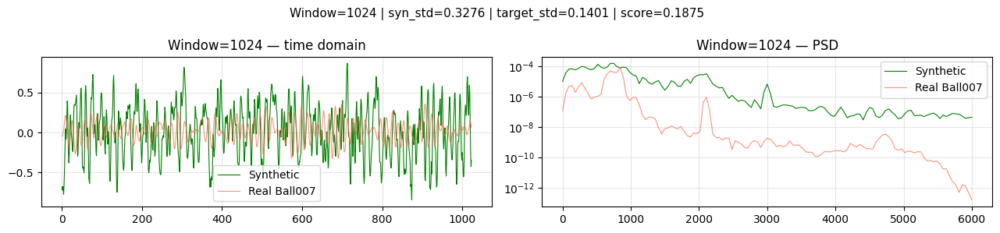


  Window=1024 | syn_std=0.3276 | target=0.1401 | score=0.1875


In [ ]:
# ── CELL 5: WINDOW SIZE EXPERIMENT ────────────────────────────────────

WINDOW_CANDIDATES = [256,512,1024]
WINDOW_EPOCHS     = 100
WINDOW_STOP       = 30
LATENT_DIM        = 100
BATCH_SIZE        = 32
LR                = 2e-4

window_results    = []


# ── Run experiment for each window ────────────────────────────────────
for window in WINDOW_CANDIDATES:

    print(f"\n{'='*55}")
    print(f"  Window = {window}")
    print(f"{'='*55}")

    set_seed(SEED)

    segs_normal = normalize_segments(segment_signal(normal_sig,  window))
    segs_ball21 = normalize_segments(segment_signal(ball021_sig, window))
    segs_train  = np.concatenate([segs_normal, segs_ball21], axis=0)
    loader      = make_dataloader(segs_train, BATCH_SIZE)

    print(f"  Segments (normal) : {len(segs_normal)}")
    print(f"  Segments (ball021): {len(segs_ball21)}")
    print(f"  Total segments    : {len(segs_train)}")
    print(f"  Batches           : {len(loader)}")

    G     = WindowGenerator(window).to(device)
    D     = WindowDiscriminator(window).to(device)
    opt_G = torch.optim.Adam(G.parameters(), lr=LR, betas=(0.5, 0.999))
    opt_D = torch.optim.Adam(D.parameters(), lr=LR, betas=(0.5, 0.999))

    best_g       = float("inf")
    best_G_state = None
    patience_ctr = 0
    g_losses     = []
    d_losses     = []

    for epoch in range(WINDOW_EPOCHS):
        g_ep = d_ep = g_steps = 0

        for (real_batch,) in loader:
            real_batch = real_batch.to(device)
            B          = real_batch.size(0)

            real_labels = torch.ones(B,  1).to(device)
            fake_labels = torch.zeros(B, 1).to(device)

            # ── Train Discriminator ───────────────────────────────────
            opt_D.zero_grad()
            noise      = torch.randn(B, LATENT_DIM).to(device)
            fake       = G(noise).detach()
            loss_real  = criterion(D(real_batch), real_labels)
            loss_fake  = criterion(D(fake),       fake_labels)
            loss_D     = (loss_real + loss_fake) / 2
            loss_D.backward()
            opt_D.step()

            # ── Train Generator ───────────────────────────────────────
            opt_G.zero_grad()
            noise  = torch.randn(B, LATENT_DIM).to(device)
            fake   = G(noise)
            loss_G = criterion(D(fake), real_labels)
            loss_G.backward()
            opt_G.step()

            g_ep    += loss_G.item()
            d_ep    += loss_D.item()
            g_steps += 1

        epoch_g = g_ep / g_steps
        epoch_d = d_ep / g_steps
        g_losses.append(epoch_g)
        d_losses.append(epoch_d)

        saved = ""
        if epoch_g < best_g:
            best_g       = epoch_g
            best_G_state = {k: v.clone() for k, v in G.state_dict().items()}
            patience_ctr = 0
            saved        = " <- best"
        else:
            patience_ctr += 1

        print_epoch(epoch+1, WINDOW_EPOCHS, epoch_g, epoch_d,
                    patience=patience_ctr, max_patience=WINDOW_STOP,
                    saved=bool(saved))

        if patience_ctr >= WINDOW_STOP:
            print(f"  Early stop at epoch {epoch+1}")
            break

    # ── Evaluate this window ──────────────────────────────────────────
    G.load_state_dict(best_G_state)
    G.eval()
    with torch.no_grad():
        noise    = torch.randn(200, LATENT_DIM).to(device)
        syn_sigs = G(noise).squeeze(1).cpu().numpy()

    syn_std = syn_sigs.std()
    score   = abs(syn_std - target_std)

    # ── Plot time domain + PSD ────────────────────────────────────────
    from scipy.signal import welch
    fig, axes = plt.subplots(1, 2, figsize=(13, 3))

    axes[0].plot(syn_sigs[0], color="green",  linewidth=0.8)
    axes[0].plot(data["ball_007"][:window], color="tomato",
                 linewidth=0.8, alpha=0.7)
    axes[0].set_title(f"Window={window} — time domain")
    axes[0].legend(["Synthetic", "Real Ball007"])
    axes[0].grid(True, alpha=0.3)

    f_syn,  p_syn  = welch(syn_sigs[0],            fs=12000, nperseg=256)
    f_real, p_real = welch(data["ball_007"][:window], fs=12000, nperseg=256)
    axes[1].semilogy(f_syn,  p_syn,  color="green",  linewidth=0.8)
    axes[1].semilogy(f_real, p_real, color="tomato", linewidth=0.8, alpha=0.7)
    axes[1].set_title(f"Window={window} — PSD")
    axes[1].legend(["Synthetic", "Real Ball007"])
    axes[1].grid(True, alpha=0.3)

    plt.suptitle(f"Window={window} | syn_std={syn_std:.4f} "
                 f"| target_std={target_std:.4f} | score={score:.4f}",
                 fontsize=11)
    plt.tight_layout()
    plt.show()

    window_results.append({
        "window" : window,
        "syn_std": round(syn_std,   4),
        "target" : round(target_std, 4),
        "score"  : round(score,     4),
        "epochs" : len(g_losses),
    })

    print(f"\n  Window={window} | syn_std={syn_std:.4f} "
          f"| target={target_std:.4f} | score={score:.4f}")


In [ ]:
# ── Summary table ─────────────────────────────────────────────────────
print(f"\n{'='*55}")
print(f"  WINDOW SIZE EXPERIMENT — RESULTS")
print(f"{'='*55}")
print(f"  {'Window':>8} {'Syn Std':>10} {'Target':>10} "
      f"{'Score':>10} {'Epochs':>8}")
print(f"  {'-'*50}")
for r in sorted(window_results, key=lambda x: x["score"]):
    print(f"  {r['window']:>8} {r['syn_std']:>10} "
          f"{r['target']:>10} {r['score']:>10} {r['epochs']:>8}")
print(f"{'='*55}")

# ── Pick best window ──────────────────────────────────────────────────
WINDOW_SIZE = sorted(window_results, key=lambda x: x["score"])[0]["window"]
print(f"\n  Best window size → {WINDOW_SIZE}")
print(f"  WINDOW_SIZE is now set to {WINDOW_SIZE}")
print(f"  All subsequent cells will use WINDOW_SIZE = {WINDOW_SIZE}")



  WINDOW SIZE EXPERIMENT — RESULTS
    Window    Syn Std     Target      Score   Epochs
  --------------------------------------------------
      1024 0.32760000228881836     0.1401     0.1875       70
       512 0.3569999933242798     0.1401     0.2168       43
       256 0.43709999322891235     0.1401      0.297       35

  Best window size → 1024
  WINDOW_SIZE is now set to 1024
  All subsequent cells will use WINDOW_SIZE = 1024


# GLOBAL HELPERS for E1, E2


In [ ]:
# ── Config ────────────────────────────────────────────────────────────
WINDOW_SIZE  = 1024
LATENT_DIM   = 100
BATCH_SIZE   = 32
LR_G         = 2e-4
LR_D         = 2e-4
MAX_EPOCHS   = 300
EARLY_STOP   = 50
EVAL_EVERY   = 5
N_EVAL_NOISE = 200


In [ ]:
def train_gan_cgan(model_name, generator_class, discriminator_class, ckpt_file,
                   conditioned=False, window_size=1024, latent_dim=100,
                   batch_size=32, lr_g=2e-4, lr_d=2e-4,
                   max_epochs=300, early_stop=50, eval_every=5,
                   n_eval_noise=200, severity_normal=0.00,
                   severity_ball021=0.21, severity_target=0.07):

    set_seed(SEED)

    # ── Data ──────────────────────────────────────────────────────────
    segs_normal = normalize_segments(segment_signal(normal_sig, window_size))
    segs_ball21 = normalize_segments(segment_signal(ball021_sig, window_size))

    if conditioned:
        x_normal = torch.FloatTensor(segs_normal).unsqueeze(1)
        x_ball21 = torch.FloatTensor(segs_ball21).unsqueeze(1)
        a_normal = torch.full((len(segs_normal), 1), severity_normal)
        a_ball21 = torch.full((len(segs_ball21), 1), severity_ball021)
        x_all = torch.cat([x_normal, x_ball21], dim=0)
        a_all = torch.cat([a_normal, a_ball21], dim=0)
        dataset = TensorDataset(x_all, a_all)
        total_segments = len(x_all)
    else:
        segs_train = np.concatenate([segs_normal, segs_ball21], axis=0)
        x_all = torch.FloatTensor(segs_train).unsqueeze(1)
        dataset = TensorDataset(x_all)
        total_segments = len(segs_train)

    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True,
                        generator=torch.Generator().manual_seed(SEED))

    print("=" * 55)
    print(f"  {model_name} TRAINING — DATA SUMMARY")
    print("=" * 55)
    print(f"  Window size       : {window_size}")
    print(f"  Segments (normal) : {len(segs_normal)}")
    print(f"  Segments (ball021): {len(segs_ball21)}")
    print(f"  Total segments    : {total_segments}")
    print(f"  Batches per epoch : {len(loader)}")
    print(f"  Batch size        : {batch_size}")
    print(f"  Max epochs        : {max_epochs}")
    print(f"  Early stop        : {early_stop} patience")
    print(f"  Eval every        : {eval_every} epochs")
    print(f"  Target std        : {target_std:.4f}")
    if conditioned:
        print(f"  Target alpha      : {severity_target}")
    print("=" * 55)

    # ── Model + optimizer ─────────────────────────────────────────────
    G = generator_class(window_size).to(device)
    D = discriminator_class(window_size).to(device)

    opt_G = torch.optim.Adam(G.parameters(), lr=lr_g, betas=(0.5, 0.999))
    opt_D = torch.optim.Adam(D.parameters(), lr=lr_d, betas=(0.5, 0.999))
    criterion = nn.BCELoss()

    # ── Training state ────────────────────────────────────────────────
    best_score = float("inf")
    best_G_state = None
    best_D_state = None
    patience_ctr = 0

    g_losses, d_losses, score_log = [], [], []

    print(f"\n  Starting {model_name} training...")
    print(f"  {'─' * 55}")

    # ── Training loop ─────────────────────────────────────────────────
    for epoch in range(max_epochs):
        G.train()
        D.train()

        g_ep = d_ep = g_steps = 0

        for batch in loader:
            if conditioned:
                real_batch, alpha_batch = batch
                alpha_batch = alpha_batch.to(device)
            else:
                real_batch = batch[0]
                alpha_batch = None

            real_batch = real_batch.to(device)
            B = real_batch.size(0)

            real_labels = torch.ones(B, 1).to(device)
            fake_labels = torch.zeros(B, 1).to(device)

            # ── Train Discriminator ───────────────────────────────────
            opt_D.zero_grad()

            noise = torch.randn(B, latent_dim).to(device)

            if conditioned:
                fake = G(noise, alpha_batch).detach()
                loss_real = criterion(D(real_batch, alpha_batch), real_labels)
                loss_fake = criterion(D(fake, alpha_batch), fake_labels)
            else:
                fake = G(noise).detach()
                loss_real = criterion(D(real_batch), real_labels)
                loss_fake = criterion(D(fake), fake_labels)

            loss_D = (loss_real + loss_fake) / 2
            loss_D.backward()
            opt_D.step()

            # ── Train Generator ───────────────────────────────────────
            opt_G.zero_grad()

            noise = torch.randn(B, latent_dim).to(device)

            if conditioned:
                fake = G(noise, alpha_batch)
                loss_G = criterion(D(fake, alpha_batch), real_labels)
            else:
                fake = G(noise)
                loss_G = criterion(D(fake), real_labels)

            loss_G.backward()
            opt_G.step()

            g_ep += loss_G.item()
            d_ep += loss_D.item()
            g_steps += 1

        epoch_g = g_ep / g_steps
        epoch_d = d_ep / g_steps

        g_losses.append(epoch_g)
        d_losses.append(epoch_d)

        saved = ""

        # ── Evaluate every eval_every epochs ──────────────────────────
        if (epoch + 1) % eval_every == 0:
            G.eval()

            with torch.no_grad():
                noise_eval = torch.randn(n_eval_noise, latent_dim).to(device)

                if conditioned:
                    alpha_eval = torch.full((n_eval_noise, 1),
                                            severity_target).to(device)
                    syn_eval = G(noise_eval, alpha_eval).squeeze(1).cpu().numpy()
                else:
                    syn_eval = G(noise_eval).squeeze(1).cpu().numpy()

            syn_std = syn_eval.std()
            score = abs(syn_std - target_std)
            score_log.append((epoch + 1, syn_std, score))

            if score < best_score:
                best_score = score
                best_G_state = {k: v.clone() for k, v in G.state_dict().items()}
                best_D_state = {k: v.clone() for k, v in D.state_dict().items()}
                patience_ctr = 0
                saved = " <- best"
            else:
                patience_ctr += 1

            print(f"  Epoch {epoch+1:03d}/{max_epochs}"
                  f" | G={epoch_g:.4f} | D={epoch_d:.4f}"
                  f" | syn_std={syn_std:.4f}"
                  f" | score={score:.4f}"
                  f" | patience={patience_ctr}/{early_stop}"
                  f"{saved}")
        else:
            print(f"  Epoch {epoch+1:03d}/{max_epochs}"
                  f" | G={epoch_g:.4f} | D={epoch_d:.4f}")

        if patience_ctr >= early_stop:
            print(f"\n  Early stop triggered at epoch {epoch+1}")
            break

    # ── Load best state ───────────────────────────────────────────────
    G.load_state_dict(best_G_state)
    G.eval()

    with torch.no_grad():
        noise_final = torch.randn(n_eval_noise, latent_dim).to(device)

        if conditioned:
            alpha_final = torch.full((n_eval_noise, 1),
                                     severity_target).to(device)
            syn_final = G(noise_final, alpha_final).squeeze(1).cpu().numpy()
        else:
            syn_final = G(noise_final).squeeze(1).cpu().numpy()

    syn_std_final = syn_final.std()
    score_final = abs(syn_std_final - target_std)

    print(f"\n{'=' * 55}")
    print(f"  {model_name} TRAINING COMPLETE")
    print(f"{'=' * 55}")
    print(f"  Epochs run    : {len(g_losses)}/{max_epochs}")
    print(f"  Best score    : {best_score:.4f}")
    print(f"  Normal std    : {normal_std:.4f}")
    print(f"  Synthetic std : {syn_std_final:.4f}")
    print(f"  Target std    : {target_std:.4f}")
    print(f"  Ball021 std   : {ball021_std:.4f}")
    print(f"  Final score   : {score_final:.4f}")
    print(f"{'=' * 55}")

    # ── Save checkpoint ───────────────────────────────────────────────
    payload = {
        "model": model_name, "window": window_size, "latent_dim": latent_dim,
        "epochs_run": len(g_losses), "best_score": best_score,
        "syn_std": syn_std_final, "target_std": target_std,
        "normal_std": normal_std, "ball007_std": ball007_std,
        "ball021_std": ball021_std, "g_losses": g_losses,
        "d_losses": d_losses, "score_log": score_log,
        "G_state": best_G_state, "D_state": best_D_state, "seed": SEED,
    }

    if conditioned:
        payload["severity_target"] = severity_target

    save_checkpoint(payload, ckpt_file)

    history = {
        "g_losses": g_losses, "d_losses": d_losses, "score_log": score_log,
        "best_score": best_score, "syn_std": syn_std_final,
    }

    return G, D, history


In [ ]:
def plot_training_summary(g_losses, d_losses, score_log, target_std, best_score,
                          model_name="GAN", ideal_loss=0.693):
    # ── Loss + score curves ───────────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))

    axes[0].plot(g_losses, label="G loss", color="green")
    axes[0].plot(d_losses, label="D loss", color="tomato")
    axes[0].axhline(y=ideal_loss, color="gray", linestyle="--", alpha=0.5,
                    label=f"ideal={ideal_loss:.3f}")
    axes[0].set_title(f"{model_name} — Training Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    eval_epochs = [s[0] for s in score_log]
    eval_scores = [s[2] for s in score_log]
    eval_synstds = [s[1] for s in score_log]

    axes[1].plot(eval_epochs, eval_scores, color="purple", marker="o",
                 markersize=3, label="score")
    axes[1].plot(eval_epochs, eval_synstds, color="green", marker="o",
                 markersize=3, label="syn_std", alpha=0.6)
    axes[1].axhline(y=target_std, color="tomato", linestyle="--", alpha=0.7,
                    label=f"target={target_std:.4f}")
    axes[1].axhline(y=best_score, color="gray", linestyle="--", alpha=0.5,
                    label=f"best={best_score:.4f}")
    axes[1].set_title(f"{model_name} — Std Score (lower = better)")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Score / Std")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.suptitle(f"{model_name} — Training Summary", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


In [ ]:
# ── GLOBAL GAN/CGAN SYNTHESIS + EVALUATION ───────────────────────

def synthesize_evaluate(model_name, generator_class, ckpt_file,
                                 conditioned=False, n_synthetic=500,
                                 severity_target=0.07, results_key=None):
    results_key = results_key or model_name

    # ── Load model ────────────────────────────────────────────────────
    ckpt = load_checkpoint(ckpt_file)
    window_size = ckpt["window"]
    G_eval = generator_class(window_size).to(device)
    G_eval.load_state_dict(ckpt["G_state"])
    G_eval.eval()

    print("=" * 55)
    print(f"  {model_name} — MODEL LOADED")
    print("=" * 55)
    print(f"  Window      : {ckpt['window']}")
    print(f"  Epochs run  : {ckpt['epochs_run']}")
    print(f"  Best score  : {ckpt['best_score']:.4f}")
    print(f"  Target std  : {ckpt['target_std']:.4f}")
    print(f"  Syn std     : {ckpt['syn_std']:.4f}")
    if conditioned:
        print(f"  Severity α  : {ckpt.get('severity_target', severity_target)}")
    if "lambda_gp" in ckpt:
        print(f"  Lambda GP    : {ckpt['lambda_gp']}")
    if "lambda_std" in ckpt:
        print(f"  Lambda STD   : {ckpt['lambda_std']}")
    print("=" * 55)

    # ── Generate synthetic Ball007 ────────────────────────────────────
    set_seed(SEED)
    with torch.no_grad():
        noise_syn = torch.randn(n_synthetic, LATENT_DIM).to(device)
        if conditioned:
            alpha_syn = torch.full((n_synthetic, 1), severity_target).to(device)
            syn_sigs = G_eval(noise_syn, alpha_syn).squeeze(1).cpu().numpy()
        else:
            syn_sigs = G_eval(noise_syn).squeeze(1).cpu().numpy()

    syn_std = syn_sigs.std()
    syn_mean = syn_sigs.mean()

    if conditioned:
        print(f"\n  Generated {n_synthetic} synthetic signals at α={severity_target}")
    else:
        print(f"\n  Generated {n_synthetic} synthetic signals")
    print(f"  Synthetic std  : {syn_std:.4f}")
    print(f"  Synthetic mean : {syn_mean:.4f}")
    print(f"  Target std     : {target_std:.4f}")
    print(f"  Real Ball007   : {ball007_std:.4f}")

    # ── Visual checks ─────────────────────────────────────────────────
    plot_synthetic_vs_real(syn_sigs, data, window_size, model_name)
    plot_psd(syn_sigs, data, window_size, model_name)
    plot_tsne(syn_sigs, data, window_size, model_name)

    # ── MMD score ─────────────────────────────────────────────────────
    real_b007 = normalize_segments(segment_signal(ball007_sig, window_size))[:200]
    mmd_score = compute_mmd(syn_sigs[:200], real_b007)

    print(f"\n{'=' * 55}")
    print(f"  {model_name} — EVALUATION SUMMARY")
    print(f"{'=' * 55}")
    print(f"  Synthetic std    : {syn_std:.4f}")
    print(f"  Real Ball007 std : {ball007_std:.4f}")
    print(f"  Std score        : {abs(syn_std - ball007_std):.4f}")
    print(f"  MMD score        : {mmd_score:.4f}  ← lower = more similar")
    print(f"{'=' * 55}")

    RESULTS_TABLE[results_key] = {
        "syn_std": round(syn_std, 4), "target_std": round(target_std, 4),
        "std_score": round(abs(syn_std - ball007_std), 4),
        "mmd": round(mmd_score, 4),
    }

    print(f"\n  Results saved to RESULTS_TABLE['{results_key}']")

    metrics = {"syn_std": syn_std, "syn_mean": syn_mean, "mmd_score": mmd_score,
               "real_b007": real_b007, "ckpt": ckpt}
    return G_eval, syn_sigs, metrics

def plot_severity_sweep(G_eval, model_name, window_size, severity_target=0.07,
                        alphas=None, n_fixed_noise=1):
    print("\n  Running severity sweep...")
    alphas = alphas or [0.00, 0.03, 0.07, 0.10, 0.14, 0.17, 0.21]
    sweep_stds = []
    sweep_sigs = []

    set_seed(SEED)
    fixed_noise = torch.randn(n_fixed_noise, LATENT_DIM).to(device)

    with torch.no_grad():
        for a in alphas:
            alpha_t = torch.full((n_fixed_noise, 1), a).to(device)
            sig = G_eval(fixed_noise, alpha_t).squeeze().cpu().numpy()
            sweep_sigs.append(sig)
            sweep_stds.append(sig.std())

    # ── Multiple alpha signal plots ───────────────────────────────────
    fig, axes = plt.subplots(len(alphas) + 2, 1,
                             figsize=(13, (len(alphas) + 2) * 2.2))

    axes[0].plot(data["normal"][:window_size], color="steelblue", linewidth=0.8)
    axes[0].set_title(f"Real Normal (std={normal_std:.4f})")
    axes[0].set_ylabel("Amplitude")
    axes[0].grid(True, alpha=0.3)

    colors_sweep = plt.cm.RdYlGn_r([i / len(alphas) for i in range(len(alphas))])
    for i, (a, sig, color) in enumerate(zip(alphas, sweep_sigs, colors_sweep)):
        axes[i + 1].plot(sig, color=color, linewidth=0.8)
        axes[i + 1].set_title(
            f"Synthetic α={a:.2f}  (std={sig.std():.4f})"
            + (" ← target" if a == severity_target else "")
            + (" ← trained" if a in [0.00, 0.21] else "")
        )
        axes[i + 1].set_ylabel("Amplitude")
        axes[i + 1].grid(True, alpha=0.3)

    axes[-1].plot(data["ball_021"][:window_size], color="darkorange", linewidth=0.8)
    axes[-1].set_title(f"Real Ball021 (std={ball021_std:.4f})")
    axes[-1].set_ylabel("Amplitude")
    axes[-1].set_xlabel("Sample index")
    axes[-1].grid(True, alpha=0.3)

    plt.suptitle(f"{model_name} — Severity Sweep (α: 0.00 → 0.21)",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()

    # ── Std vs alpha curve ────────────────────────────────────────────
    real_stds = {0.00: normal_std, 0.07: ball007_std, 0.21: ball021_std}

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.plot(alphas, sweep_stds, color="green", marker="o",
            linewidth=1.5, markersize=6, label="Synthetic std")
    ax.scatter(list(real_stds.keys()), list(real_stds.values()),
               color="tomato", s=80, zorder=5, label="Real signal std")

    for a, s in real_stds.items():
        ax.annotate(f"Real α={a:.2f}\nstd={s:.4f}",
                    xy=(a, s), xytext=(a + 0.01, s + 0.01),
                    fontsize=8, color="tomato")

    ax.axvline(x=severity_target, color="gray", linestyle="--",
               alpha=0.5, label=f"Target α={severity_target:.2f}")
    ax.set_title(f"{model_name} — Synthetic Std vs Severity α")
    ax.set_xlabel("Severity α")
    ax.set_ylabel("Signal Std")
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"\n  Severity Sweep Results:")
    print(f"  {'Alpha':>8} {'Syn Std':>10} {'Real Std':>10}")
    print(f"  {'─' * 30}")
    for a, s in zip(alphas, sweep_stds):
        real = real_stds.get(a, "─")
        real_str = f"{real:.4f}" if isinstance(real, float) else real
        tag = " ← target" if a == severity_target else ""
        tag = " ← trained" if a in [0.00, 0.21] else tag
        print(f"  {a:>8.2f} {s:>10.4f} {real_str:>10}{tag}")

    return {"alphas": alphas, "sweep_stds": sweep_stds, "sweep_sigs": sweep_sigs,
            "real_stds": real_stds}


# E1: GAN Training

**Checkpoint:** `best_gan.pth`

This experiment trains the basic GAN generator and discriminator. It does not use severity conditioning, so the generator learns only from the training signal distribution and later produces synthetic Ball007 samples from random noise.


In [ ]:
# ── Architecture ──────────────────────────────────────────────────────
class GAN_Generator(nn.Module):
    def __init__(self, window_size):
        super().__init__()
        self.init_size = window_size // 4
        self.fc        = nn.Linear(LATENT_DIM, 128 * self.init_size)
        self.net       = nn.Sequential(
            nn.BatchNorm1d(128),
            nn.ConvTranspose1d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.BatchNorm1d(64),
            nn.ConvTranspose1d(64,  1,  kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, z):
        x = self.fc(z).view(z.size(0), 128, self.init_size)
        return self.net(x)


class GAN_Discriminator(nn.Module):
    def __init__(self, window_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(1,   64,  kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64,  128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(128 * (window_size // 4), 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)


In [ ]:
# ── E1: GAN TRAINING ──────────────────────────────────────────────────

# ── Config ────────────────────────────────────────────────────────────
WINDOW_SIZE  = 1024
LATENT_DIM   = 100
BATCH_SIZE   = 32
LR_G         = 2e-4
LR_D         = 2e-4
MAX_EPOCHS   = 300
EARLY_STOP   = 50
EVAL_EVERY   = 5
N_EVAL_NOISE = 200

# ── Train GAN using global GAN/CGAN loop ──────────────────────────────
G, D, gan_history = train_gan_cgan(
    model_name="GAN", generator_class=GAN_Generator, discriminator_class=GAN_Discriminator,
    ckpt_file="best_gan.pth", conditioned=False, window_size=WINDOW_SIZE,
    latent_dim=LATENT_DIM, batch_size=BATCH_SIZE, lr_g=LR_G, lr_d=LR_D,
    max_epochs=MAX_EPOCHS, early_stop=EARLY_STOP, eval_every=EVAL_EVERY,
    n_eval_noise=N_EVAL_NOISE
)

# Keep the old variable names so the existing loss/score plot cell still works.
g_losses, d_losses, score_log = gan_history["g_losses"], gan_history["d_losses"], gan_history["score_log"]
best_score, syn_std_final = gan_history["best_score"], gan_history["syn_std"]


  GAN TRAINING — DATA SUMMARY
  Window size       : 1024
  Segments (normal) : 944
  Segments (ball021): 949
  Total segments    : 1893
  Batches per epoch : 60
  Batch size        : 32
  Max epochs        : 300
  Early stop        : 50 patience
  Eval every        : 5 epochs
  Target std        : 0.1401

  Starting GAN training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=3.4091 | D=0.1349
  Epoch 002/300 | G=5.9415 | D=0.0038
  Epoch 003/300 | G=6.7144 | D=0.0017
  Epoch 004/300 | G=6.8750 | D=0.0017
  Epoch 005/300 | G=6.5065 | D=0.0364 | syn_std=0.4749 | score=0.3348 | patience=0/50 <- best
  Epoch 006/300 | G=4.0564 | D=0.0872
  Epoch 007/300 | G=3.2704 | D=0.1332
  Epoch 008/300 | G=2.9289 | D=0.1201
  Epoch 009/300 | G=3.1238 | D=0.1214
  Epoch 010/300 | G=2.9154 | D=0.1615 | syn_std=0.3737 | score=0.2336 | patience=0/50 <- best
  Epoch 011/300 | G=2.9502 | D=0.1583
  Epoch 012/300 | G=2.9231 | D=0.1030
  Epoch 013/300 | G=3.0772 | D=0.1533
  

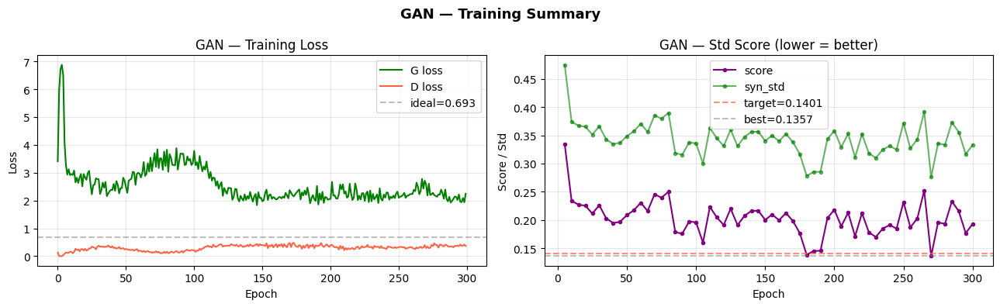

In [ ]:
# ── E1: GAN loss + score curves ───────────────────────────────────────
plot_training_summary(g_losses, d_losses, score_log, target_std, best_score,
                      model_name="GAN")


  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_gan.pth
  GAN — MODEL LOADED
  Window      : 1024
  Epochs run  : 300
  Best score  : 0.1357
  Target std  : 0.1401
  Syn std     : 0.2779

  Generated 500 synthetic signals
  Synthetic std  : 0.2781
  Synthetic mean : -0.0054
  Target std     : 0.1401
  Real Ball007   : 0.1401


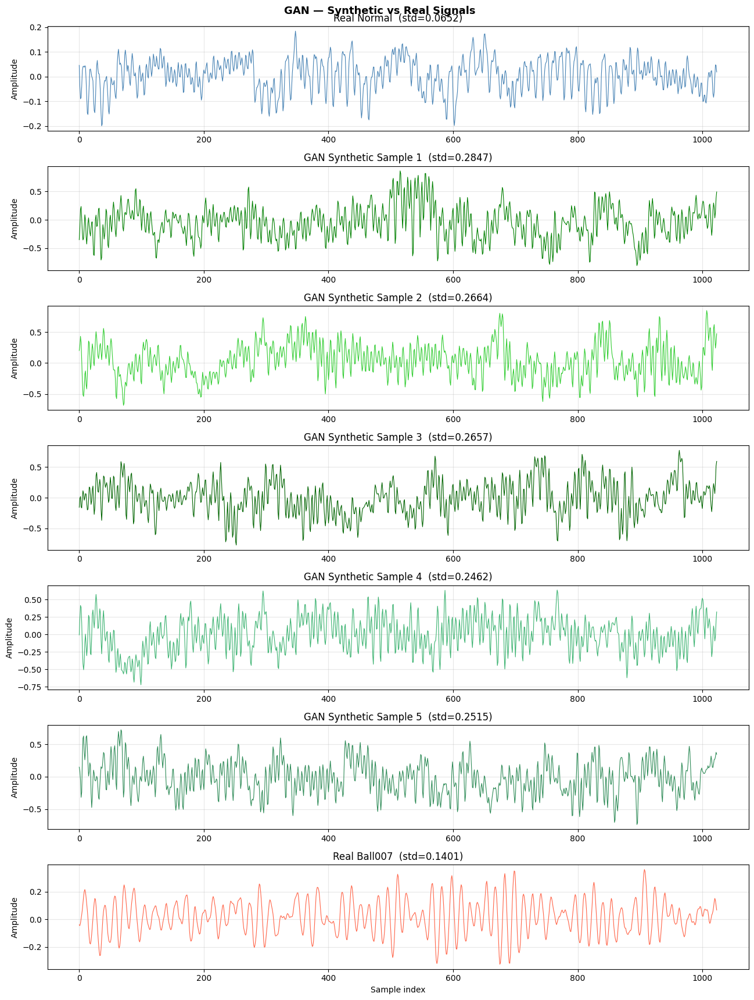

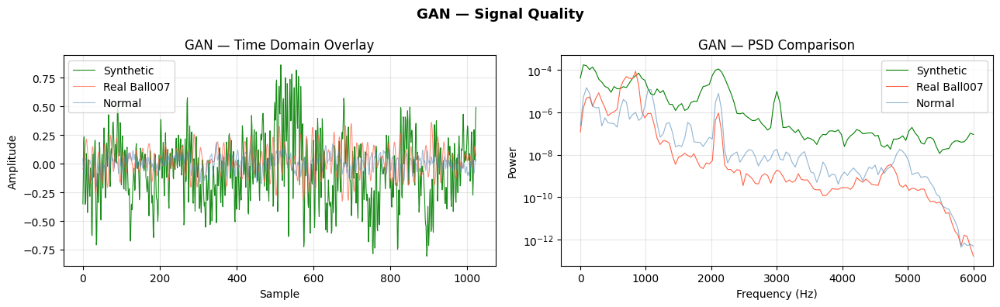


  Running t-SNE...


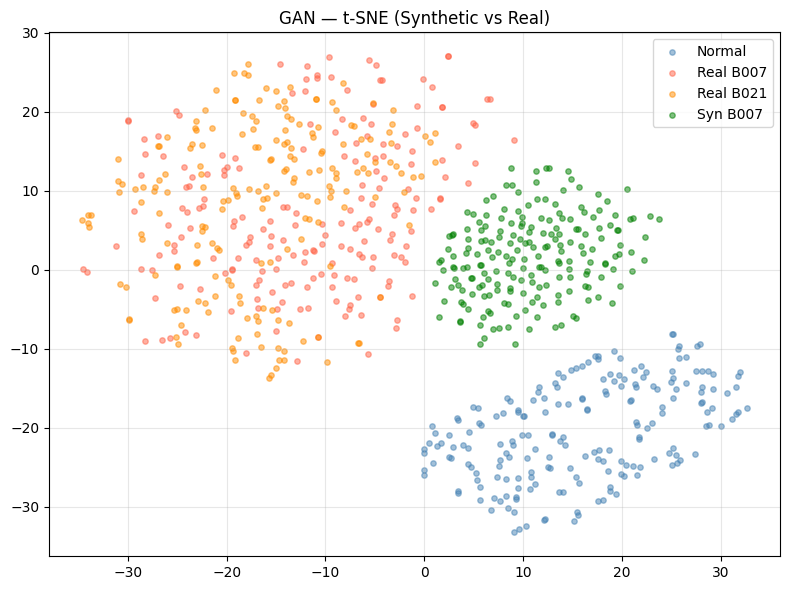


  GAN — EVALUATION SUMMARY
  Synthetic std    : 0.2781
  Real Ball007 std : 0.1401
  Std score        : 0.1379
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['GAN']


In [ ]:
# ── E1: GAN synthesis + evaluation ────────────────────────────────────
MODEL_NAME  = "GAN"
CKPT_FILE   = "best_gan.pth"
N_SYNTHETIC = 500

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=GAN_Generator, ckpt_file=CKPT_FILE,
    conditioned=False, n_synthetic=N_SYNTHETIC, results_key="GAN"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]


# E2: CGAN Training

**Checkpoint:** `best_cgan.pth`

This experiment trains a conditional GAN using the severity value `alpha`. Normal data is labelled with `alpha=0.00`, Ball021 with `alpha=0.21`, and the generator is later asked to synthesize Ball007 using `alpha=0.07`.


In [ ]:
# ── Architecture ──────────────────────────────────────────────────────
class CGAN_Generator(nn.Module):
    """
    Input  : noise (LATENT_DIM,) + alpha (1,) → concat → (LATENT_DIM+1,)
    Output : signal (1, window_size)
    """
    def __init__(self, window_size):
        super().__init__()
        self.init_size = window_size // 4
        self.fc        = nn.Linear(LATENT_DIM + 1, 128 * self.init_size)
        self.net       = nn.Sequential(
            nn.BatchNorm1d(128),
            nn.ConvTranspose1d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.BatchNorm1d(64),
            nn.ConvTranspose1d(64,  1,  kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, z, alpha):
        x = torch.cat([z, alpha], dim=1)          # (B, LATENT_DIM+1)
        x = self.fc(x).view(z.size(0), 128, self.init_size)
        return self.net(x)


class CGAN_Discriminator(nn.Module):
    """
    Input  : signal (1, window_size) + alpha broadcast → (2, window_size)
    Output : real/fake score (1,)
    """
    def __init__(self, window_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(2,   64,  kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64,  128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(128 * (window_size // 4), 1),
            nn.Sigmoid()
        )
    def forward(self, x, alpha):
        # broadcast alpha → same length as signal
        alpha_channel = alpha.unsqueeze(2).expand(-1, -1, x.size(2))
        x = torch.cat([x, alpha_channel], dim=1)  # (B, 2, window_size)
        return self.net(x)


In [ ]:
# ── E2: CGAN TRAINING ─────────────────────────────────────────────────

# ── Config ────────────────────────────────────────────────────────────
WINDOW_SIZE  = 1024
LATENT_DIM   = 100
BATCH_SIZE   = 32
LR_G         = 2e-4
LR_D         = 2e-4
MAX_EPOCHS   = 300
EARLY_STOP   = 50
EVAL_EVERY   = 5
N_EVAL_NOISE = 200

SEVERITY_NORMAL  = 0.00
SEVERITY_BALL021 = 0.21
SEVERITY_TARGET  = 0.07

# ── Train CGAN using global GAN/CGAN loop ─────────────────────────────
G, D, cgan_history = train_gan_cgan(
    model_name="CGAN", generator_class=CGAN_Generator, discriminator_class=CGAN_Discriminator,
    ckpt_file="best_cgan.pth", conditioned=True, window_size=WINDOW_SIZE,
    latent_dim=LATENT_DIM, batch_size=BATCH_SIZE, lr_g=LR_G, lr_d=LR_D,
    max_epochs=MAX_EPOCHS, early_stop=EARLY_STOP, eval_every=EVAL_EVERY,
    n_eval_noise=N_EVAL_NOISE, severity_normal=SEVERITY_NORMAL,
    severity_ball021=SEVERITY_BALL021, severity_target=SEVERITY_TARGET
)

# Keep the old variable names so the summary plot and later cells still work.
g_losses, d_losses, score_log = cgan_history["g_losses"], cgan_history["d_losses"], cgan_history["score_log"]
best_score, syn_std_final = cgan_history["best_score"], cgan_history["syn_std"]


  CGAN TRAINING — DATA SUMMARY
  Window size       : 1024
  Segments (normal) : 944
  Segments (ball021): 949
  Total segments    : 1893
  Batches per epoch : 60
  Batch size        : 32
  Max epochs        : 300
  Early stop        : 50 patience
  Eval every        : 5 epochs
  Target std        : 0.1401
  Target alpha      : 0.07

  Starting CGAN training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=3.3565 | D=0.1377
  Epoch 002/300 | G=5.7924 | D=0.0043
  Epoch 003/300 | G=6.6163 | D=0.0021
  Epoch 004/300 | G=6.6490 | D=0.0027
  Epoch 005/300 | G=6.0245 | D=0.0303 | syn_std=0.3822 | score=0.2421 | patience=0/50 <- best
  Epoch 006/300 | G=4.4160 | D=0.0712
  Epoch 007/300 | G=3.5679 | D=0.1170
  Epoch 008/300 | G=3.1861 | D=0.1294
  Epoch 009/300 | G=3.3093 | D=0.1613
  Epoch 010/300 | G=3.1540 | D=0.1300 | syn_std=0.3677 | score=0.2276 | patience=0/50 <- best
  Epoch 011/300 | G=3.0462 | D=0.1622
  Epoch 012/300 | G=3.1232 | D=0.1733
  Epoch 013

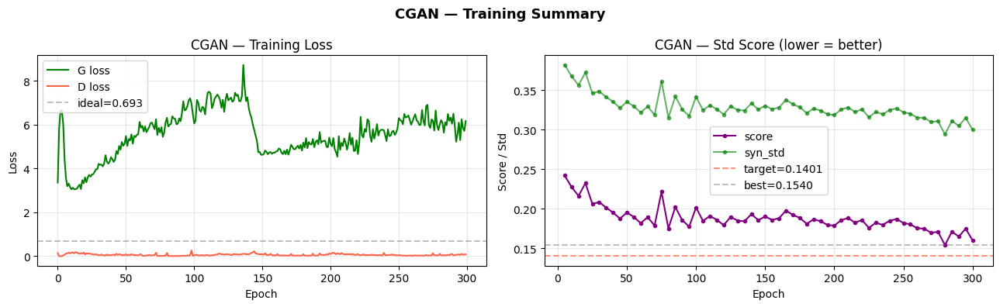

In [ ]:
# ── E2: CGAN loss + score curves ──────────────────────────────────────
plot_training_summary(g_losses, d_losses, score_log, target_std, best_score,
                      model_name="CGAN")


  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_cgan.pth
  CGAN — MODEL LOADED
  Window      : 1024
  Epochs run  : 300
  Best score  : 0.1540
  Target std  : 0.1401
  Syn std     : 0.2971
  Severity α  : 0.07

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.2984
  Synthetic mean : -0.0437
  Target std     : 0.1401
  Real Ball007   : 0.1401


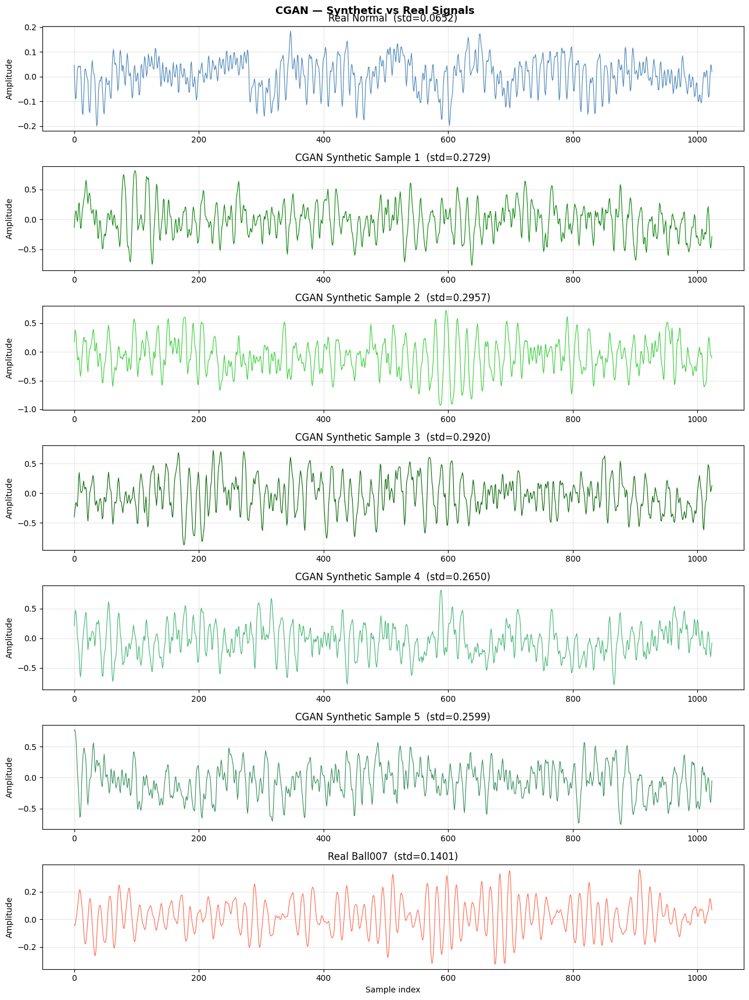

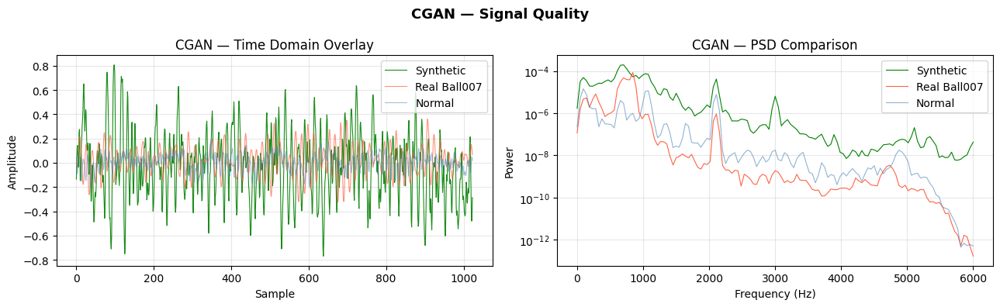


  Running t-SNE...


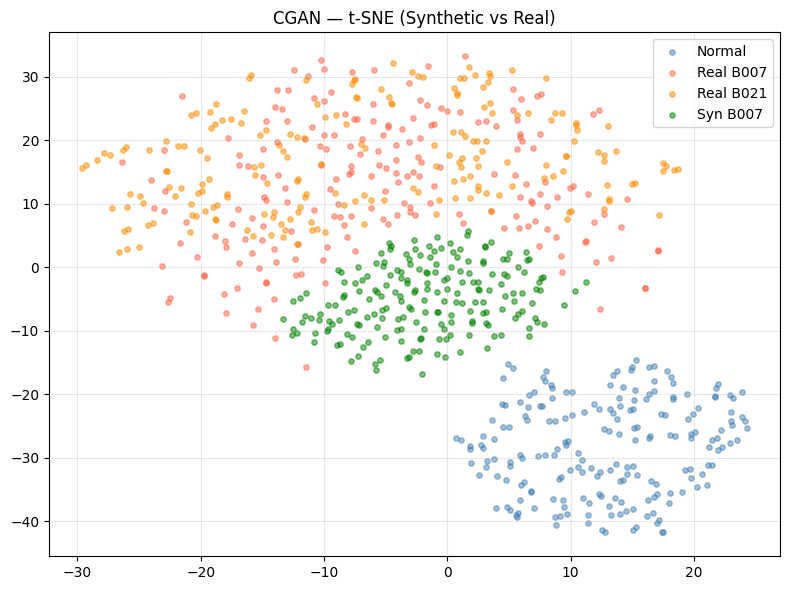


  CGAN — EVALUATION SUMMARY
  Synthetic std    : 0.2984
  Real Ball007 std : 0.1401
  Std score        : 0.1583
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['CGAN']


In [ ]:
# ── E2: CGAN synthesis + evaluation ───────────────────────────────────
MODEL_NAME      = "CGAN"
CKPT_FILE       = "best_cgan.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=CGAN_Generator, ckpt_file=CKPT_FILE,
    conditioned=True, n_synthetic=N_SYNTHETIC, severity_target=SEVERITY_TARGET,
    results_key="CGAN"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]


# GLOBAL HELPERS FOR E3-E7


In [ ]:
# ── Architecture ──────────────────────────────────────────────────────
class WGANGP_Generator(nn.Module):
    """
    Input  : noise (LATENT_DIM,) + alpha (1,) → concat → (LATENT_DIM+1,)
    Output : signal (1, window_size)
    """
    def __init__(self, window_size):
        super().__init__()
        self.init_size = window_size // 4
        self.fc        = nn.Linear(LATENT_DIM + 1, 128 * self.init_size)
        self.net       = nn.Sequential(
            nn.BatchNorm1d(128),
            nn.ConvTranspose1d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.BatchNorm1d(64),
            nn.ConvTranspose1d(64,  1,  kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, z, alpha):
        x = torch.cat([z, alpha], dim=1)
        x = self.fc(x).view(z.size(0), 128, self.init_size)
        return self.net(x)


class WGANGP_Critic(nn.Module):
    """
    Input  : signal (1, window_size) + alpha broadcast → (2, window_size)
    Output : score — NO sigmoid! (WGAN-GP uses raw scores)
    """
    def __init__(self, window_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(2,   64,  kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64,  128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(128 * (window_size // 4), 1)
            # ← NO Sigmoid! critic outputs raw score
        )
    def forward(self, x, alpha):
        alpha_ch = alpha.unsqueeze(2).expand(-1, -1, x.size(2))
        x        = torch.cat([x, alpha_ch], dim=1)
        return self.net(x)


# ── Gradient penalty ──────────────────────────────────────────────────
def gradient_penalty(critic, real, fake, alpha, device):
    B, C, L = real.shape
    eps     = torch.rand(B, 1, 1).repeat(1, C, L).to(device)
    interp  = (eps * real + (1 - eps) * fake).requires_grad_(True)
    d_interp = critic(interp, alpha)
    grad    = torch.autograd.grad(
        outputs=d_interp,
        inputs=interp,
        grad_outputs=torch.ones_like(d_interp),
        create_graph=True,
        retain_graph=True,
    )[0]
    grad    = grad.view(B, -1)
    gp      = ((grad.norm(2, dim=1) - 1) ** 2).mean()
    return gp


In [ ]:
# ── GLOBAL WGAN CONFIG FOR E3-E7 ──────────────────────────────────────
WGAN_BASE_CONFIG = {
    "window_size": 1024,
    "latent_dim": 100,
    "batch_size": 32,
    "lr_g": 1e-4,
    "lr_d": 1e-4,
    "max_epochs": 300,
    "early_stop": 50,
    "eval_every": 5,
    "n_eval_noise": 200,
    "n_critic": 5,
    "lambda_gp": 10,
    "lambda_std": 1000.0,
    "severity_normal": 0.00,
    "severity_ball021": 0.21,
    "severity_target": 0.07,
    "lambda_freq": 0.0,
    "lambda_smooth": 0.0,
}



In [ ]:
# ── GLOBAL FiLM HELPERS FOR E6-E8 ────────────────────────────────────
class FiLM(nn.Module):
    """
    Feature-wise Linear Modulation.
    Learns gamma (scale) and beta (shift) from alpha embedding.
    """
    def __init__(self, channels, alpha_dim=32):
        super().__init__()
        self.scale = nn.Linear(alpha_dim, channels)
        self.shift = nn.Linear(alpha_dim, channels)

    def forward(self, x, alpha_emb):
        gamma = self.scale(alpha_emb).unsqueeze(2)
        beta  = self.shift(alpha_emb).unsqueeze(2)
        return gamma * x + beta


class WGANGP_Critic_FiLM(nn.Module):
    """
    Shared FiLM critic with spectral normalization.
    Alpha is concatenated as an extra input channel.
    """
    def __init__(self, window_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.utils.spectral_norm(
                nn.Conv1d(2, 64, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2),
            nn.utils.spectral_norm(
                nn.Conv1d(64, 128, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2),
            nn.utils.spectral_norm(
                nn.Conv1d(128, 256, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.utils.spectral_norm(
                nn.Linear(256 * (window_size // 8), 1))
        )

    def forward(self, x, alpha):
        alpha_ch = alpha.unsqueeze(2).expand(-1, -1, x.size(2))
        x        = torch.cat([x, alpha_ch], dim=1)
        return self.net(x)


def gradient_penalty_film(critic, real, fake, alpha, device):
    B, C, L  = real.shape
    eps      = torch.rand(B, 1, 1).repeat(1, C, L).to(device)
    interp   = (eps * real + (1 - eps) * fake).requires_grad_(True)
    d_interp = critic(interp, alpha)
    grad     = torch.autograd.grad(
        outputs=d_interp,
        inputs=interp,
        grad_outputs=torch.ones_like(d_interp),
        create_graph=True,
        retain_graph=True,
    )[0]
    grad = grad.view(B, -1)
    gp   = ((grad.norm(2, dim=1) - 1) ** 2).mean()
    return gp


In [ ]:
# ── GLOBAL WGAN-GP TRAINING LOOP FOR E3-E8 ─────────────────────────
def train_wgangp(G, D, loader, opt_G, opt_D,
                 max_epochs, early_stop, eval_every,
                 n_eval_noise, severity_target,
                 n_critic, lambda_gp, lambda_std,
                 target_std, device, gp_fn,
                 lambda_freq=0.0, lambda_smooth=0.0):
    """
    Generic WGAN-GP training loop
    Works for any G/D architecture
    gp_fn → gradient penalty function for this model
    """
    best_score   = float("inf")
    best_G_state = None
    best_D_state = None
    patience_ctr = 0
    g_losses     = []
    d_losses     = []
    score_log    = []

    for epoch in range(max_epochs):
        G.train()
        D.train()
        g_ep = d_ep = g_steps = 0

        for (real_batch, alpha_batch) in loader:
            real_batch  = real_batch.to(device)
            alpha_batch = alpha_batch.to(device)
            B           = real_batch.size(0)

            # Critic
            for _ in range(n_critic):
                opt_D.zero_grad()
                noise  = torch.randn(B, LATENT_DIM).to(device)
                fake   = G(noise, alpha_batch).detach()
                gp     = gp_fn(D, real_batch, fake, alpha_batch, device)
                loss_D = (
                    -(D(real_batch, alpha_batch).mean()
                    - D(fake,       alpha_batch).mean())
                    + lambda_gp * gp
                )
                loss_D.backward()
                opt_D.step()
                d_ep += loss_D.item()

            # Generator
            opt_G.zero_grad()
            noise    = torch.randn(B, LATENT_DIM).to(device)
            fake     = G(noise, alpha_batch)
            w_loss   = -D(fake, alpha_batch).mean()
            fake_std = fake.squeeze(1).std(dim=-1).mean()
            std_loss = F.mse_loss(
                fake_std,
                torch.tensor(target_std,
                             dtype=torch.float32, device=device)
            )
            loss_G   = w_loss + lambda_std * std_loss
            if lambda_freq > 0:
                loss_G = loss_G + lambda_freq * frequency_loss(fake, real_batch)
            if lambda_smooth > 0:
                loss_G = loss_G + lambda_smooth * smoothness_loss(fake)
            loss_G.backward()
            opt_G.step()
            g_ep    += loss_G.item()
            g_steps += 1

        epoch_g = g_ep / g_steps
        epoch_d = d_ep / g_steps
        g_losses.append(epoch_g)
        d_losses.append(epoch_d)

        # Evaluate
        saved = ""
        if (epoch + 1) % eval_every == 0:
            G.eval()
            with torch.no_grad():
                n_eval  = torch.randn(n_eval_noise, LATENT_DIM).to(device)
                a_eval  = torch.full((n_eval_noise, 1),
                                     severity_target).to(device)
                syn_eval = G(n_eval, a_eval).squeeze(1).cpu().numpy()
            G.train()

            syn_std = syn_eval.std()
            score   = abs(syn_std - target_std)
            score_log.append((epoch + 1, syn_std, score))

            if score < best_score:
                best_score   = score
                best_G_state = {k: v.clone()
                                for k, v in G.state_dict().items()}
                best_D_state = {k: v.clone()
                                for k, v in D.state_dict().items()}
                patience_ctr = 0
                saved        = " <- best"
            else:
                patience_ctr += 1

            print_epoch(epoch+1, max_epochs, epoch_g, epoch_d,
                        syn_std=syn_std, score=score,
                        patience=patience_ctr,
                        max_patience=early_stop,
                        saved=bool(saved))
        else:
            print_epoch(epoch+1, max_epochs, epoch_g, epoch_d)

        if patience_ctr >= early_stop:
            print(f"  Early stop at epoch {epoch+1}")
            break

    return g_losses, d_losses, score_log, best_score, \
           best_G_state, best_D_state

def run_wgangp_training(model_name, model_key, generator_class, critic_class,
                        ckpt_file, gp_fn, config=None, **overrides):
    cfg = {**WGAN_BASE_CONFIG, **(config or {}), **overrides}

    window_size = cfg["window_size"]
    latent_dim = cfg["latent_dim"]
    batch_size = cfg["batch_size"]
    lr_g = cfg["lr_g"]
    lr_d = cfg["lr_d"]
    max_epochs = cfg["max_epochs"]
    early_stop = cfg["early_stop"]
    eval_every = cfg["eval_every"]
    n_eval_noise = cfg["n_eval_noise"]
    n_critic = cfg["n_critic"]
    lambda_gp = cfg["lambda_gp"]
    lambda_std = cfg["lambda_std"]
    severity_normal = cfg["severity_normal"]
    severity_ball021 = cfg["severity_ball021"]
    severity_target = cfg["severity_target"]
    lambda_freq = cfg["lambda_freq"]
    lambda_smooth = cfg["lambda_smooth"]

    # Keep notebook globals aligned with the selected experiment config.
    globals().update({
        "WINDOW_SIZE": window_size, "LATENT_DIM": latent_dim,
        "BATCH_SIZE": batch_size, "LR_G": lr_g, "LR_D": lr_d,
        "MAX_EPOCHS": max_epochs, "EARLY_STOP": early_stop,
        "EVAL_EVERY": eval_every, "N_EVAL_NOISE": n_eval_noise,
        "N_CRITIC": n_critic, "LAMBDA_GP": lambda_gp,
        "LAMBDA_STD": lambda_std, "SEVERITY_NORMAL": severity_normal,
        "SEVERITY_BALL021": severity_ball021,
        "SEVERITY_TARGET": severity_target,
        "LAMBDA_FREQ": lambda_freq, "LAMBDA_SMOOTH": lambda_smooth
    })

    # ── Data ──────────────────────────────────────────────────────────
    set_seed(SEED)
    segs_normal = normalize_segments(segment_signal(normal_sig, window_size))
    segs_ball21 = normalize_segments(segment_signal(ball021_sig, window_size))

    x_all = torch.cat([
        torch.FloatTensor(segs_normal).unsqueeze(1),
        torch.FloatTensor(segs_ball21).unsqueeze(1)], dim=0)
    a_all = torch.cat([
        torch.full((len(segs_normal), 1), severity_normal),
        torch.full((len(segs_ball21), 1), severity_ball021)], dim=0)
    loader = DataLoader(TensorDataset(x_all, a_all), batch_size=batch_size,
                        shuffle=True, generator=torch.Generator().manual_seed(SEED))

    print("=" * 55)
    print(f"  {model_name} TRAINING")
    print("=" * 55)
    print(f"  Window size       : {window_size}")
    print(f"  Segments (normal) : {len(segs_normal)}  α={severity_normal}")
    print(f"  Segments (ball021): {len(segs_ball21)}  α={severity_ball021}")
    print(f"  Total segments    : {len(x_all)}")
    print(f"  Batches per epoch : {len(loader)}")
    print(f"  N critic          : {n_critic}")
    print(f"  Lambda GP         : {lambda_gp}")
    print(f"  Lambda STD        : {lambda_std}")
    print(f"  Target α          : {severity_target}")
    print(f"  Target std        : {target_std:.4f}")
    print("=" * 55)

    # ── Model ─────────────────────────────────────────────────────────
    G = generator_class(window_size).to(device)
    D = critic_class(window_size).to(device)
    opt_G = torch.optim.Adam(G.parameters(), lr=lr_g, betas=(0.0, 0.9))
    opt_D = torch.optim.Adam(D.parameters(), lr=lr_d, betas=(0.0, 0.9))

    print(f"\n  Generator params : {sum(p.numel() for p in G.parameters()):,}")
    print(f"  Critic params    : {sum(p.numel() for p in D.parameters()):,}")
    print(f"\n  Starting {model_name} training...")
    print(f"  {'─' * 55}")

    g_losses, d_losses, score_log, best_score, best_G_state, best_D_state = train_wgangp(
        G, D, loader, opt_G, opt_D,
        max_epochs=max_epochs, early_stop=early_stop, eval_every=eval_every,
        n_eval_noise=n_eval_noise, severity_target=severity_target,
        n_critic=n_critic, lambda_gp=lambda_gp, lambda_std=lambda_std,
        target_std=target_std, device=device, gp_fn=gp_fn,
        lambda_freq=lambda_freq, lambda_smooth=lambda_smooth)

    # ── Load best + final eval ────────────────────────────────────────
    G.load_state_dict(best_G_state)
    G.eval()
    with torch.no_grad():
        noise_final = torch.randn(n_eval_noise, latent_dim).to(device)
        alpha_final = torch.full((n_eval_noise, 1), severity_target).to(device)
        syn_final = G(noise_final, alpha_final).squeeze(1).cpu().numpy()

    syn_std_final = syn_final.std()
    score_final = abs(syn_std_final - target_std)

    print(f"\n{'=' * 55}")
    print(f"  {model_name} — COMPLETE")
    print(f"{'=' * 55}")
    print(f"  Epochs run    : {len(g_losses)}/{max_epochs}")
    print(f"  Best score    : {best_score:.4f}")
    print(f"  Normal std    : {normal_std:.4f}")
    print(f"  Synthetic std : {syn_std_final:.4f}")
    print(f"  Target std    : {target_std:.4f}")
    print(f"  Ball021 std   : {ball021_std:.4f}")
    print(f"  Final score   : {score_final:.4f}")
    print(f"{'=' * 55}")

    save_checkpoint({
        "model": model_key, "window": window_size, "latent_dim": latent_dim,
        "severity_target": severity_target, "epochs_run": len(g_losses),
        "best_score": best_score, "syn_std": syn_std_final,
        "target_std": target_std, "normal_std": normal_std,
        "ball007_std": ball007_std, "ball021_std": ball021_std,
        "lambda_gp": lambda_gp, "lambda_std": lambda_std,
        "g_losses": g_losses, "d_losses": d_losses, "score_log": score_log,
        "G_state": best_G_state, "D_state": best_D_state, "seed": SEED,
    }, ckpt_file)

    history = {
        "g_losses": g_losses, "d_losses": d_losses, "score_log": score_log,
        "best_score": best_score, "best_G_state": best_G_state,
        "best_D_state": best_D_state, "syn_std": syn_std_final,
        "score_final": score_final, "config": cfg,
    }
    return G, D, history


In [ ]:
# ── E8: Frequency-Aware WGAN-GP ────────────────────────────────

def frequency_loss(fake, real):
    """
    FFT-based frequency loss.
    Encourages synthetic signals to match real signal frequency structure.
    """
    fake_fft = torch.fft.rfft(fake, dim=2).abs()
    real_fft = torch.fft.rfft(real, dim=2).abs()

    fake_fft = torch.log(fake_fft + 1e-8)
    real_fft = torch.log(real_fft + 1e-8)

    return torch.mean(torch.abs(fake_fft - real_fft))


def smoothness_loss(fake):
    """
    Reduces sudden spikes in generated signals.
    """
    return torch.mean(torch.abs(fake[:, :, 1:] - fake[:, :, :-1]))


# Recommended weights
LAMBDA_FREQ = 0.1
LAMBDA_SMOOTH = 0.05

# E3: WGAN-GP Training, lambda=1000

**Checkpoint:** `best_wgangp.pth`

This is the first experiment that uses **WGAN-GP**. WGAN-GP replaces the normal GAN discriminator with a critic and uses a gradient penalty instead of weight clipping. This usually makes GAN training more stable.

**Research paper:** Gulrajani et al., [Improved Training of Wasserstein GANs](https://arxiv.org/abs/1704.00028), 2017.

This experiment trains a WGAN-GP with severity conditioning and a strong standard-deviation penalty. The high `LAMBDA_STD=1000` pushes the generated Ball007 signals to match the target Ball007 standard deviation closely.


In [ ]:
# ── E3: WGAN-GP TRAINING (λ=1000) ────────────────────────────────
G, D, wgangp_history = run_wgangp_training(
    model_name="WGAN-GP", model_key="WGANGP",
    generator_class=WGANGP_Generator, critic_class=WGANGP_Critic,
    ckpt_file="best_wgangp.pth", gp_fn=gradient_penalty,
    lambda_std=1000.0, lr_g=1e-4, lr_d=1e-4
)

g_losses, d_losses, score_log = wgangp_history["g_losses"], wgangp_history["d_losses"], wgangp_history["score_log"]
best_score, best_G_state, best_D_state = wgangp_history["best_score"], wgangp_history["best_G_state"], wgangp_history["best_D_state"]
syn_std_final, score_final = wgangp_history["syn_std"], wgangp_history["score_final"]


  WGAN-GP TRAINING
  Window size       : 1024
  Segments (normal) : 944  α=0.0
  Segments (ball021): 949  α=0.21
  Total segments    : 1893
  Batches per epoch : 60
  N critic          : 5
  Lambda GP         : 10
  Lambda STD        : 1000.0
  Target α          : 0.07
  Target std        : 0.1401

  Generator params : 3,375,809
  Critic params    : 66,241

  Starting WGAN-GP training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=529.6397 | D=-113.1138
  Epoch 002/300 | G=442.0247 | D=-142.8058
  Epoch 003/300 | G=378.8186 | D=-134.7582
  Epoch 004/300 | G=342.8957 | D=-132.6323
  Epoch 005/300 | G=310.3553 | D=-132.4810 | syn_std=0.6509 | score=0.5108 | patience=0/50 <- best
  Epoch 006/300 | G=273.7845 | D=-134.0395
  Epoch 007/300 | G=234.8155 | D=-137.5482
  Epoch 008/300 | G=192.2869 | D=-143.9881
  Epoch 009/300 | G=149.0661 | D=-152.3021
  Epoch 010/300 | G=107.1311 | D=-162.8917 | syn_std=0.4125 | score=0.2724 | patience=0/50 <- best
  Epoch 0

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp.pth
  WGAN-GP — MODEL LOADED
  Window      : 1024
  Epochs run  : 280
  Best score  : 0.0181
  Target std  : 0.1401
  Syn std     : 0.1571
  Severity α  : 0.07
  Lambda GP    : 10
  Lambda STD   : 1000.0

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.1603
  Synthetic mean : 0.0080
  Target std     : 0.1401
  Real Ball007   : 0.1401


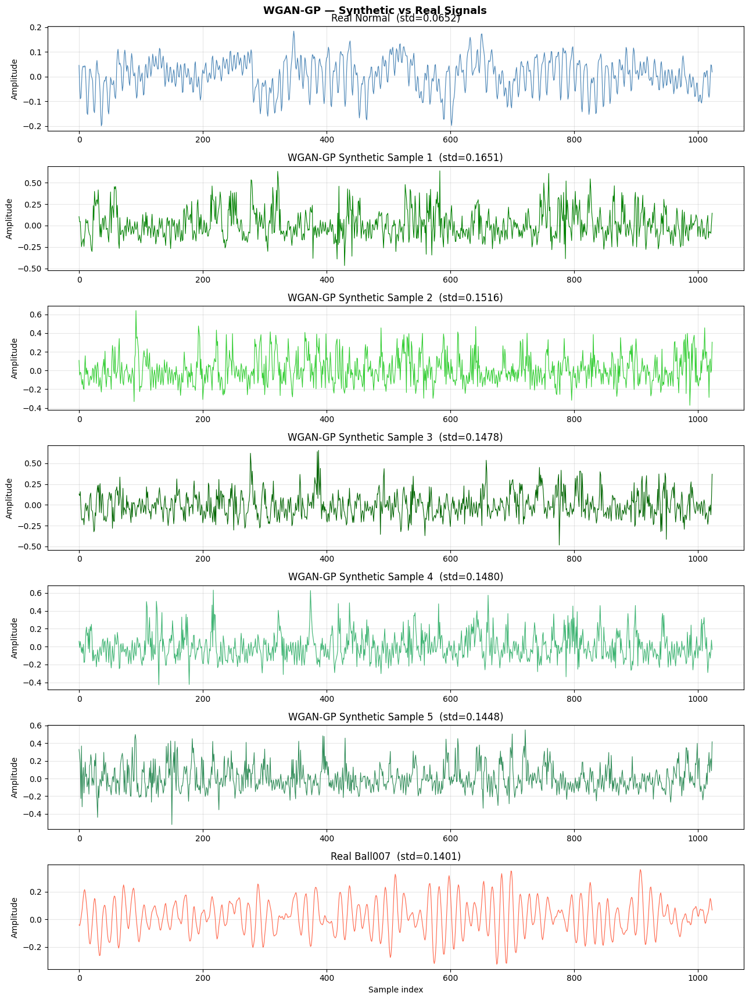

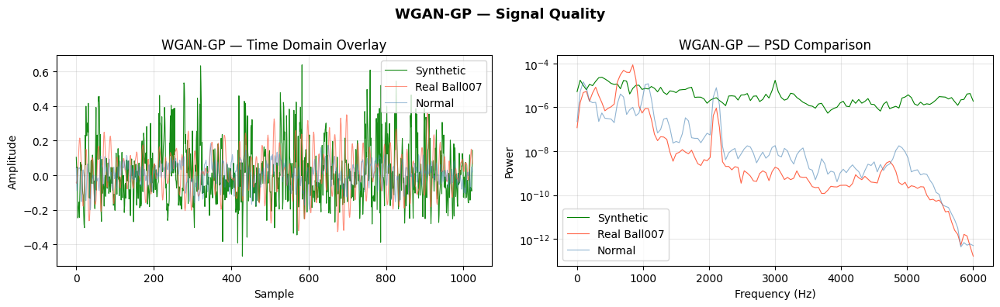


  Running t-SNE...


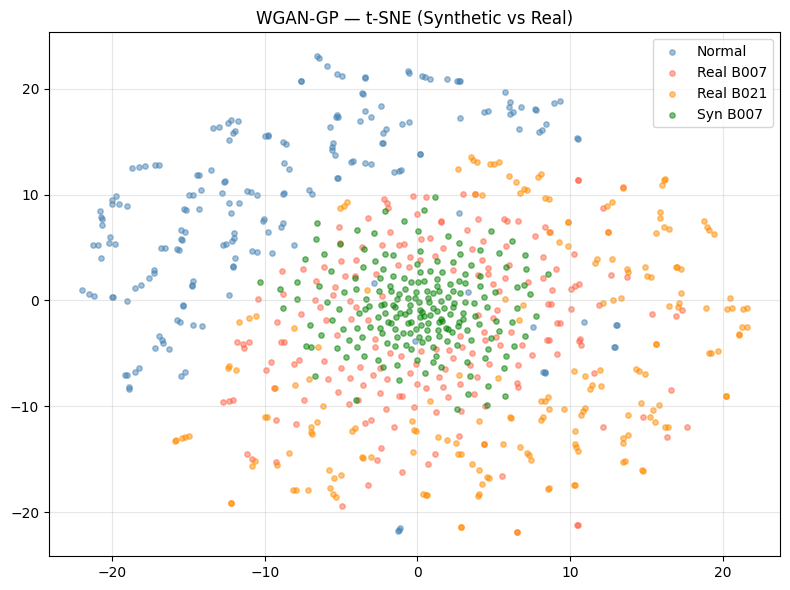


  WGAN-GP — EVALUATION SUMMARY
  Synthetic std    : 0.1603
  Real Ball007 std : 0.1401
  Std score        : 0.0202
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['WGAN-GP']


In [ ]:
# ── E3: WGAN-GP synthesis + evaluation ───────────────────────────────
MODEL_NAME      = "WGAN-GP"
CKPT_FILE       = "best_wgangp.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=WGANGP_Generator, ckpt_file=CKPT_FILE,
    conditioned=True, n_synthetic=N_SYNTHETIC, severity_target=SEVERITY_TARGET,
    results_key="WGAN-GP"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]


# E4: WGAN-GP Training, lambda=10

**Checkpoint:** `best_wgangp2.pth`

This experiment keeps the same WGAN-GP structure as E3 but reduces the standard-deviation penalty to `LAMBDA_STD=10`. The goal is to give the model more freedom to learn realistic signal structure instead of focusing too strongly on amplitude matching.


In [ ]:
# ── E4: WGAN-GP TRAINING (λ=10) ──────────────────────────────────
G, D, wgangp2_history = run_wgangp_training(
    model_name="WGAN-GP", model_key="WGANGP",
    generator_class=WGANGP_Generator, critic_class=WGANGP_Critic,
    ckpt_file="best_wgangp2.pth", gp_fn=gradient_penalty,
    lambda_std=10.0, lr_g=1e-4, lr_d=4e-4,lambda_freq=LAMBDA_FREQ,
    lambda_smooth=LAMBDA_SMOOTH
)

g_losses, d_losses, score_log = wgangp2_history["g_losses"], wgangp2_history["d_losses"], wgangp2_history["score_log"]
best_score, best_G_state, best_D_state = wgangp2_history["best_score"], wgangp2_history["best_G_state"], wgangp2_history["best_D_state"]
syn_std_final, score_final = wgangp2_history["syn_std"], wgangp2_history["score_final"]


  WGAN-GP TRAINING
  Window size       : 1024
  Segments (normal) : 944  α=0.0
  Segments (ball021): 949  α=0.21
  Total segments    : 1893
  Batches per epoch : 60
  N critic          : 5
  Lambda GP         : 10
  Lambda STD        : 10.0
  Target α          : 0.07
  Target std        : 0.1401

  Generator params : 3,375,809
  Critic params    : 66,241

  Starting WGAN-GP training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=54.8088 | D=-142.7900
  Epoch 002/300 | G=58.2109 | D=-137.4390
  Epoch 003/300 | G=54.2011 | D=-128.4188
  Epoch 004/300 | G=49.1838 | D=-121.6152
  Epoch 005/300 | G=47.6191 | D=-116.8025 | syn_std=0.7533 | score=0.6132 | patience=0/50 <- best
  Epoch 006/300 | G=46.7598 | D=-112.5578
  Epoch 007/300 | G=44.9520 | D=-107.8735
  Epoch 008/300 | G=41.5849 | D=-103.5426
  Epoch 009/300 | G=40.1302 | D=-99.4825
  Epoch 010/300 | G=42.0717 | D=-94.4251 | syn_std=0.6768 | score=0.5367 | patience=0/50 <- best
  Epoch 011/300 | G=38.

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp2.pth
  WGAN-GP — MODEL LOADED
  Window      : 1024
  Epochs run  : 300
  Best score  : 0.1634
  Target std  : 0.1401
  Syn std     : 0.3089
  Severity α  : 0.07
  Lambda GP    : 10
  Lambda STD   : 10.0

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.3128
  Synthetic mean : 0.0460
  Target std     : 0.1401
  Real Ball007   : 0.1401


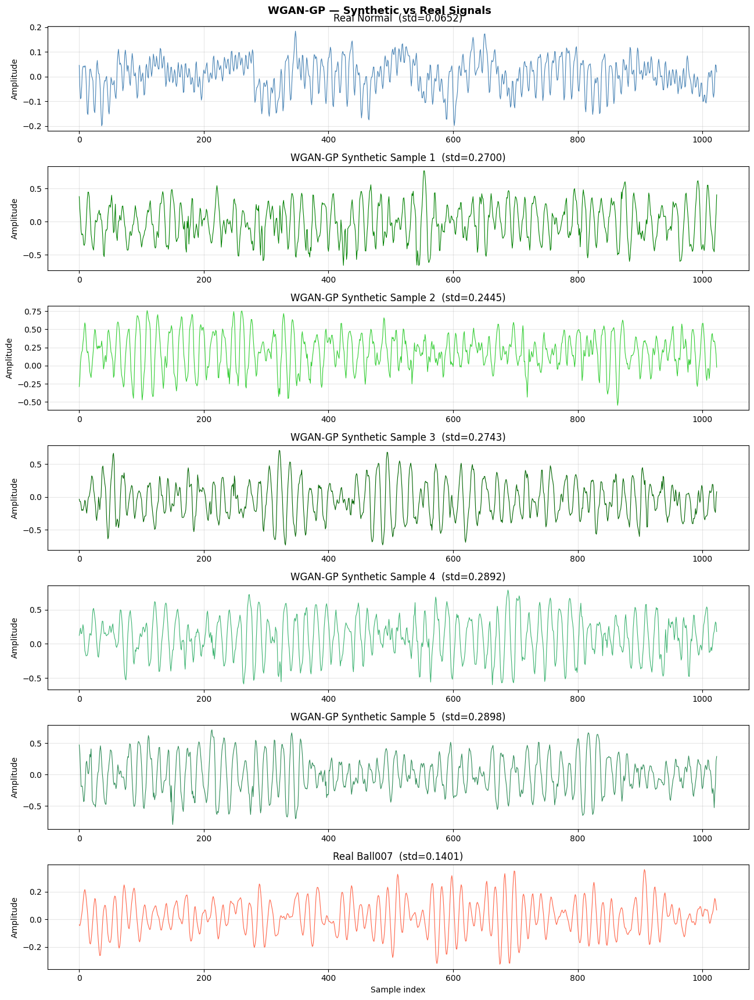

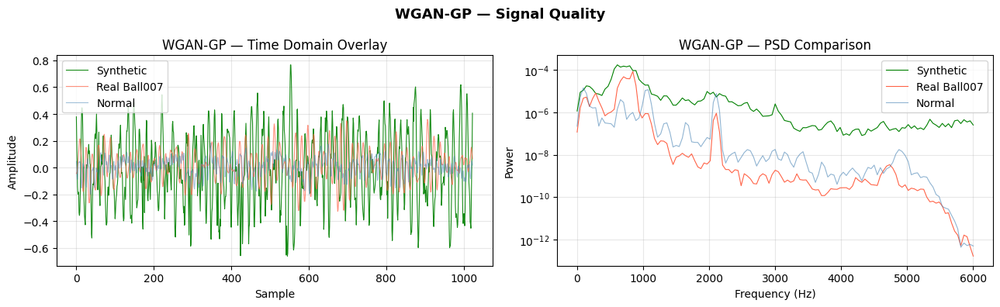


  Running t-SNE...


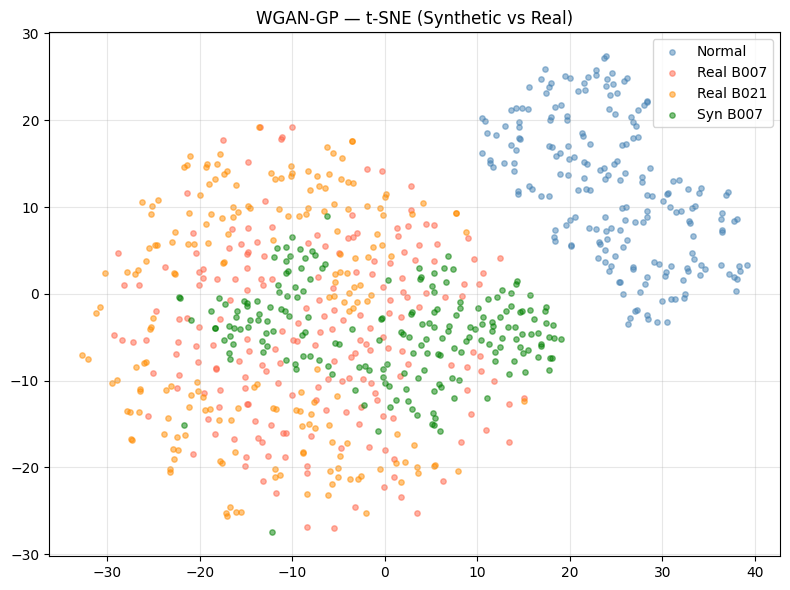


  WGAN-GP — EVALUATION SUMMARY
  Synthetic std    : 0.3128
  Real Ball007 std : 0.1401
  Std score        : 0.1726
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['WGAN-GP']


In [ ]:
# ── E4: WGAN-GP synthesis + evaluation ───────────────────────────────
MODEL_NAME      = "WGAN-GP"
CKPT_FILE       = "best_wgangp2.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=WGANGP_Generator, ckpt_file=CKPT_FILE,
    conditioned=True, n_synthetic=N_SYNTHETIC, severity_target=SEVERITY_TARGET,
    results_key="WGAN-GP"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]


# E5: ResBlock-WGAN-GP Training, lambda=1000

**Checkpoint:** `best_wgangp_res.pth`

This is the first experiment that uses **ResBlocks**. A ResBlock adds a skip connection from input to output, so the generator learns a residual correction instead of rebuilding the whole feature map from scratch.

In simple form:

$$
out = x + F(x)
$$

This helps gradients flow through the generator and can preserve signal patterns while using the stronger `LAMBDA_STD=1000` setting.

**Research paper:** He et al., [Deep Residual Learning for Image Recognition](https://arxiv.org/abs/1512.03385), 2015.


In [ ]:
# ── Residual Block ────────────────────────────────────────────────────
class ResBlock1D(nn.Module):
    """
    Residual block for 1D signals
    output = F(x) + x  ← skip connection
    Inspired by He et al. 2016 (ResNet)
    and Gulrajani et al. 2017 (WGAN-GP paper)
    """
    def __init__(self, channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(channels, channels,
                      kernel_size=3, padding=1),
            nn.BatchNorm1d(channels),
            nn.ReLU(),
            nn.Conv1d(channels, channels,
                      kernel_size=3, padding=1),
            nn.BatchNorm1d(channels),
        )
    def forward(self, x):
        return F.relu(x + self.net(x))


# ── Improved Generator with Residual Blocks ───────────────────────────
class WGANGP_Generator_Res(nn.Module):
    """
    Input  : noise (LATENT_DIM,) + alpha (1,)
    Output : signal (1, window_size)

    Architecture:
      FC → reshape → ResBlock → ResBlock → Upsample → Upsample → Tanh
    """
    def __init__(self, window_size):
        super().__init__()
        self.init_size = window_size // 4
        self.fc        = nn.Linear(LATENT_DIM + 1,
                                   128 * self.init_size)

        # Two residual blocks before upsampling
        self.res1 = ResBlock1D(128)
        self.res2 = ResBlock1D(128)

        # Upsample to full window size
        self.up1  = nn.ConvTranspose1d(128, 64,
                                        kernel_size=4,
                                        stride=2, padding=1)
        self.bn1  = nn.BatchNorm1d(64)
        self.up2  = nn.ConvTranspose1d(64,  1,
                                        kernel_size=4,
                                        stride=2, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, z, alpha):
        x = torch.cat([z, alpha], dim=1)          # (B, 101)
        x = self.fc(x)                             # (B, 128 * init_size)
        x = x.view(z.size(0), 128, self.init_size) # (B, 128, 256)
        x = self.res1(x)                           # (B, 128, 256)
        x = self.res2(x)                           # (B, 128, 256)
        x = F.relu(self.bn1(self.up1(x)))          # (B, 64,  512)
        x = self.tanh(self.up2(x))                 # (B, 1,  1024)
        return x


# ── Improved Critic with Spectral Norm ───────────────────────────────
class WGANGP_Critic_Res(nn.Module):
    """
    Input  : signal (2, window_size) — signal + alpha channel
    Output : raw score (no sigmoid)

    Uses spectral normalization for more stable training
    """
    def __init__(self, window_size):
        super().__init__()
        self.net = nn.Sequential(
            nn.utils.spectral_norm(
                nn.Conv1d(2, 64, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2),
            nn.utils.spectral_norm(
                nn.Conv1d(64, 128, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2),
            nn.utils.spectral_norm(
                nn.Conv1d(128, 256, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.utils.spectral_norm(
                nn.Linear(256 * (window_size // 8), 1))
        )
    def forward(self, x, alpha):
        alpha_ch = alpha.unsqueeze(2).expand(-1, -1, x.size(2))
        x        = torch.cat([x, alpha_ch], dim=1)
        return self.net(x)


# ── Gradient penalty ──────────────────────────────────────────────────
def gradient_penalty_res(critic, real, fake, alpha, device):
    B, C, L  = real.shape
    eps      = torch.rand(B, 1, 1).repeat(1, C, L).to(device)
    interp   = (eps * real + (1 - eps) * fake).requires_grad_(True)
    d_interp = critic(interp, alpha)
    grad     = torch.autograd.grad(
        outputs=d_interp,
        inputs=interp,
        grad_outputs=torch.ones_like(d_interp),
        create_graph=True,
        retain_graph=True,
    )[0]
    grad = grad.view(B, -1)
    gp   = ((grad.norm(2, dim=1) - 1) ** 2).mean()
    return gp


In [ ]:
# ── E5: ResBlock-WGAN-GP TRAINING (λ=1000) ───────────────────────
G, D, wgangp_res_history = run_wgangp_training(
    model_name="Improved WGAN-GP", model_key="WGANGP_Res",
    generator_class=WGANGP_Generator_Res, critic_class=WGANGP_Critic_Res,
    ckpt_file="best_wgangp_res.pth", gp_fn=gradient_penalty_res,
    lambda_std=1000.0, lr_g=1e-4, lr_d=1e-4
)

g_losses, d_losses, score_log = wgangp_res_history["g_losses"], wgangp_res_history["d_losses"], wgangp_res_history["score_log"]
best_score, best_G_state, best_D_state = wgangp_res_history["best_score"], wgangp_res_history["best_G_state"], wgangp_res_history["best_D_state"]
syn_std_final, score_final = wgangp_res_history["syn_std"], wgangp_res_history["score_final"]


  Improved WGAN-GP TRAINING
  Window size       : 1024
  Segments (normal) : 944  α=0.0
  Segments (ball021): 949  α=0.21
  Total segments    : 1893
  Batches per epoch : 60
  N critic          : 5
  Lambda GP         : 10
  Lambda STD        : 1000.0
  Target α          : 0.07
  Target std        : 0.1401

  Generator params : 3,573,697
  Critic params    : 197,569

  Starting Improved WGAN-GP training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=273.4398 | D=-60.2749
  Epoch 002/300 | G=52.1934 | D=-67.3217
  Epoch 003/300 | G=-3.4148 | D=-26.1294
  Epoch 004/300 | G=-7.0932 | D=-24.3380
  Epoch 005/300 | G=-7.5313 | D=-25.2987 | syn_std=0.2243 | score=0.0841 | patience=0/50 <- best
  Epoch 006/300 | G=-8.4694 | D=-26.7290
  Epoch 007/300 | G=-9.8338 | D=-27.5572
  Epoch 008/300 | G=-10.2360 | D=-28.2192
  Epoch 009/300 | G=-10.9899 | D=-28.9128
  Epoch 010/300 | G=-11.8660 | D=-28.9964 | syn_std=0.2189 | score=0.0788 | patience=0/50 <- best
  Epoc

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_res.pth
  ResBlock-WGAN-GP — MODEL LOADED
  Window      : 1024
  Epochs run  : 265
  Best score  : 0.0408
  Target std  : 0.1401
  Syn std     : 0.1771
  Severity α  : 0.07
  Lambda GP    : 10
  Lambda STD   : 1000.0

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.1748
  Synthetic mean : -0.0307
  Target std     : 0.1401
  Real Ball007   : 0.1401


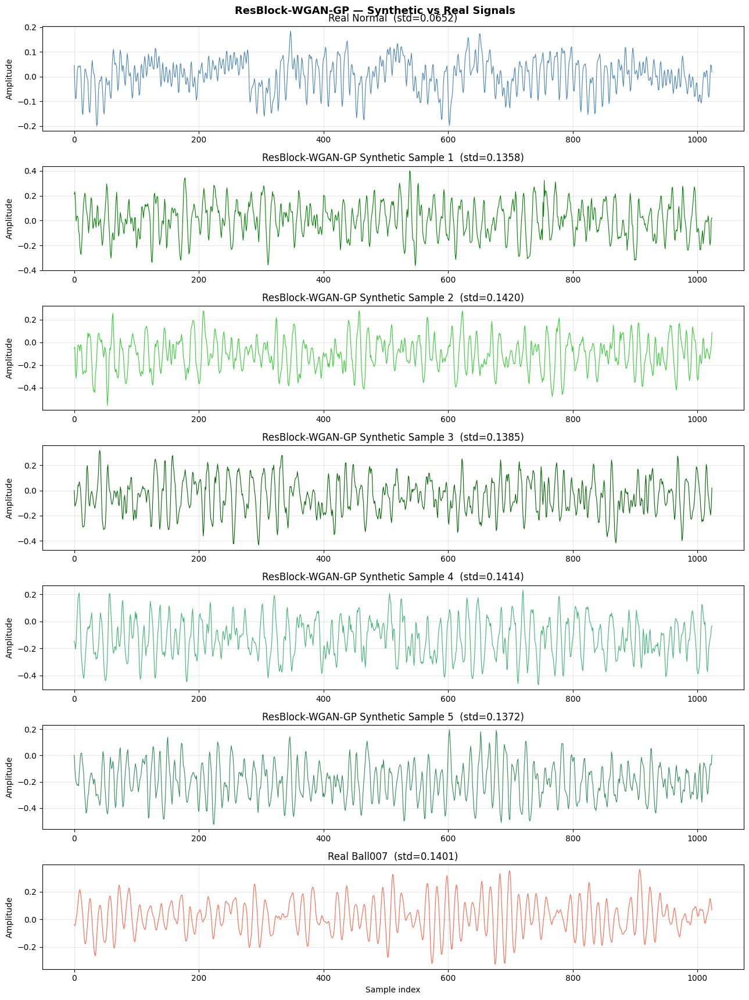

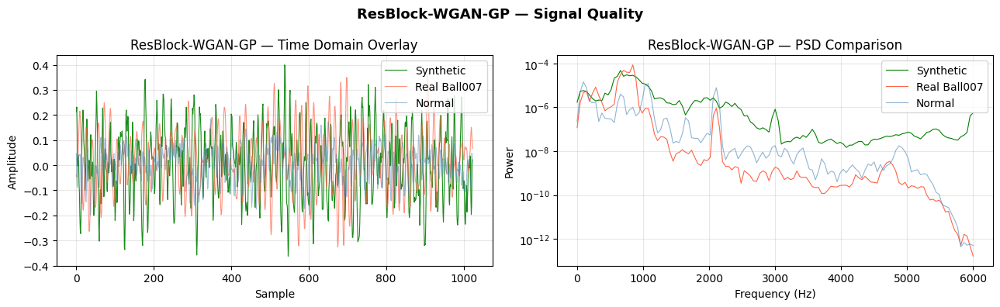


  Running t-SNE...


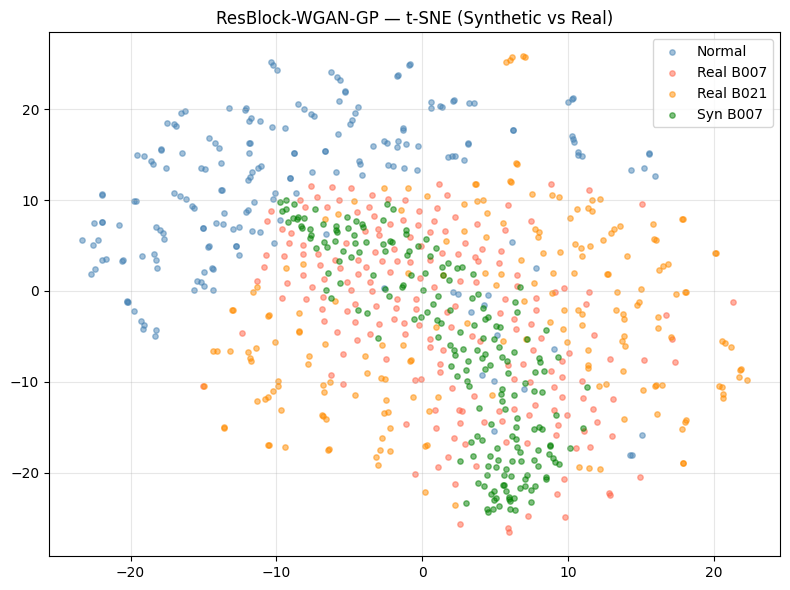


  ResBlock-WGAN-GP — EVALUATION SUMMARY
  Synthetic std    : 0.1748
  Real Ball007 std : 0.1401
  Std score        : 0.0347
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['ResBlock-WGAN-GP']


In [ ]:
# ── E5: ResBlock-WGAN-GP synthesis + evaluation ──────────────────────
MODEL_NAME      = "ResBlock-WGAN-GP"
CKPT_FILE       = "best_wgangp_res.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=WGANGP_Generator_Res, ckpt_file=CKPT_FILE,
    conditioned=True, n_synthetic=N_SYNTHETIC, severity_target=SEVERITY_TARGET,
    results_key="ResBlock-WGAN-GP"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]


# E6: FiLM-Res-WGAN-GP Training, lambda=10

**Checkpoint:** `best_wgangp_film_res.pth`

This is the first experiment that uses **FiLM** conditioning. FiLM means Feature-wise Linear Modulation. The severity value `alpha` is embedded, then converted into feature-wise scale and shift values.

In simple form:

$$
FiLM(x, \alpha) = \gamma(\alpha) \cdot x + \beta(\alpha)
$$

This lets the generator change its internal features depending on the target severity, such as `alpha=0.07` for Ball007. E6 combines FiLM with ResBlocks to test whether severity modulation plus residual learning improves the generated signal.

**Research paper:** Perez et al., [FiLM: Visual Reasoning with a General Conditioning Layer](https://arxiv.org/abs/1709.07871), 2017.


In [ ]:
# ── Residual block with FiLM conditioning ─────────────────────────────
class FiLMResBlock(nn.Module):
    """
    ResBlock where alpha modulates features via FiLM
    Inspired by:
      - He et al. 2016 (ResNet)
      - Perez et al. 2018 (FiLM)
      - ArtifactGen 2025 (FiLM + WGAN-GP for 1D signals)
    """
    def __init__(self, channels, alpha_dim=32):
        super().__init__()
        self.conv1 = nn.Conv1d(channels, channels,
                               kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm1d(channels)
        self.conv2 = nn.Conv1d(channels, channels,
                               kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm1d(channels)
        self.film  = FiLM(channels, alpha_dim)   # ← FiLM layer

    def forward(self, x, alpha_emb):
        residual = F.relu(self.bn1(self.conv1(x)))
        residual = self.bn2(self.conv2(residual))
        residual = self.film(residual, alpha_emb)  # ← modulate by α
        return F.relu(x + residual)                # ← skip connection


# ── FiLM-Res Generator ────────────────────────────────────────────────
class WGANGP_Generator_FiLM_Res(nn.Module):
    """
    Generator with FiLM-conditioned ResBlocks
    α embedded → modulates every ResBlock
    z → FC → ResBlock(α) → ResBlock(α) → Upsample → Tanh
    """
    def __init__(self, window_size, alpha_dim=32):
        super().__init__()
        self.init_size  = window_size // 4
        self.alpha_dim  = alpha_dim

        # Alpha embedding — richer than just one number
        self.alpha_embed = nn.Sequential(
            nn.Linear(1,        alpha_dim),
            nn.ReLU(),
            nn.Linear(alpha_dim, alpha_dim),
        )

        # Noise → features
        self.fc   = nn.Linear(LATENT_DIM, 128 * self.init_size)
        self.bn0  = nn.BatchNorm1d(128)

        # FiLM-conditioned residual blocks
        self.res1 = FiLMResBlock(128, alpha_dim)
        self.res2 = FiLMResBlock(128, alpha_dim)

        # Upsample to full window
        self.up1  = nn.ConvTranspose1d(128, 64,
                                        kernel_size=4,
                                        stride=2, padding=1)
        self.bn1  = nn.BatchNorm1d(64)
        self.up2  = nn.ConvTranspose1d(64,  1,
                                        kernel_size=4,
                                        stride=2, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, z, alpha):
        # 1. Embed alpha into rich representation
        a_emb = self.alpha_embed(alpha)              # (B, alpha_dim)

        # 2. Project noise to feature map
        x = self.fc(z)                               # (B, 128*256)
        x = x.view(z.size(0), 128, self.init_size)  # (B, 128, 256)
        x = self.bn0(x)

        # 3. FiLM-conditioned residual blocks
        x = self.res1(x, a_emb)                     # α modulates here
        x = self.res2(x, a_emb)                     # α modulates here

        # 4. Upsample to window size
        x = F.relu(self.bn1(self.up1(x)))            # (B, 64,  512)
        x = self.tanh(self.up2(x))                   # (B, 1,  1024)
        return x


In [ ]:
# ── E6: FiLM-Res-WGAN-GP TRAINING (λ=10) ─────────────────────────────
G, D, wgangp_film_history = run_wgangp_training(
    model_name="FiLM-Res-WGAN-GP", model_key="FiLM_Res_WGANGP",
    generator_class=WGANGP_Generator_FiLM_Res, critic_class=WGANGP_Critic_FiLM,
    ckpt_file="best_wgangp_film_res.pth", gp_fn=gradient_penalty_film,
    lambda_std=10.0, lr_g=1e-4, lr_d=1e-4
)

g_losses, d_losses, score_log = wgangp_film_history["g_losses"], wgangp_film_history["d_losses"], wgangp_film_history["score_log"]
best_score, best_G_state, best_D_state = wgangp_film_history["best_score"], wgangp_film_history["best_G_state"], wgangp_film_history["best_D_state"]
syn_std_final, score_final = wgangp_film_history["syn_std"], wgangp_film_history["score_final"]


  FiLM-Res-WGAN-GP TRAINING
  Window size       : 1024
  Segments (normal) : 944  α=0.0
  Segments (ball021): 949  α=0.21
  Total segments    : 1893
  Batches per epoch : 60
  N critic          : 5
  Lambda GP         : 10
  Lambda STD        : 10.0
  Target α          : 0.07
  Target std        : 0.1401

  Generator params : 3,559,201
  Critic params    : 197,569

  Starting FiLM-Res-WGAN-GP training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=14.1581 | D=-60.4564
  Epoch 002/300 | G=14.4267 | D=-61.1702
  Epoch 003/300 | G=10.5471 | D=-46.1308
  Epoch 004/300 | G=-1.2033 | D=-11.1453
  Epoch 005/300 | G=-7.7458 | D=-5.5386 | syn_std=0.3183 | score=0.1782 | patience=0/50 <- best
  Epoch 006/300 | G=-9.2497 | D=-2.8663
  Epoch 007/300 | G=-10.2795 | D=-3.2571
  Epoch 008/300 | G=-11.9729 | D=-4.1895
  Epoch 009/300 | G=-12.6177 | D=-5.1732
  Epoch 010/300 | G=-12.8126 | D=-5.4314 | syn_std=0.3290 | score=0.1889 | patience=1/50
  Epoch 011/300 | G=-1

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_film_res.pth
  FiLM-Res-WGAN-GP — MODEL LOADED
  Window      : 1024
  Epochs run  : 300
  Best score  : 0.0381
  Target std  : 0.1401
  Syn std     : 0.1776
  Severity α  : 0.07
  Lambda GP    : 10
  Lambda STD   : 10.0

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.1795
  Synthetic mean : -0.0551
  Target std     : 0.1401
  Real Ball007   : 0.1401


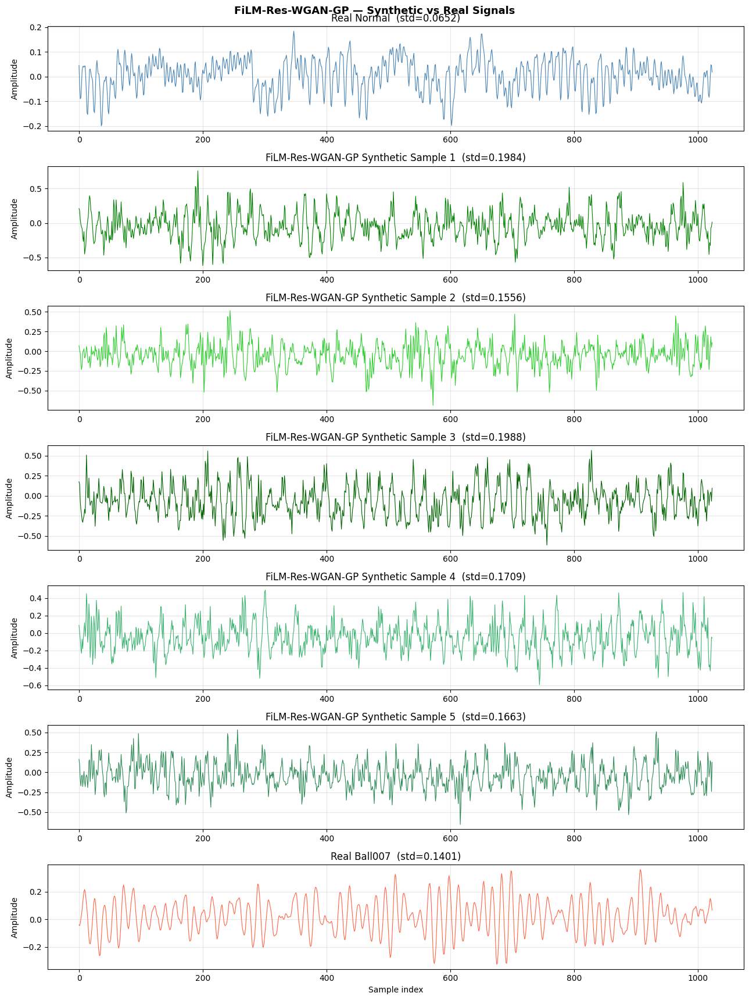

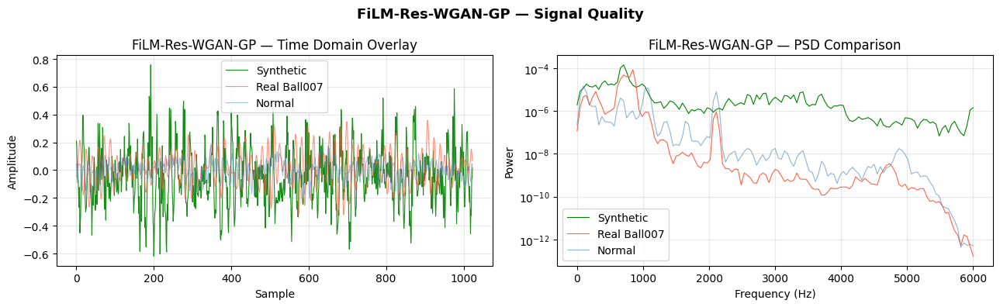


  Running t-SNE...


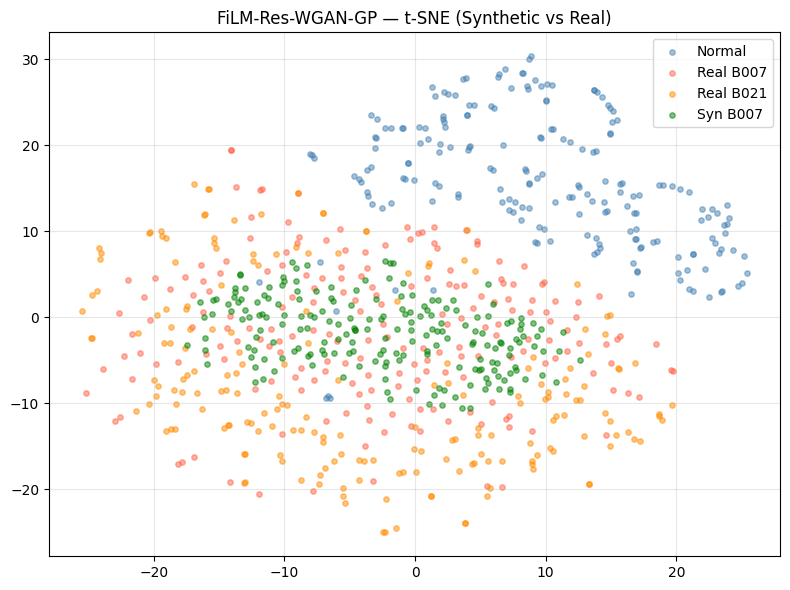


  FiLM-Res-WGAN-GP — EVALUATION SUMMARY
  Synthetic std    : 0.1795
  Real Ball007 std : 0.1401
  Std score        : 0.0394
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['FiLM-Res-WGAN-GP']

  Running severity sweep...


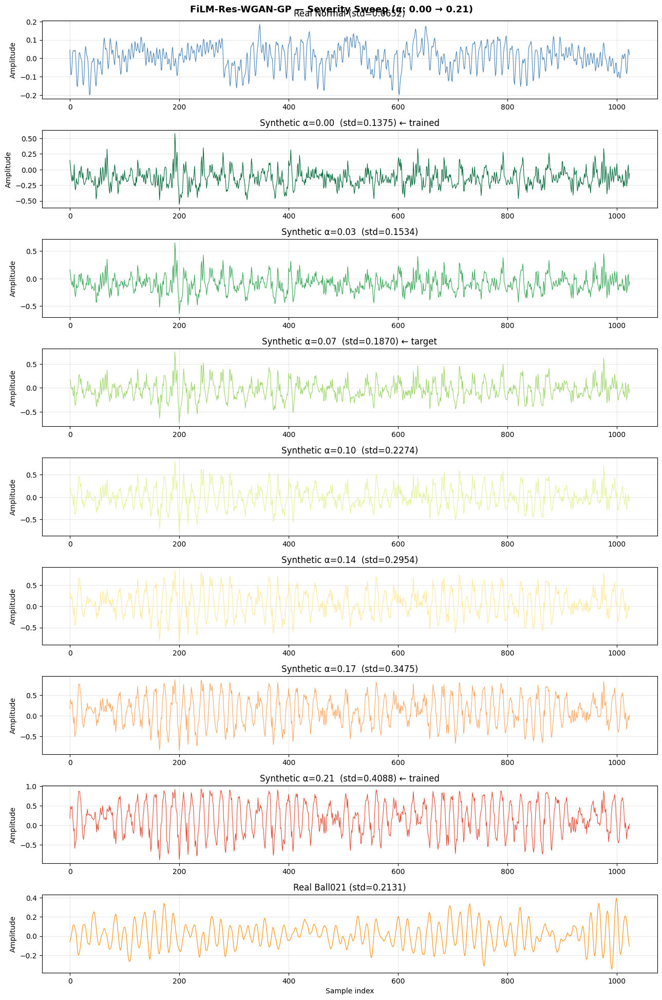

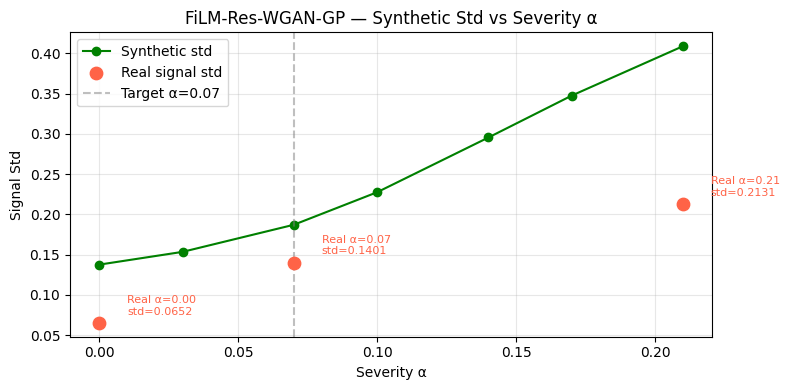


  Severity Sweep Results:
     Alpha    Syn Std   Real Std
  ──────────────────────────────
      0.00     0.1375     0.0652 ← trained
      0.03     0.1534          ─
      0.07     0.1870     0.1401 ← target
      0.10     0.2274          ─
      0.14     0.2954          ─
      0.17     0.3475          ─
      0.21     0.4088     0.2131 ← trained


In [ ]:
# ── E6: FiLM-Res-WGAN-GP synthesis + evaluation ─────────────────────
MODEL_NAME      = "FiLM-Res-WGAN-GP"
CKPT_FILE       = "best_wgangp_film_res.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=WGANGP_Generator_FiLM_Res,
    ckpt_file=CKPT_FILE, conditioned=True, n_synthetic=N_SYNTHETIC,
    severity_target=SEVERITY_TARGET, results_key="FiLM-Res-WGAN-GP"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]

# FiLM-specific severity behavior.
sweep_results = plot_severity_sweep(G_eval, MODEL_NAME, ckpt["window"],
                                    severity_target=SEVERITY_TARGET)
alphas = sweep_results["alphas"]
sweep_stds = sweep_results["sweep_stds"]
sweep_sigs = sweep_results["sweep_sigs"]
real_stds = sweep_results["real_stds"]


# E7: FiLM-WGAN-GP Training, lambda=10

**Checkpoint:** `best_wgangp_film.pth`

This experiment uses FiLM conditioning without ResBlocks. It keeps the architecture simpler while still allowing `alpha` to control the generated signal features through learned scale and shift values. This tests whether FiLM alone is enough to generate useful Ball007-like signals.


In [ ]:
# ── FiLM-only Generator (no ResBlock) ────────────────────────────────
class WGANGP_Generator_FiLM(nn.Module):
    """
    Generator with FiLM but NO ResBlock
    Architecture:
      z + α → FC → FiLM(α) → Upsample → FiLM(α) → Upsample → Tanh

    FiLM modulates at each upsample stage
    No skip connections → simpler than FiLM+ResBlock
    """
    def __init__(self, window_size, alpha_dim=32):
        super().__init__()
        self.init_size  = window_size // 4
        self.alpha_dim  = alpha_dim

        # Alpha embedding
        self.alpha_embed = nn.Sequential(
            nn.Linear(1,         alpha_dim),
            nn.ReLU(),
            nn.Linear(alpha_dim, alpha_dim),
        )

        # Noise projection
        self.fc  = nn.Linear(LATENT_DIM, 128 * self.init_size)
        self.bn0 = nn.BatchNorm1d(128)

        # FiLM after initial projection
        self.film0 = FiLM(128, alpha_dim)

        # Upsample 1
        self.up1   = nn.ConvTranspose1d(128, 64,
                                         kernel_size=4,
                                         stride=2, padding=1)
        self.bn1   = nn.BatchNorm1d(64)

        # FiLM after upsample 1
        self.film1 = FiLM(64, alpha_dim)

        # Upsample 2
        self.up2   = nn.ConvTranspose1d(64, 1,
                                         kernel_size=4,
                                         stride=2, padding=1)
        self.tanh  = nn.Tanh()

    def forward(self, z, alpha):
        # 1. Embed alpha
        a_emb = self.alpha_embed(alpha)              # (B, alpha_dim)

        # 2. Project noise
        x = self.fc(z)
        x = x.view(z.size(0), 128, self.init_size)  # (B, 128, 256)
        x = self.bn0(x)

        # 3. FiLM modulate initial features
        x = self.film0(x, a_emb)                    # (B, 128, 256)
        x = F.relu(x)

        # 4. Upsample 1
        x = F.relu(self.bn1(self.up1(x)))            # (B, 64,  512)

        # 5. FiLM modulate after upsample 1
        x = self.film1(x, a_emb)                    # (B, 64,  512)
        x = F.relu(x)

        # 6. Upsample 2
        x = self.tanh(self.up2(x))                   # (B, 1,  1024)
        return x


In [ ]:
# ── E7: FiLM-WGAN-GP TRAINING (λ=10) ──────────────────────
G, D, wgangp_film_simple_history = run_wgangp_training(
    model_name="FiLM-WGAN-GP", model_key="FiLM_WGANGP",
    generator_class=WGANGP_Generator_FiLM, critic_class=WGANGP_Critic_FiLM,
    ckpt_file="best_wgangp_film.pth", gp_fn=gradient_penalty_film,
    lambda_std=10.0, lr_g=1e-4, lr_d=1e-4
)

g_losses, d_losses, score_log = wgangp_film_simple_history["g_losses"], wgangp_film_simple_history["d_losses"], wgangp_film_simple_history["score_log"]
best_score, best_G_state, best_D_state = wgangp_film_simple_history["best_score"], wgangp_film_simple_history["best_G_state"], wgangp_film_simple_history["best_D_state"]
syn_std_final, score_final = wgangp_film_simple_history["syn_std"], wgangp_film_simple_history["score_final"]


  FiLM-WGAN-GP TRAINING
  Window size       : 1024
  Segments (normal) : 944  α=0.0
  Segments (ball021): 949  α=0.21
  Total segments    : 1893
  Batches per epoch : 60
  N critic          : 5
  Lambda GP         : 10
  Lambda STD        : 10.0
  Target α          : 0.07
  Target std        : 0.1401

  Generator params : 3,356,833
  Critic params    : 197,569

  Starting FiLM-WGAN-GP training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=-3.4180 | D=-12.3955
  Epoch 002/300 | G=-11.0347 | D=-15.0018
  Epoch 003/300 | G=-13.3869 | D=-8.4101
  Epoch 004/300 | G=-15.4795 | D=-8.0125
  Epoch 005/300 | G=-15.3117 | D=-7.6141 | syn_std=0.3226 | score=0.1825 | patience=0/50 <- best
  Epoch 006/300 | G=-15.5266 | D=-7.5900
  Epoch 007/300 | G=-15.8575 | D=-7.5222
  Epoch 008/300 | G=-15.9407 | D=-7.8556
  Epoch 009/300 | G=-16.4691 | D=-8.1092
  Epoch 010/300 | G=-16.4428 | D=-8.1042 | syn_std=0.3428 | score=0.2027 | patience=1/50
  Epoch 011/300 | G=-16.658

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_film.pth
  FiLM-WGAN-GP — MODEL LOADED
  Window      : 1024
  Epochs run  : 300
  Best score  : 0.0936
  Target std  : 0.1401
  Syn std     : 0.2287
  Severity α  : 0.07
  Lambda GP    : 10
  Lambda STD   : 10.0

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.2345
  Synthetic mean : 0.0328
  Target std     : 0.1401
  Real Ball007   : 0.1401


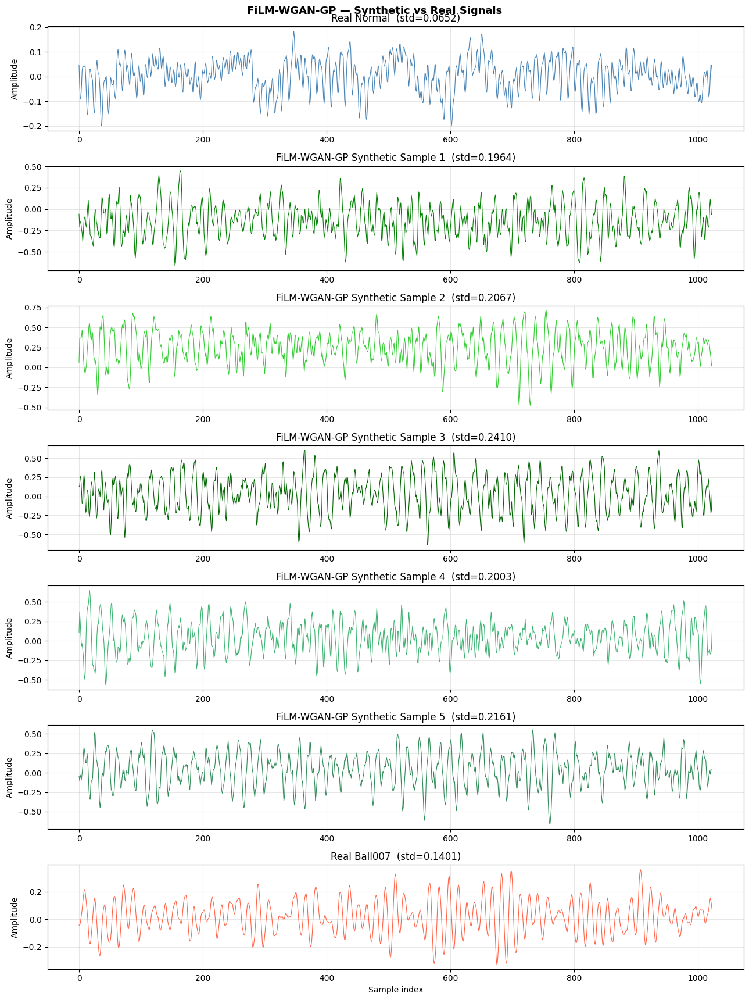

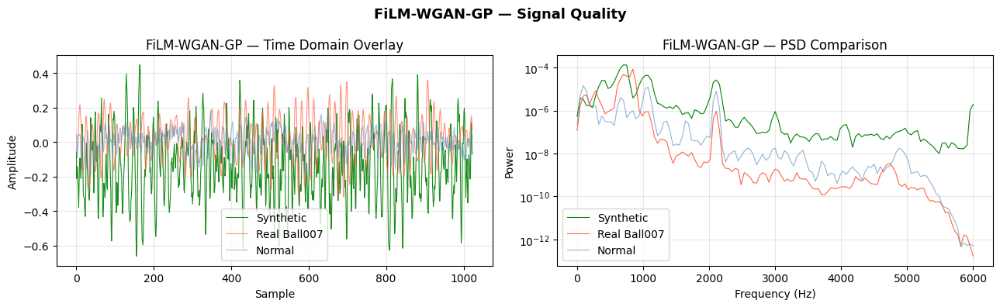


  Running t-SNE...


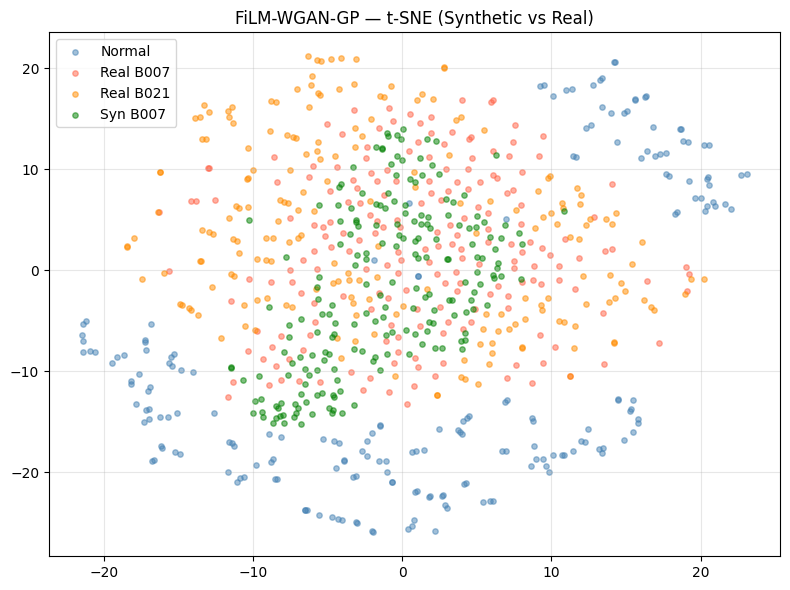


  FiLM-WGAN-GP — EVALUATION SUMMARY
  Synthetic std    : 0.2345
  Real Ball007 std : 0.1401
  Std score        : 0.0944
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['FiLM-WGAN-GP']

  Running severity sweep...


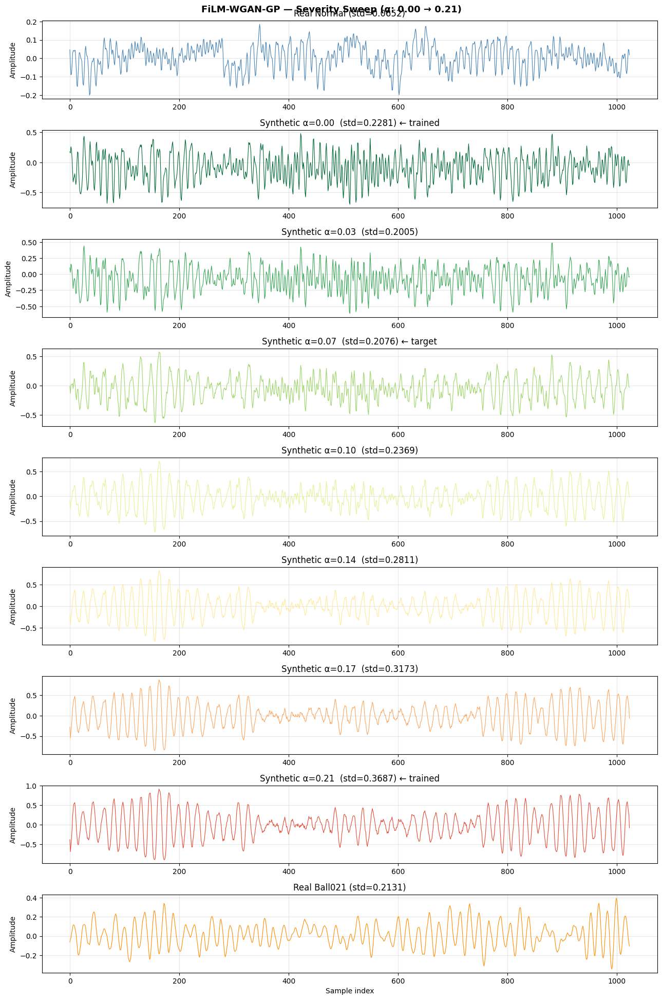

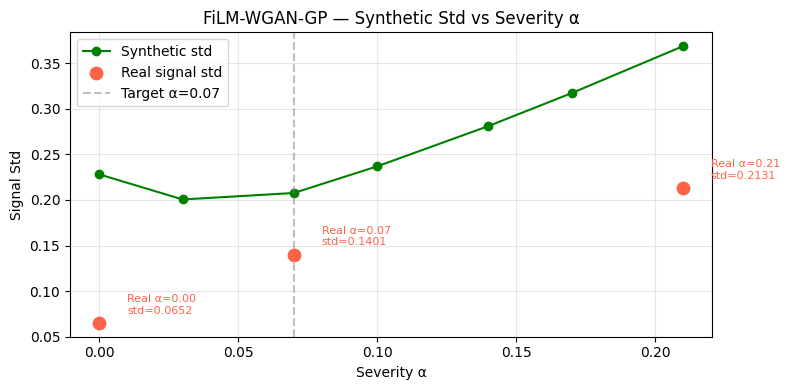


  Severity Sweep Results:
     Alpha    Syn Std   Real Std
  ──────────────────────────────
      0.00     0.2281     0.0652 ← trained
      0.03     0.2005          ─
      0.07     0.2076     0.1401 ← target
      0.10     0.2369          ─
      0.14     0.2811          ─
      0.17     0.3173          ─
      0.21     0.3687     0.2131 ← trained


In [ ]:
# ── E7: FiLM-WGAN-GP synthesis + evaluation ─────────────────────
MODEL_NAME      = "FiLM-WGAN-GP"
CKPT_FILE       = "best_wgangp_film.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=WGANGP_Generator_FiLM,
    ckpt_file=CKPT_FILE, conditioned=True, n_synthetic=N_SYNTHETIC,
    severity_target=SEVERITY_TARGET, results_key="FiLM-WGAN-GP"
)

# Keep old variable names available for later cells.
ckpt = eval_metrics["ckpt"]
syn_std, syn_mean = eval_metrics["syn_std"], eval_metrics["syn_mean"]
mmd_score, real_b007 = eval_metrics["mmd_score"], eval_metrics["real_b007"]

# FiLM-specific severity behavior.
sweep_results = plot_severity_sweep(G_eval, MODEL_NAME, ckpt["window"],
                                    severity_target=SEVERITY_TARGET)
alphas = sweep_results["alphas"]
sweep_stds = sweep_results["sweep_stds"]
sweep_sigs = sweep_results["sweep_sigs"]
real_stds = sweep_results["real_stds"]


# E8: Frequency-Aware WGAN-GP Training, lambda=10

**Checkpoint:** `best_wgangp_film_fa.pth`

In this experiment, we improve the standard WGAN-GP by adding a frequency-domain loss. Since bearing fault signals are strongly related to vibration frequency patterns, the generator should not only fool the critic but also match the frequency structure of real Ball007 signals.

The Frequency-Aware WGAN-GP adds an FFT-based loss to reduce the difference between real and synthetic signals in the frequency domain. This helps the generated signals preserve important spectral characteristics and reduces unrealistic noise or spikes.

In [ ]:
# ── E8: Frequency-Aware WGAN-GP TRAINING (λ=10) ──────────────────

# E9: FA-WGAN-GP (plain, no FiLM)
G, D, fa_wgangp_history = run_wgangp_training(
    model_name="FA-WGAN-GP",
    model_key="FA_WGANGP",
    generator_class=WGANGP_Generator,    # ← plain! not FiLM
    critic_class=WGANGP_Critic,
    ckpt_file="best_wgangp_fa.pth",
    gp_fn=gradient_penalty,
    lambda_std=10.0,
    lambda_freq=LAMBDA_FREQ,
    lambda_smooth=LAMBDA_SMOOTH,
    lr_g=1e-4,
    lr_d=1e-4,
    early_stop=30
)

g_losses = fa_wgangp_history["g_losses"]
d_losses = fa_wgangp_history["d_losses"]
score_log = fa_wgangp_history["score_log"]

best_score = fa_wgangp_history["best_score"]
best_G_state = fa_wgangp_history["best_G_state"]
best_D_state = fa_wgangp_history["best_D_state"]

syn_std_final = fa_wgangp_history["syn_std"]
score_final = fa_wgangp_history["score_final"]


  FA-WGAN-GP TRAINING
  Window size       : 1024
  Segments (normal) : 944  α=0.0
  Segments (ball021): 949  α=0.21
  Total segments    : 1893
  Batches per epoch : 60
  N critic          : 5
  Lambda GP         : 10
  Lambda STD        : 10.0
  Target α          : 0.07
  Target std        : 0.1401

  Generator params : 3,375,809
  Critic params    : 66,241

  Starting FA-WGAN-GP training...
  ───────────────────────────────────────────────────────
  Epoch 001/300 | G=44.8432 | D=-109.3410
  Epoch 002/300 | G=50.1348 | D=-134.4719
  Epoch 003/300 | G=47.9693 | D=-126.6591
  Epoch 004/300 | G=46.5342 | D=-121.6437
  Epoch 005/300 | G=45.4150 | D=-117.5235 | syn_std=0.7418 | score=0.6016 | patience=0/30 <- best
  Epoch 006/300 | G=43.5701 | D=-113.3143
  Epoch 007/300 | G=40.7745 | D=-109.2402
  Epoch 008/300 | G=37.8408 | D=-105.1355
  Epoch 009/300 | G=36.2455 | D=-100.2365
  Epoch 010/300 | G=34.6412 | D=-94.8737 | syn_std=0.6537 | score=0.5136 | patience=0/30 <- best
  Epoch 011/300 

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_fa.pth
  FA-WGAN-GP — MODEL LOADED
  Window      : 1024
  Epochs run  : 235
  Best score  : 0.1435
  Target std  : 0.1401
  Syn std     : 0.2812
  Severity α  : 0.07
  Lambda GP    : 10
  Lambda STD   : 10.0

  Generated 500 synthetic signals at α=0.07
  Synthetic std  : 0.2860
  Synthetic mean : 0.0373
  Target std     : 0.1401
  Real Ball007   : 0.1401


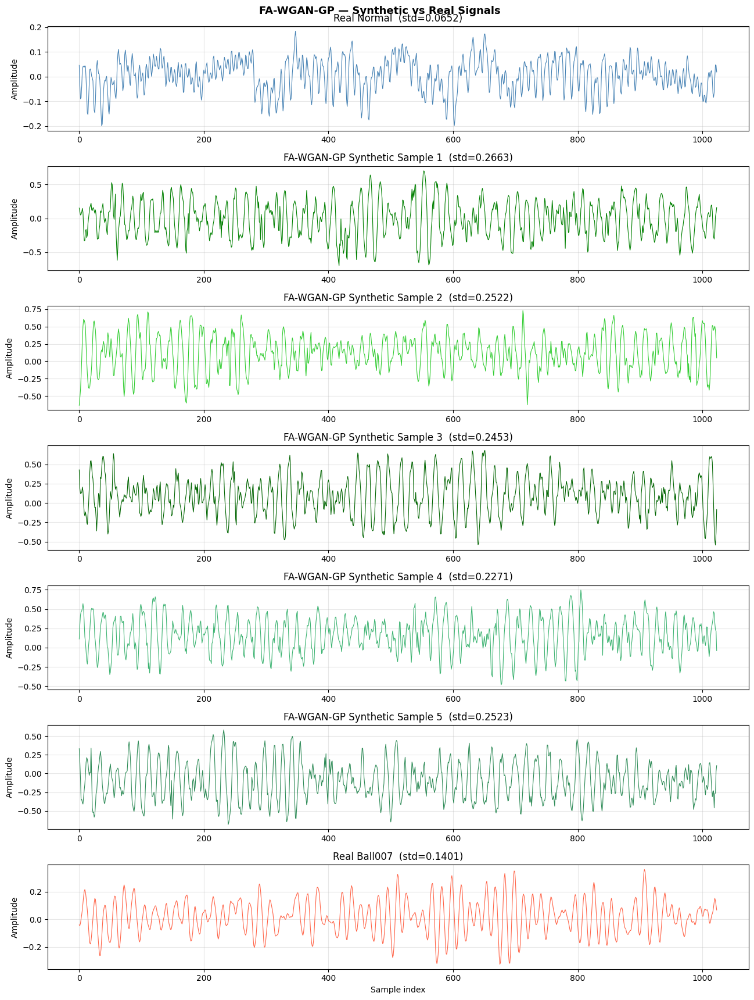

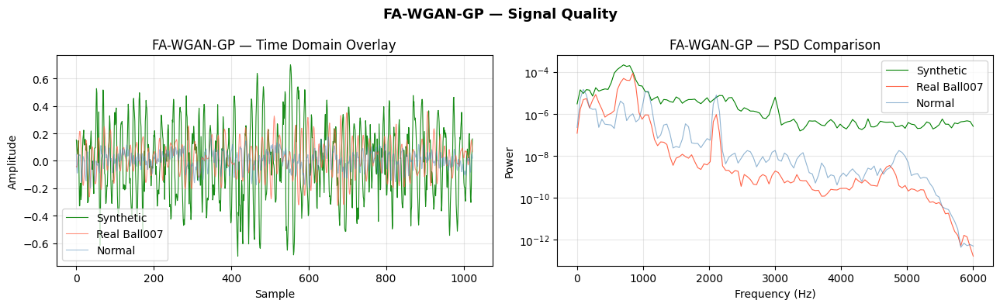


  Running t-SNE...


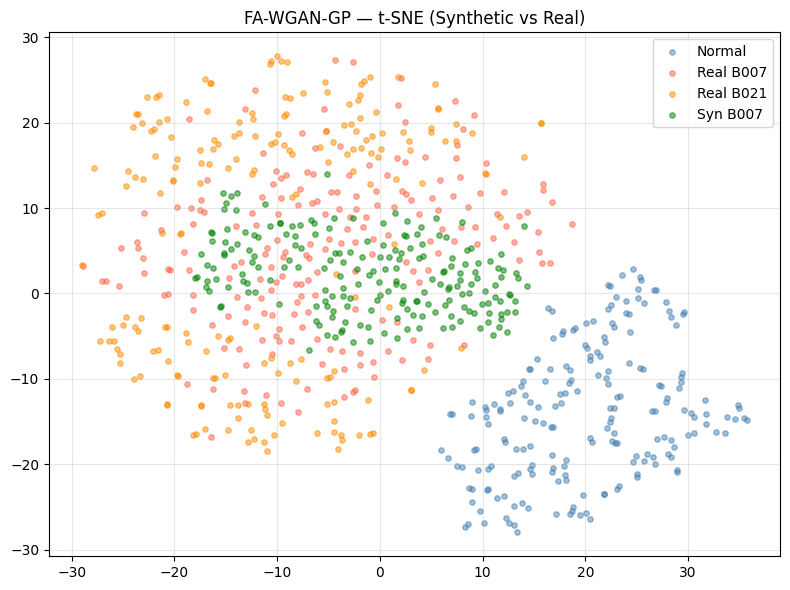


  FA-WGAN-GP — EVALUATION SUMMARY
  Synthetic std    : 0.2860
  Real Ball007 std : 0.1401
  Std score        : 0.1459
  MMD score        : 0.0100  ← lower = more similar

  Results saved to RESULTS_TABLE['FA-WGAN-GP']


In [ ]:
# ── E9: FA-WGAN-GP synthesis + evaluation ────────────────────────────
MODEL_NAME      = "FA-WGAN-GP"
CKPT_FILE       = "best_wgangp_fa.pth"
N_SYNTHETIC     = 500
SEVERITY_TARGET = 0.07

G_eval, syn_sigs, eval_metrics = synthesize_evaluate(
    model_name=MODEL_NAME, generator_class=WGANGP_Generator,  # ← plain!
    ckpt_file=CKPT_FILE, conditioned=True, n_synthetic=N_SYNTHETIC,
    severity_target=SEVERITY_TARGET, results_key="FA-WGAN-GP"
)

ckpt     = eval_metrics["ckpt"]
syn_std  = eval_metrics["syn_std"]
syn_mean = eval_metrics["syn_mean"]

# Final Comparison: E1-E8 Synthetic Ball007 Experiments


In [ ]:
# ── 11. Run one experiment ────────────────────────────────────────────
def run_experiment(exp_id, exp_name, model_class, ckpt_file,
                   x_tr_normal, x_tr_b021, x_te, y_te,
                   conditioned=True, alpha=0.07):
    """
    Runs one full experiment:
      1. Generate synthetic Ball007
      2. Evaluate signal quality
      3. Train downstream classifier
      4. Return all results
    """
    print(f"\n{'═'*60}")
    print(f"  {exp_id} — {exp_name}")
    print(f"{'═'*60}")

    # Generate
    syn = generate_synthetic(model_class, ckpt_file,
                             conditioned=conditioned, alpha=alpha)

    # Signal quality
    real_b007 = normalize_segments(
        segment_signal(ball007_sig, WINDOW_SIZE))[:len(syn)]  # ← match syn size!
    metrics   = evaluate_signal_quality(syn, real_b007)

    # Build train set
    x_tr = np.concatenate([x_tr_normal, syn,    x_tr_b021], axis=0)
    y_tr = np.array([0]*len(x_tr_normal) +
                    [1]*len(syn)          +
                    [2]*len(x_tr_b021))

    # Train classifier
    acc, _ = train_classifier(x_tr, y_tr, x_te, y_te,
                              WINDOW_SIZE, label=f"{exp_id}")

    # Print summary
    print(f"  → Clf accuracy  : {acc:.2f}%")
    print(f"  → Std score     : {metrics['std_score']:.4f}")
    print(f"  → Wasserstein   : {metrics['w_dist']:.4f}")
    print(f"  → Correlation   : {metrics['corr']:.4f}")
    print(f"  → KL divergence : {metrics['kl']:.4f}")

    return {**metrics, "clf_acc": round(acc, 2), "syn": syn}


In [ ]:
# ── CELL 12: FULL COMPARISON TABLE + DOWNSTREAM CLASSIFIER ───────────

from sklearn.model_selection import train_test_split

# ── Config ────────────────────────────────────────────────────────────
CLASSIFIER_EPOCHS = 50
CLASSIFIER_LR     = 1e-3
N_SYNTHETIC       = 500
SEVERITY_TARGET   = 0.07
RESULTS_TABLE    = {}  # final comparison results

# ── Prepare real data ─────────────────────────────────────────────────
segs_normal = normalize_segments(segment_signal(normal_sig,  WINDOW_SIZE))
segs_b007   = normalize_segments(segment_signal(ball007_sig, WINDOW_SIZE))
segs_b021   = normalize_segments(segment_signal(ball021_sig, WINDOW_SIZE))

x_real = np.concatenate([segs_normal, segs_b007, segs_b021], axis=0)
y_real = np.array([0]*len(segs_normal) +
                  [1]*len(segs_b007)   +
                  [2]*len(segs_b021))

x_tr, x_te, y_tr, y_te = train_test_split(
    x_real, y_real,
    test_size=0.2,
    random_state=SEED,
    stratify=y_real
)

x_tr_normal = x_tr[y_tr == 0]
x_tr_b021   = x_tr[y_tr == 2]

print("=" * 60)
print("  DATA SUMMARY")
print("=" * 60)
print(f"  Train : {len(x_tr)} | Test : {len(x_te)}")
print(f"  Normal  train/test : {(y_tr==0).sum()} / {(y_te==0).sum()}")
print(f"  Ball007 train/test : {(y_tr==1).sum()} / {(y_te==1).sum()}")
print(f"  Ball021 train/test : {(y_tr==2).sum()} / {(y_te==2).sum()}")
print("=" * 60)


  DATA SUMMARY
  Train : 2274 | Test : 569
  Normal  train/test : 755 / 189
  Ball007 train/test : 760 / 190
  Ball021 train/test : 759 / 190


In [ ]:
# ── Signal quality metrics ────────────────────────────────────────────
def evaluate_signal_quality(syn_sigs, real_sigs):
    from scipy.stats import wasserstein_distance, pearsonr

    # Make sure same number of samples
    n = min(len(syn_sigs), len(real_sigs))
    syn_sigs  = syn_sigs[:n]
    real_sigs = real_sigs[:n]

    # 1. Std score — mean per-signal std (not flattened!)
    syn_std_per  = np.array([s.std() for s in syn_sigs]).mean()
    real_std_per = np.array([s.std() for s in real_sigs]).mean()
    std_score    = abs(syn_std_per - real_std_per)

    # 2. Wasserstein distance
    w_dist = wasserstein_distance(
        syn_sigs.flatten(),
        real_sigs.flatten()
    )

    # 3. Mean correlation
    corrs = []
    for i in range(min(50, n)):
        c, _ = pearsonr(syn_sigs[i], real_sigs[i])
        corrs.append(c)
    mean_corr = float(np.mean(corrs))

    # 4. KL divergence
    p, _ = np.histogram(syn_sigs.flatten(),  bins=50, density=True)
    q, _ = np.histogram(real_sigs.flatten(), bins=50, density=True)
    p    = p + 1e-10
    q    = q + 1e-10
    kl   = float(np.sum(p * np.log(p / q)))

    return {
        "std_score": round(std_score,  4),
        "w_dist"   : round(w_dist,     4),
        "corr"     : round(mean_corr,  4),
        "kl"       : round(kl,         4),
    }

# ── 1D CNN Classifier ─────────────────────────────────────────────────
class Classifier1D(nn.Module):
    def __init__(self, window_size, n_classes=3):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(1,   32,  kernel_size=8, stride=2, padding=3),
            nn.ReLU(),
            nn.Conv1d(32,  64,  kernel_size=8, stride=2, padding=3),
            nn.ReLU(),
            nn.Conv1d(64,  128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(8),
            nn.Flatten(),
            nn.Linear(128 * 8, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, n_classes)
        )
    def forward(self, x):
        return self.net(x)


def train_classifier(x_train, y_train, x_test, y_test,
                     window_size, label, epochs=CLASSIFIER_EPOCHS):
    set_seed(SEED)
    x_tr = torch.FloatTensor(x_train).unsqueeze(1)
    y_tr = torch.LongTensor(y_train)
    x_te = torch.FloatTensor(x_test).unsqueeze(1)
    y_te = torch.LongTensor(y_test)

    loader    = DataLoader(
        TensorDataset(x_tr, y_tr),
        batch_size=32, shuffle=True,
        generator=torch.Generator().manual_seed(SEED)
    )
    clf       = Classifier1D(window_size).to(device)
    opt       = torch.optim.Adam(clf.parameters(), lr=CLASSIFIER_LR)
    criterion = nn.CrossEntropyLoss()

    best_acc       = 0.0
    best_clf_state = None

    for epoch in range(epochs):
        clf.train()
        for (xb, yb) in loader:
            xb, yb = xb.to(device), yb.to(device)
            opt.zero_grad()
            loss = criterion(clf(xb), yb)
            loss.backward()
            opt.step()

        clf.eval()
        with torch.no_grad():
            preds = clf(x_te.to(device)).argmax(dim=1).cpu()
        acc = (preds == y_te).float().mean().item() * 100

        if acc > best_acc:
            best_acc       = acc
            best_clf_state = {k: v.clone()
                              for k, v in clf.state_dict().items()}

        if (epoch + 1) % 10 == 0:
            print(f"    [{label}] Epoch {epoch+1:02d}/{epochs}"
                  f" | Acc={acc:.2f}% | Best={best_acc:.2f}%")

    clf.load_state_dict(best_clf_state)
    return best_acc, clf


# ── Helper: generate synthetic ────────────────────────────────────────
def generate_synthetic(model_class, ckpt_file,
                       n=N_SYNTHETIC, alpha=SEVERITY_TARGET,
                       conditioned=True):
    ckpt  = load_checkpoint(ckpt_file)
    G_tmp = model_class(ckpt["window"]).to(device)
    G_tmp.load_state_dict(ckpt["G_state"])
    G_tmp.eval()
    set_seed(SEED)
    with torch.no_grad():
        noise = torch.randn(n, LATENT_DIM).to(device)
        if conditioned:
            alpha_t = torch.full((n, 1), alpha).to(device)
            syn     = G_tmp(noise, alpha_t).squeeze(1).cpu().numpy()
        else:
            syn     = G_tmp(noise).squeeze(1).cpu().numpy()
    return syn


# E1-E8: Synthetic Ball007 Experiment Comparison

This section compares eight synthetic-data experiments against the real-data baseline `E0`. In each experiment, the real Ball007 training samples are replaced with synthetic Ball007 samples generated by one model, while Normal and Ball021 training samples remain real.

Each experiment follows the same pipeline: generate synthetic Ball007 data, evaluate signal quality, train the downstream classifier, then record the metrics in `RESULTS_TABLE`. The goal is to see which generator produces synthetic fault signals that are closest to the real Ball007 distribution and most useful for classification.

| Exp | Model | Checkpoint | Short description |
|---|---|---|---|
| E1 | GAN | `best_gan.pth` | Baseline GAN without severity conditioning. It learns only from random noise `z` and tries to produce Ball007-like windows. |
| E2 | CGAN | `best_cgan.pth` | Conditional GAN using severity `alpha`, so generation can be guided toward the target Ball007 severity `alpha=0.07`. |
| E3 | WGAN-GP, lambda=1000 | `best_wgangp.pth` | WGAN-GP with a very strong standard-deviation penalty, prioritizing amplitude/std matching. |
| E4 | WGAN-GP, lambda=10 | `best_wgangp2.pth` | Same WGAN-GP idea as E3, but with a lighter std penalty so signal shape can improve. |
| E5 | ResBlock-WGAN-GP, lambda=1000 | `best_wgangp_res.pth` | WGAN-GP generator with residual blocks, using strong std regularization. |
| E6 | FiLM-Res-WGAN-GP, lambda=10 | `best_wgangp_film_res.pth` | FiLM severity conditioning plus residual blocks, allowing `alpha` to modulate internal features. |
| E7 | FiLM-WGAN-GP, lambda=10 | `best_wgangp_film.pth` | Simpler FiLM-conditioned WGAN-GP without ResBlocks, testing whether FiLM alone is enough. |
| E8 | FiLM-WGAN-GP + Self-Attention, lambda=10 | `best_wgangp_film_sa.pth` | E7 plus a self-attention block to test whether longer-range structure improves. |

## Training Loss Formulas

### E1: GAN

The generator takes noise `z` and produces a synthetic signal `G(z)`.

Discriminator loss:

$$
L_D = BCE(D(x_{real}), 1) + BCE(D(G(z)), 0)
$$

Generator loss:

$$
L_G = BCE(D(G(z)), 1)
$$

### E2: CGAN

CGAN uses the same adversarial loss as GAN, but both generator and discriminator receive the severity condition `alpha`.

Discriminator loss:

$$
L_D = BCE(D(x_{real}, \alpha), 1) + BCE(D(G(z, \alpha), \alpha), 0)
$$

Generator loss:

$$
L_G = BCE(D(G(z, \alpha), \alpha), 1)
$$

### E3-E8: WGAN-GP Family

For WGAN-GP models, the discriminator is treated as a critic `C`, not a probability classifier. The critic tries to assign higher scores to real signals than fake signals.

Critic loss:

$$
L_C = \mathbb{E}[C(x_{fake}, \alpha)] - \mathbb{E}[C(x_{real}, \alpha)] + \lambda_{GP} L_{GP}
$$

Gradient penalty:

$$
L_{GP} = \mathbb{E}_{\hat{x}} \left(\lVert \nabla_{\hat{x}} C(\hat{x}, \alpha) \rVert_2 - 1\right)^2
$$

Generator loss:

$$
L_G = -\mathbb{E}[C(G(z, \alpha), \alpha)] + \lambda_{STD} L_{STD}
$$

Standard-deviation penalty:

$$
L_{STD} = MSE\left(std(G(z, \alpha)), std_{target}\right)
$$

In this notebook:

| Experiments | `lambda_STD` |
|---|---:|
| E3, E5 | `1000` |
| E4, E6, E7, E8 | `10` |

## Final Comparison Metrics

The final comparison does not use MMD. Instead, it uses per-window signal quality and downstream classifier performance.

Per-signal std score:

$$
StdScore = \left| mean_i(std(x^{syn}_i)) - mean_i(std(x^{real}_i)) \right|
$$

Downstream classifier accuracy:

$$
Accuracy = \frac{\text{correct predictions}}{\text{total predictions}} \times 100
$$

Structure comparison then checks whether synthetic signals preserve real Ball007 structure using ACF similarity, envelope-spectrum similarity, and PSD similarity.


In [ ]:
# ── E0 — Baseline ─────────────────────────────────────────────────────
print(f"\n{'═'*60}")
print(f"  E0 — Baseline (Real Ball007)")
print(f"{'═'*60}")
acc_real, _ = train_classifier(
    x_tr, y_tr, x_te, y_te,
    WINDOW_SIZE, label="E0 Real B007"
)
print(f"  → Baseline accuracy: {acc_real:.2f}%")



════════════════════════════════════════════════════════════
  E0 — Baseline (Real Ball007)
════════════════════════════════════════════════════════════
    [E0 Real B007] Epoch 10/50 | Acc=99.47% | Best=100.00%
    [E0 Real B007] Epoch 20/50 | Acc=100.00% | Best=100.00%
    [E0 Real B007] Epoch 30/50 | Acc=100.00% | Best=100.00%
    [E0 Real B007] Epoch 40/50 | Acc=100.00% | Best=100.00%
    [E0 Real B007] Epoch 50/50 | Acc=99.82% | Best=100.00%
  → Baseline accuracy: 100.00%


In [ ]:
# ── E1 — GAN ──────────────────────────────────────────────────────────
RESULTS_TABLE["E1 GAN"] = run_experiment(
    "E1", "GAN Synthetic Ball007",
    GAN_Generator, "best_gan.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=False
)



════════════════════════════════════════════════════════════
  E1 — GAN Synthetic Ball007
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_gan.pth
    [E1] Epoch 10/50 | Acc=66.61% | Best=66.61%
    [E1] Epoch 20/50 | Acc=66.61% | Best=66.61%
    [E1] Epoch 30/50 | Acc=66.61% | Best=66.61%
    [E1] Epoch 40/50 | Acc=66.61% | Best=66.61%
    [E1] Epoch 50/50 | Acc=66.61% | Best=66.61%
  → Clf accuracy  : 66.61%
  → Std score     : 0.0672
  → Wasserstein   : 0.0588
  → Correlation   : -0.0017
  → KL divergence : 2.0424


In [ ]:
# ── E2 — CGAN ─────────────────────────────────────────────────────────
RESULTS_TABLE["E2 CGAN"] = run_experiment(
    "E2", "CGAN Synthetic Ball007",
    CGAN_Generator, "best_cgan.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)



════════════════════════════════════════════════════════════
  E2 — CGAN Synthetic Ball007
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_cgan.pth
    [E2] Epoch 10/50 | Acc=66.96% | Best=82.78%
    [E2] Epoch 20/50 | Acc=67.31% | Best=82.78%
    [E2] Epoch 30/50 | Acc=67.31% | Best=82.78%
    [E2] Epoch 40/50 | Acc=68.54% | Best=82.78%
    [E2] Epoch 50/50 | Acc=67.31% | Best=82.78%
  → Clf accuracy  : 82.78%
  → Std score     : 0.0481
  → Wasserstein   : 0.0558
  → Correlation   : -0.0225
  → KL divergence : 1.3001


In [ ]:
# ── E3 — WGAN-GP (λ=1000) ─────────────────────────────────────────────
RESULTS_TABLE["E3 WGAN-GP (λ=1000)"] = run_experiment(
    "E3", "WGAN-GP Synthetic Ball007 (λ=1000)",
    WGANGP_Generator, "best_wgangp.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)



════════════════════════════════════════════════════════════
  E3 — WGAN-GP Synthetic Ball007 (λ=1000)
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp.pth
    [E3] Epoch 10/50 | Acc=66.61% | Best=66.61%
    [E3] Epoch 20/50 | Acc=66.61% | Best=66.61%
    [E3] Epoch 30/50 | Acc=66.61% | Best=66.61%
    [E3] Epoch 40/50 | Acc=66.61% | Best=66.61%
    [E3] Epoch 50/50 | Acc=66.61% | Best=66.61%
  → Clf accuracy  : 66.61%
  → Std score     : 0.1850
  → Wasserstein   : 0.1600
  → Correlation   : 0.0028
  → KL divergence : 16.2777


In [ ]:
# ── E4 — WGAN-GP (λ=10) ───────────────────────────────────────────────
RESULTS_TABLE["E4 WGAN-GP (λ=10)"] = run_experiment(
    "E4", "WGAN-GP Synthetic Ball007 (λ=10)",
    WGANGP_Generator, "best_wgangp2.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)



════════════════════════════════════════════════════════════
  E4 — WGAN-GP Synthetic Ball007 (λ=10)
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp2.pth
    [E4] Epoch 10/50 | Acc=81.55% | Best=91.21%
    [E4] Epoch 20/50 | Acc=92.09% | Best=93.50%
    [E4] Epoch 30/50 | Acc=68.37% | Best=93.50%
    [E4] Epoch 40/50 | Acc=71.35% | Best=93.50%
    [E4] Epoch 50/50 | Acc=93.50% | Best=93.50%
  → Clf accuracy  : 93.50%
  → Std score     : 0.0638
  → Wasserstein   : 0.0583
  → Correlation   : -0.0273
  → KL divergence : 2.3241


In [ ]:
# ── E5 — ResBlock-WGAN-GP (λ=1000) ────────────────────────────────────
RESULTS_TABLE["E5 ResBlock-WGAN-GP (λ=1000)"] = run_experiment(
    "E5", "ResBlock-WGAN-GP Synthetic Ball007 (λ=1000)",
    WGANGP_Generator_Res, "best_wgangp_res.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)



════════════════════════════════════════════════════════════
  E5 — ResBlock-WGAN-GP Synthetic Ball007 (λ=1000)
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_res.pth
    [E5] Epoch 10/50 | Acc=66.61% | Best=66.61%
    [E5] Epoch 20/50 | Acc=66.61% | Best=66.61%
    [E5] Epoch 30/50 | Acc=66.61% | Best=66.61%
    [E5] Epoch 40/50 | Acc=66.61% | Best=66.61%
    [E5] Epoch 50/50 | Acc=66.61% | Best=66.61%
  → Clf accuracy  : 66.61%
  → Std score     : 0.2013
  → Wasserstein   : 0.1397
  → Correlation   : -0.0027
  → KL divergence : 20.1303


In [ ]:
# ── E6 — FiLM-Res-WGAN-GP (λ=10) ─────────────────────────────────────
RESULTS_TABLE["E6 FiLM-Res-WGAN-GP (λ=10)"] = run_experiment(
    "E6", "FiLM-Res-WGAN-GP Synthetic Ball007 (λ=10)",
    WGANGP_Generator_FiLM_Res, "best_wgangp_film_res.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)



════════════════════════════════════════════════════════════
  E6 — FiLM-Res-WGAN-GP Synthetic Ball007 (λ=10)
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_film_res.pth
    [E6] Epoch 10/50 | Acc=66.43% | Best=66.43%
    [E6] Epoch 20/50 | Acc=66.61% | Best=66.61%
    [E6] Epoch 30/50 | Acc=66.61% | Best=66.61%
    [E6] Epoch 40/50 | Acc=66.61% | Best=66.61%
    [E6] Epoch 50/50 | Acc=66.61% | Best=66.61%
  → Clf accuracy  : 66.61%
  → Std score     : 0.1651
  → Wasserstein   : 0.1468
  → Correlation   : -0.0251
  → KL divergence : 10.7703


In [ ]:
# ── E7 — FiLM-WGAN-GP (λ=10) ─────────────────────────────────────────
RESULTS_TABLE["E7 FiLM-WGAN-GP (λ=10)"] = run_experiment(
    "E7", "FiLM WGAN-GP Synthetic Ball007 (λ=10)",
    WGANGP_Generator_FiLM, "best_wgangp_film.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)



════════════════════════════════════════════════════════════
  E7 — FiLM WGAN-GP Synthetic Ball007 (λ=10)
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_film.pth
    [E7] Epoch 10/50 | Acc=66.61% | Best=92.97%
    [E7] Epoch 20/50 | Acc=67.66% | Best=92.97%
    [E7] Epoch 30/50 | Acc=66.61% | Best=92.97%
    [E7] Epoch 40/50 | Acc=66.78% | Best=92.97%
    [E7] Epoch 50/50 | Acc=66.61% | Best=92.97%
  → Clf accuracy  : 92.97%
  → Std score     : 0.1370
  → Wasserstein   : 0.0975
  → Correlation   : -0.0084
  → KL divergence : 6.5919


In [ ]:
# ── E9 — FA-WGAN-GP (λ=10, no FiLM) ──────────────────────
RESULTS_TABLE["E9 FA-WGAN-GP (λ=10)"] = run_experiment(
    "E8", "FA-WGAN-GP Synthetic Ball007 (λ=10)",
    WGANGP_Generator, "best_wgangp_fa.pth",
    x_tr_normal, x_tr_b021, x_te, y_te,
    conditioned=True
)


════════════════════════════════════════════════════════════
  E8 — FA-WGAN-GP Synthetic Ball007 (λ=10)
════════════════════════════════════════════════════════════
  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp_fa.pth
    [E8] Epoch 10/50 | Acc=70.65% | Best=84.18%
    [E8] Epoch 20/50 | Acc=66.61% | Best=84.18%
    [E8] Epoch 30/50 | Acc=67.66% | Best=84.18%
    [E8] Epoch 40/50 | Acc=66.61% | Best=84.18%
    [E8] Epoch 50/50 | Acc=67.84% | Best=84.18%
  → Clf accuracy  : 84.18%
  → Std score     : 0.0871
  → Wasserstein   : 0.0624
  → Correlation   : -0.0142
  → KL divergence : 3.5608


## Final Comparison 1: Downstream Classifier Performance

This comparison measures how useful each synthetic Ball007 dataset is for training the downstream fault classifier. It reports signal-quality metrics plus classifier accuracy against the real Ball007 baseline.



  FULL COMPARISON TABLE
  Exp                              Std↓   W-Dist↓    Corr↑      KL↓   Clf Acc↑      Gap
  ────────────────────────────────────────────────────────────────────────────────
  E0 Real B007                   0.0000    0.0000   1.0000   0.0000    100.00%        ─
  E1 GAN                         0.0672    0.0588  -0.0017   2.0424     66.61%   33.39%
  E2 CGAN                        0.0481    0.0558  -0.0225   1.3001     82.78%   17.22%
  E3 WGAN-GP (λ=1000)            0.1850    0.1600   0.0028  16.2777     66.61%   33.39%
  E4 WGAN-GP (λ=10)              0.0638    0.0583  -0.0273   2.3241     93.50%    6.50%
  E5 ResBlock-WGAN-GP (λ=1000)   0.2013    0.1397  -0.0027  20.1303     66.61%   33.39%
  E6 FiLM-Res-WGAN-GP (λ=10)     0.1651    0.1468  -0.0251  10.7703     66.61%   33.39%
  E7 FiLM-WGAN-GP (λ=10)         0.1370    0.0975  -0.0084   6.5919     92.97%    7.03%
  E9 FA-WGAN-GP (λ=10)           0.0871    0.0624  -0.0142   3.5608     84.18%   15.82%


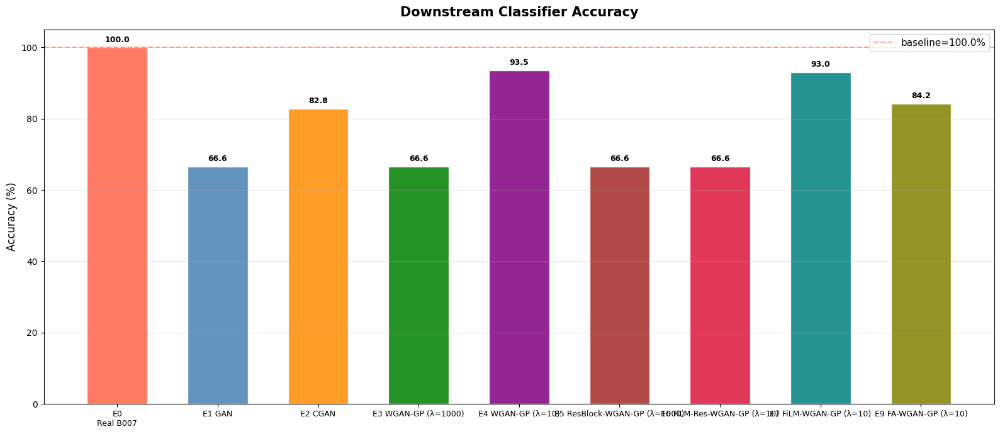

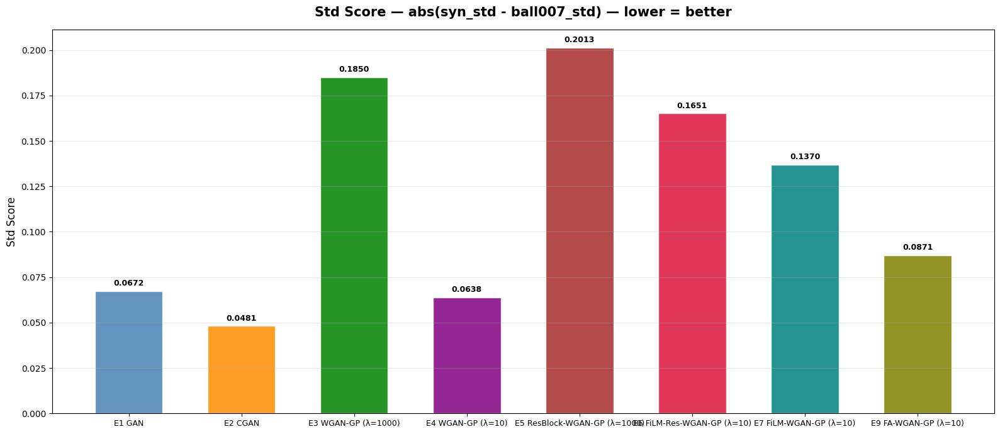

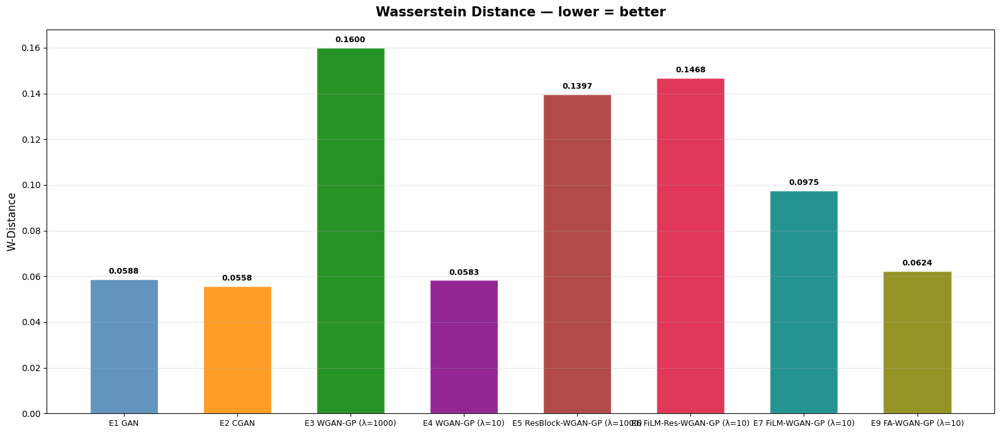

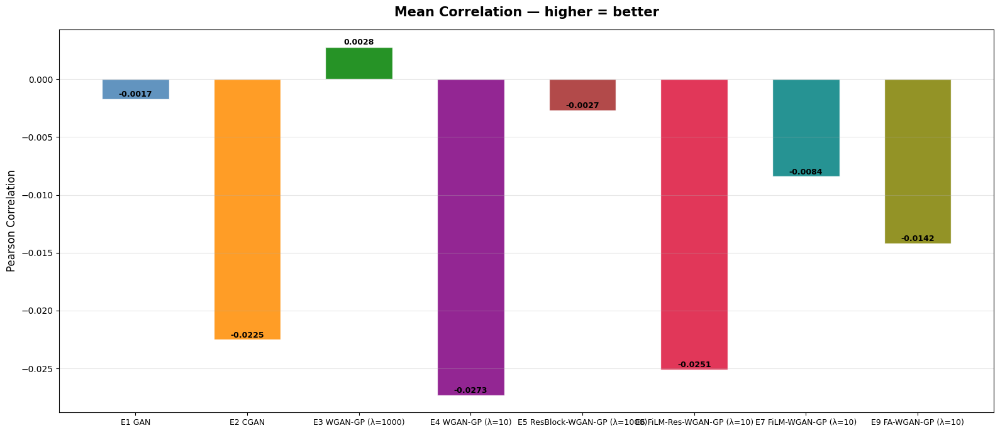

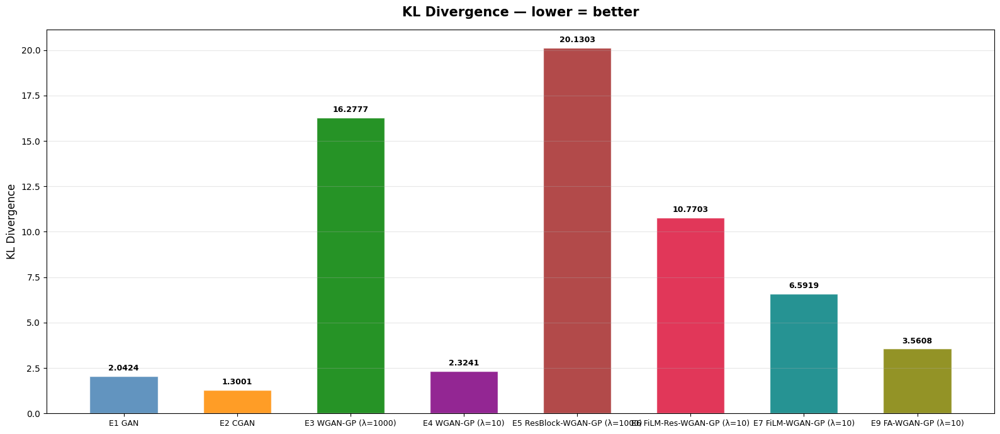


  FINAL VERDICT
  Best model     : E4 WGAN-GP (λ=10)
  Classifier acc : 93.50%
  vs Real B007   : 100.00%
  Gap            : 6.50%
  Std score      : 0.0638
  Wasserstein    : 0.0583
  Correlation    : -0.0273
  KL divergence  : 2.3241


In [ ]:
# ── Full comparison table ─────────────────────────────────────────────
print(f"\n{'='*85}")
print(f"  FULL COMPARISON TABLE")
print(f"{'='*85}")
print(f"  {'Exp':<28} {'Std↓':>8} {'W-Dist↓':>9} "
      f"{'Corr↑':>8} {'KL↓':>8} {'Clf Acc↑':>10} {'Gap':>8}")
print(f"  {'─'*80}")
print(f"  {'E0 Real B007':<28} {'0.0000':>8} {'0.0000':>9} "
      f"{'1.0000':>8} {'0.0000':>8} {acc_real:>9.2f}% {'─':>8}")
for name, res in RESULTS_TABLE.items():
    gap = acc_real - res["clf_acc"]
    print(f"  {name:<28} {res['std_score']:>8.4f} "
          f"{res['w_dist']:>9.4f} "
          f"{res['corr']:>8.4f} "
          f"{res['kl']:>8.4f} "
          f"{res['clf_acc']:>9.2f}% "
          f"{gap:>7.2f}%")
print(f"{'='*85}")

# ── Color palette — auto scales to any number of experiments ──────────
ALL_COLORS = [
    "tomato", "steelblue", "darkorange", "green",
    "purple", "brown", "crimson", "teal",
    "olive", "navy", "coral", "darkgreen"
]

n_exp      = len(RESULTS_TABLE)
exp_names  = ["E0\nReal B007"] + list(RESULTS_TABLE.keys())
accs       = [acc_real] + [r["clf_acc"] for r in RESULTS_TABLE.values()]
colors_clf = ALL_COLORS[:n_exp + 1]   # +1 for E0

std_names  = list(RESULTS_TABLE.keys())
std_colors = ALL_COLORS[1:n_exp + 1]  # skip tomato (used for E0)

# ── Helper — draw one bar chart ───────────────────────────────────────
def plot_bar(names, vals, colors, title, ylabel,
             baseline=None, fmt=".4f", figsize=(16, 7)):
    fig, ax = plt.subplots(figsize=figsize)
    bars    = ax.bar(names, vals, color=colors,
                     alpha=0.85, edgecolor="white", width=0.6)
    if baseline is not None:
        ax.axhline(y=baseline, color="tomato", linestyle="--",
                   alpha=0.5, label=f"baseline={baseline:.1f}%")
        ax.legend(fontsize=11)
    ax.set_title(title, fontsize=15, fontweight="bold", pad=15)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.grid(True, alpha=0.3, axis="y")
    ax.tick_params(axis='x', labelsize=9)
    for bar, v in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(vals) * 0.01,
                f"{v:{fmt}}", ha="center",
                va="bottom", fontsize=9, fontweight="bold")
    plt.tight_layout()
    plt.show()

# ── Plot 1: Classifier Accuracy ───────────────────────────────────────
plot_bar(exp_names, accs, colors_clf,
         title    = "Downstream Classifier Accuracy",
         ylabel   = "Accuracy (%)",
         baseline = acc_real,
         fmt      = ".1f")

# ── Plot 2: Std Score ─────────────────────────────────────────────────
plot_bar(std_names,
         [r["std_score"] for r in RESULTS_TABLE.values()],
         std_colors,
         title  = "Std Score — abs(syn_std - ball007_std) — lower = better",
         ylabel = "Std Score")

# ── Plot 3: Wasserstein Distance ──────────────────────────────────────
plot_bar(std_names,
         [r["w_dist"] for r in RESULTS_TABLE.values()],
         std_colors,
         title  = "Wasserstein Distance — lower = better",
         ylabel = "W-Distance")

# ── Plot 4: Mean Correlation ──────────────────────────────────────────
plot_bar(std_names,
         [r["corr"] for r in RESULTS_TABLE.values()],
         std_colors,
         title  = "Mean Correlation — higher = better",
         ylabel = "Pearson Correlation")

# ── Plot 5: KL Divergence ─────────────────────────────────────────────
plot_bar(std_names,
         [r["kl"] for r in RESULTS_TABLE.values()],
         std_colors,
         title  = "KL Divergence — lower = better",
         ylabel = "KL Divergence")

# ── Final verdict ─────────────────────────────────────────────────────
best_model = max(RESULTS_TABLE.items(),
                 key=lambda x: x[1]["clf_acc"])

print(f"\n{'='*65}")
print(f"  FINAL VERDICT")
print(f"{'='*65}")
print(f"  Best model     : {best_model[0]}")
print(f"  Classifier acc : {best_model[1]['clf_acc']:.2f}%")
print(f"  vs Real B007   : {acc_real:.2f}%")
print(f"  Gap            : {acc_real - best_model[1]['clf_acc']:.2f}%")
print(f"  Std score      : {best_model[1]['std_score']:.4f}")
print(f"  Wasserstein    : {best_model[1]['w_dist']:.4f}")
print(f"  Correlation    : {best_model[1]['corr']:.4f}")
print(f"  KL divergence  : {best_model[1]['kl']:.4f}")
print(f"{'='*65}")


## Final Comparison 2: Signal Structure Similarity

This comparison checks whether each synthetic Ball007 dataset preserves the real signal structure using ACF similarity, envelope-spectrum similarity, and PSD similarity.



  FULL STRUCTURE COMPARISON — REAL BALL007 vs SYNTHETIC BALL007
  Experiment                                ACF↑    Envelope↑      PSD↑      Avg↑
  ──────────────────────────────────────────────────────────────────────────────────────
  E1 GAN                                  0.2583       0.7143    0.1370    0.3699
  E2 CGAN                                 0.8196       0.9168    0.8411    0.8592
  E3 WGAN-GP (λ=1000)                     0.5050       0.8346    0.5222    0.6206
  E4 WGAN-GP (λ=10)                       0.9345       0.9491    0.9592    0.9476
  E5 ResBlock-WGAN-GP (λ=1000)            0.8430       0.8286    0.8759    0.8492
  E6 FiLM-Res-WGAN-GP (λ=10)              0.8926       0.8199    0.9115    0.8747
  E7 FiLM-WGAN-GP (λ=10)                  0.8124       0.8305    0.8066    0.8165
  E9 FA-WGAN-GP (λ=10)                    0.9179       0.9274    0.9472    0.9308
  Best structure match: E4 WGAN-GP (λ=10) (avg=0.9476)


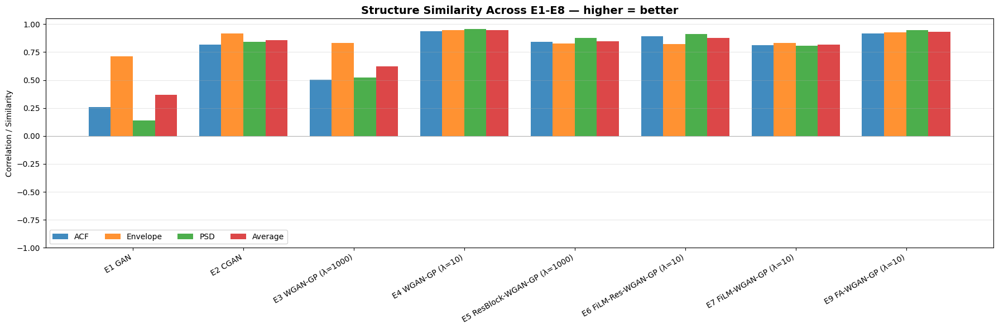

In [ ]:
# ── Full structure comparison across E1-E8 ───────────────────────────
from statsmodels.tsa.stattools import acf
from scipy.signal import hilbert, welch
from scipy.fft import fft, fftfreq
from scipy.stats import pearsonr


def _corr(a, b):
    a, b = np.asarray(a), np.asarray(b)
    if np.std(a) < 1e-12 or np.std(b) < 1e-12:
        return np.nan
    return float(pearsonr(a, b)[0])


def evaluate_structure_metrics(syn_sigs, real_sigs, fs=12000, nlags=100, n_samples=50):
    n = min(n_samples, len(syn_sigs), len(real_sigs))
    syn_sigs, real_sigs = syn_sigs[:n], real_sigs[:n]

    syn_acf  = np.mean([acf(s, nlags=nlags, fft=True) for s in syn_sigs], axis=0)
    real_acf = np.mean([acf(s, nlags=nlags, fft=True) for s in real_sigs], axis=0)

    def envelope_spectrum(sig):
        env = np.abs(hilbert(sig))
        spec = np.abs(fft(env))
        freq = fftfreq(len(sig), 1 / fs)
        mask = freq > 0
        return freq[mask], spec[mask]

    freqs = envelope_spectrum(real_sigs[0])[0]
    syn_env  = np.mean([envelope_spectrum(s)[1] for s in syn_sigs], axis=0)
    real_env = np.mean([envelope_spectrum(s)[1] for s in real_sigs], axis=0)

    syn_psd, real_psd = [], []
    for s in syn_sigs:
        _, p = welch(s, fs=fs, nperseg=256)
        syn_psd.append(p)
    for s in real_sigs:
        _, p = welch(s, fs=fs, nperseg=256)
        real_psd.append(p)
    syn_psd, real_psd = np.mean(syn_psd, axis=0), np.mean(real_psd, axis=0)

    return {
        "acf_sim": round(_corr(syn_acf, real_acf), 4),
        "env_sim": round(_corr(syn_env, real_env), 4),
        "psd_sim": round(_corr(syn_psd, real_psd), 4),
        "curves": {
            "syn_acf": syn_acf, "real_acf": real_acf,
            "freqs": freqs, "syn_env": syn_env, "real_env": real_env,
            "syn_psd": syn_psd, "real_psd": real_psd,
        },
    }


real_b007_struct = normalize_segments(segment_signal(ball007_sig, WINDOW_SIZE))
STRUCTURE_TABLE = {}

for exp_name, result in RESULTS_TABLE.items():
    if "syn" not in result:
        print(f"  Skipping {exp_name}: no synthetic signals stored")
        continue

    metrics = evaluate_structure_metrics(result["syn"], real_b007_struct)
    STRUCTURE_TABLE[exp_name] = {
        "acf_sim": metrics["acf_sim"],
        "env_sim": metrics["env_sim"],
        "psd_sim": metrics["psd_sim"],
    }
    RESULTS_TABLE[exp_name].update(STRUCTURE_TABLE[exp_name])

print(f"\n{'=' * 92}")
print("  FULL STRUCTURE COMPARISON — REAL BALL007 vs SYNTHETIC BALL007")
print(f"{'=' * 92}")
print(f"  {'Experiment':<36} {'ACF↑':>9} {'Envelope↑':>12} {'PSD↑':>9} {'Avg↑':>9}")
print(f"  {'─' * 86}")

for exp_name, res in STRUCTURE_TABLE.items():
    avg_sim = np.nanmean([res["acf_sim"], res["env_sim"], res["psd_sim"]])
    res["avg_structure_sim"] = round(avg_sim, 4)
    RESULTS_TABLE[exp_name]["avg_structure_sim"] = round(avg_sim, 4)
    print(f"  {exp_name:<36} {res['acf_sim']:>9.4f} {res['env_sim']:>12.4f} "
          f"{res['psd_sim']:>9.4f} {avg_sim:>9.4f}")

best_structure = max(STRUCTURE_TABLE.items(),
                     key=lambda x: x[1]["avg_structure_sim"])
print(f"{'=' * 92}")
print(f"  Best structure match: {best_structure[0]} "
      f"(avg={best_structure[1]['avg_structure_sim']:.4f})")
print(f"{'=' * 92}")

# ── Bar comparison ───────────────────────────────────────────────────
metric_names = ["acf_sim", "env_sim", "psd_sim", "avg_structure_sim"]
metric_labels = ["ACF", "Envelope", "PSD", "Average"]
exp_names = list(STRUCTURE_TABLE.keys())
x = np.arange(len(exp_names))
width = 0.2

fig, ax = plt.subplots(figsize=(18, 6))
for i, (metric, label) in enumerate(zip(metric_names, metric_labels)):
    vals = [STRUCTURE_TABLE[name][metric] for name in exp_names]
    ax.bar(x + (i - 1.5) * width, vals, width, label=label, alpha=0.85)

ax.set_title("Structure Similarity Across E1-E8 — higher = better",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Correlation / Similarity")
ax.set_xticks(x)
ax.set_xticklabels(exp_names, rotation=30, ha="right")
ax.set_ylim(-1.0, 1.05)
ax.axhline(y=0, color="gray", linewidth=0.8, alpha=0.5)
ax.legend(ncol=4)
ax.grid(True, axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
WINDOW_SIZE = 1024

  Loaded ← /content/drive/MyDrive/ml_project/checkpoints/best_wgangp2.pth
2D SPECTROGRAM RESULT — FROM E4 WGAN-GP λ=10
Normal specs shape    : (50, 64, 64)
Synthetic specs shape : (50, 64, 64)
Ball007 specs shape   : (50, 64, 64)
------------------------------------------------------------
Normal spec std       : 0.1328
Synthetic spec std    : 0.1182
Real Ball007 spec std : 0.1052


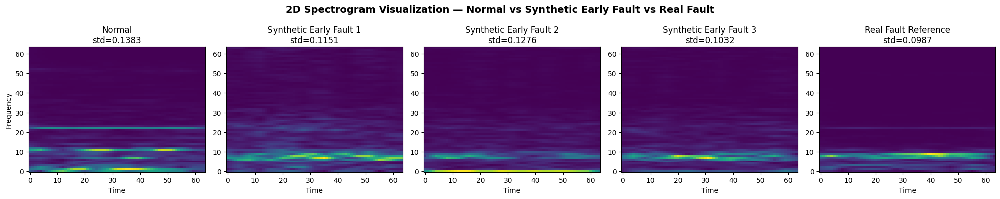

In [ ]:
# 2D SPECTROGRAM RESULTS FROM BEST 1D MODEL — E4 WGAN-GP λ=10
# Normal vs Synthetic Ball007 vs Real Ball007

from scipy.signal import stft
from scipy.ndimage import zoom

def signal_to_spectrogram_64(signal, fs=12000, nperseg=256, noverlap=192, img_size=64):
    """
    Convert a 1D vibration signal into a normalized 64x64 STFT spectrogram.
    """
    _, _, Zxx = stft(
        signal.astype(np.float32),
        fs=fs,
        nperseg=nperseg,
        noverlap=noverlap
    )

    spec = np.abs(Zxx)
    spec = np.log1p(spec)

    spec = (spec - spec.min()) / (spec.max() - spec.min() + 1e-8)

    zoom_y = img_size / spec.shape[0]
    zoom_x = img_size / spec.shape[1]
    spec_64 = zoom(spec, (zoom_y, zoom_x), order=1)

    return spec_64[:img_size, :img_size]


def segments_to_spectrograms_64(segments):
    return np.array([signal_to_spectrogram_64(seg) for seg in segments])


# ── Prepare real Normal and Ball007 segments ─────────────────────────
normal_segs_2d = normalize_segments(
    segment_signal(normal_sig, WINDOW_SIZE)
)

ball007_segs_2d = normalize_segments(
    segment_signal(ball007_sig, WINDOW_SIZE)
)

normal_specs = segments_to_spectrograms_64(normal_segs_2d[:50])
ball007_specs = segments_to_spectrograms_64(ball007_segs_2d[:50])

normal_spec_std = normal_specs.std()
ball007_spec_std = ball007_specs.std()


# ── Generate synthetic Ball007 from best model: E4 WGAN-GP λ=10 ───────
BEST_2D_SOURCE_MODEL = "best_wgangp2.pth"

G_best = generate_synthetic(
    WGANGP_Generator,
    BEST_2D_SOURCE_MODEL,
    n=500,
    alpha=SEVERITY_TARGET,
    conditioned=True
)

synthetic_specs = segments_to_spectrograms_64(G_best[:50])
synthetic_spec_std = synthetic_specs.std()

print("=" * 60)
print("2D SPECTROGRAM RESULT — FROM E4 WGAN-GP λ=10")
print("=" * 60)
print(f"Normal specs shape    : {normal_specs.shape}")
print(f"Synthetic specs shape : {synthetic_specs.shape}")
print(f"Ball007 specs shape   : {ball007_specs.shape}")
print("-" * 60)
print(f"Normal spec std       : {normal_spec_std:.4f}")
print(f"Synthetic spec std    : {synthetic_spec_std:.4f}")
print(f"Real Ball007 spec std : {ball007_spec_std:.4f}")
print("=" * 60)


# ── Plot like the example image ───────────────────────────────────────
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

fig.suptitle(
    "2D Spectrogram Visualization — Normal vs Synthetic Early Fault vs Real Fault",
    fontsize=14,
    fontweight="bold"
)

axes[0].imshow(normal_specs[0], cmap="viridis", origin="lower", aspect="auto")
axes[0].set_title(f"Normal\nstd={normal_specs[0].std():.4f}")
axes[0].set_xlabel("Time")
axes[0].set_ylabel("Frequency")

for i in range(3):
    axes[i + 1].imshow(
        synthetic_specs[i],
        cmap="viridis",
        origin="lower",
        aspect="auto"
    )
    axes[i + 1].set_title(
    f"Synthetic Early Fault {i+1}\nstd={synthetic_specs[i].std():.4f}"
)

    axes[i + 1].set_xlabel("Time")

axes[4].imshow(ball007_specs[0], cmap="viridis", origin="lower", aspect="auto")
axes[4].set_title(f"Real Fault Reference\nstd={ball007_specs[0].std():.4f}")
axes[4].set_xlabel("Time")

plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import wasserstein_distance, pearsonr

n = min(len(synthetic_specs), len(ball007_specs))

syn_flat = synthetic_specs[:n].reshape(n, -1)
real_flat = ball007_specs[:n].reshape(n, -1)

corrs = []
for i in range(n):
    c, _ = pearsonr(syn_flat[i], real_flat[i])
    corrs.append(c)

mean_corr = np.mean(corrs)

w_dist = wasserstein_distance(
    synthetic_specs[:n].flatten(),
    ball007_specs[:n].flatten()
)

std_score_2d = abs(synthetic_specs.std() - ball007_specs.std())

print("=" * 60)
print("2D SPECTROGRAM QUALITY METRICS")
print("=" * 60)
print(f"Std score        : {std_score_2d:.4f}")
print(f"Wasserstein dist : {w_dist:.4f}")
print(f"Mean correlation : {mean_corr:.4f}")
print("=" * 60)

2D SPECTROGRAM QUALITY METRICS
Std score        : 0.0130
Wasserstein dist : 0.0232
Mean correlation : 0.7185


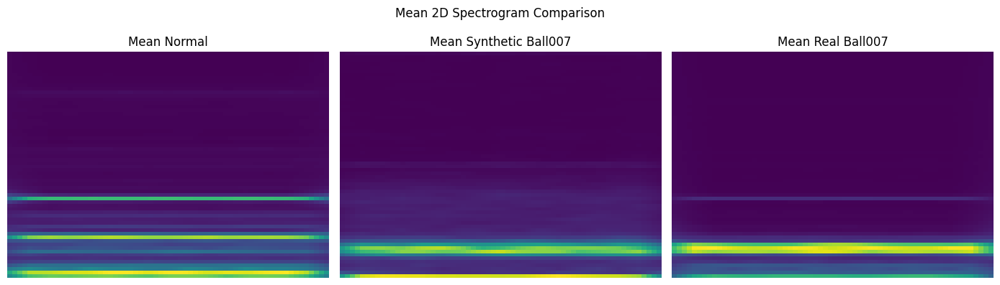

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].imshow(normal_specs.mean(axis=0), cmap="viridis", origin="lower", aspect="auto")
axes[0].set_title("Mean Normal")
axes[0].axis("off")

axes[1].imshow(synthetic_specs.mean(axis=0), cmap="viridis", origin="lower", aspect="auto")
axes[1].set_title("Mean Synthetic Ball007")
axes[1].axis("off")

axes[2].imshow(ball007_specs.mean(axis=0), cmap="viridis", origin="lower", aspect="auto")
axes[2].set_title("Mean Real Ball007")
axes[2].axis("off")

plt.suptitle("Mean 2D Spectrogram Comparison")
plt.tight_layout()
plt.show()